# Load packages and functions

In [1]:
import pandas as pd
import numpy as np
import os
from collections import defaultdict
import seaborn as sns
import matplotlib
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
import palettable
import plotly_express as px
from plotnine import *
from sklearn.metrics import mutual_info_score, accuracy_score, roc_curve, auc, f1_score, roc_auc_score, average_precision_score
import sklearn.metrics as sk
import scanpy as sc
import anndata as ad
from typing import Any, Callable, Optional, Union
from plottable import ColumnDefinition, Table
from plottable.cmap import normed_cmap
from plottable.plots import bar
from pysankey2.datasets import load_fruits
from pysankey2.utils import setColorConf
from pysankey2 import Sankey
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import cdist
from scipy import stats
from rogi import RoughnessIndex
from scipy.stats import pearsonr, spearmanr, kendalltau
import json
import itertools
plt.rcParams['font.family'] = 'sans-serif'

In [2]:
# Ref: https://github.com/biomed-AI/GraphCS
def accuracy_for_unkonw(preds, output_ratio, labels, number_unkonw, cut_off_ratio=0):
    total_konw_cells=len(labels)-number_unkonw
    index = np.where(np.array(output_ratio) > cut_off_ratio)[0]

    labels = labels[index]
    preds = preds[index]

    correct=sum(preds==labels)

    # print("correct, total_konw_cells: ", correct, total_konw_cells)
    return correct / total_konw_cells


def get_FPR(unknown_cell, FPR=0.05):
    number_unkonw = len(unknown_cell)
    cut_off_ratio = sorted(unknown_cell, reverse=True)[int(number_unkonw*FPR)]

    # print("cut_off_ratio value: ", cut_off_ratio)
    return cut_off_ratio, number_unkonw

In [3]:
# Ref: https://github.com/wetliu/energy_ood/blob/master/utils/display_results.py
def stable_cumsum(arr, rtol=1e-05, atol=1e-08):
    """Use high precision for cumsum and check that final value matches sum
    Parameters
    ----------
    arr : array-like
        To be cumulatively summed as flat
    rtol : float
        Relative tolerance, see ``np.allclose``
    atol : float
        Absolute tolerance, see ``np.allclose``
    """
    out = np.cumsum(arr, dtype=np.float64)
    expected = np.sum(arr, dtype=np.float64)
    if not np.allclose(out[-1], expected, rtol=rtol, atol=atol):
        raise RuntimeError('cumsum was found to be unstable: '
                           'its last element does not correspond to sum')
    return out

def fpr_and_fdr_at_recall(y_true, y_score, recall_level=0.95, pos_label=None):
    classes = np.unique(y_true)
    if (pos_label is None and
            not (np.array_equal(classes, [0, 1]) or
                 np.array_equal(classes, [-1, 1]) or
                 np.array_equal(classes, [0]) or
                 np.array_equal(classes, [-1]) or
                 np.array_equal(classes, [1]))):
        raise ValueError("Data is not binary and pos_label is not specified")
    elif pos_label is None:
        pos_label = 1.

    # make y_true a boolean vector
    y_true = (y_true == pos_label)

    # sort scores and corresponding truth values
    desc_score_indices = np.argsort(y_score, kind="mergesort")[::-1]
    y_score = y_score[desc_score_indices]
    y_true = y_true[desc_score_indices]

    # y_score typically has many tied values. Here we extract
    # the indices associated with the distinct values. We also
    # concatenate a value for the end of the curve.
    distinct_value_indices = np.where(np.diff(y_score))[0]
    threshold_idxs = np.r_[distinct_value_indices, y_true.size - 1]

    # accumulate the true positives with decreasing threshold
    tps = stable_cumsum(y_true)[threshold_idxs]
    fps = 1 + threshold_idxs - tps      # add one because of zero-based indexing

    thresholds = y_score[threshold_idxs]

    recall = tps / tps[-1]

    last_ind = tps.searchsorted(tps[-1])
    sl = slice(last_ind, None, -1)      # [last_ind::-1]
    recall, fps, tps, thresholds = np.r_[recall[sl], 1], np.r_[fps[sl], 0], np.r_[tps[sl], 0], thresholds[sl]

    cutoff = np.argmin(np.abs(recall - recall_level))

    return fps[cutoff] / (np.sum(np.logical_not(y_true)))   # fps[cutoff]/(fps[cutoff] + tps[cutoff])


def get_measures(y_true, y_pred, recall_level=0.95):
    auroc = sk.roc_auc_score(y_true, y_pred)
    aupr = sk.average_precision_score(y_true, y_pred)
    fpr = fpr_and_fdr_at_recall(y_true, y_pred, recall_level)

    return auroc, aupr, fpr

In [4]:
# def dominates(x, y):
#     """
#     检查解x是否支配解y
#     """
#     if (x >= y).all() and not (x == y).all():
#         return True
#     else:
#         return False

def dominates(p_metrics, q_metrics, epsilon=0.001):
    """
    Return True if p dominates q, considering that being worse by ≤ epsilon is acceptable.
    """
    better_in_at_least_one = False
    for p_val, q_val in zip(p_metrics, q_metrics):
        if p_val > q_val:  # p 比 q 好
            better_in_at_least_one = True
        elif q_val - p_val > epsilon:  
            # p 比 q 差，而且差距超过 epsilon，不可接受
            return False
    return better_in_at_least_one
        
def non_dominated_sort(population):
    # model_name: metrics
    fronts = [[]]  # 记录非支配前沿
    # S = []  # 支配的个体列表 
    # n_dominated = np.zeros(len(population))  # 每个个体被支配的个体数量
    S = defaultdict(list)
    n_dominated = defaultdict(int)
    
    for p in population.keys():
        # S.append([])  # 初始化支配个体的列表
        for q in population.keys():
            if dominates(population[p], population[q]):
                S[p].append(q)
            elif dominates(population[q], population[p]):
                n_dominated[p] += 1

        if n_dominated[p] == 0:
            fronts[0].append(p)  # p 是第一前沿的一部分

    i = 0
    while fronts[i]:
        Q = []  # 下一前沿
        for p in fronts[i]:
            for q in S[p]:
                n_dominated[q] -= 1
                if n_dominated[q] == 0:
                    Q.append(q)  # q 是下一前沿的一部分
        i += 1
        fronts.append(Q)  # 记录下一前沿

    return fronts[:-1]  # 返回前沿（去掉空列表）

In [5]:
_METRIC_TYPE = "Metric Type"
_AGGREGATE_SCORE = "Aggregate score"
def plot_results_table(
    df, min_max_scale: bool = True, show: bool = True, ouput_file: Optional[str] = None, sort_col="Overall"
) -> Table:
    """Plot the benchmarking results.

    Parameters
    ----------
    min_max_scale
        Whether to min max scale the results.
    show
        Whether to show the plot.
    ouput_file
        The directory to save the plot to. If `None`, the plot is not saved.
    """
    # num_embeds = len(self._embedding_obsm_keys)
    num_embeds = len(df.columns)-1
    cmap_fn = lambda col_data: normed_cmap(col_data, cmap=matplotlib.cm.PRGn, num_stds=2.5)
    # df = self.get_results(min_max_scale=min_max_scale)
    # Do not want to plot what kind of metric it is
    plot_df = df.drop(_METRIC_TYPE, axis=0)
    # Sort by total score
    plot_df = plot_df.sort_values(by=sort_col, ascending=False).astype(np.float64)
    plot_df["Method"] = plot_df.index

    # Split columns by metric type, using df as it doesn't have the new method col
    score_cols = df.columns[df.loc[_METRIC_TYPE] == _AGGREGATE_SCORE]
    other_cols = df.columns[df.loc[_METRIC_TYPE] != _AGGREGATE_SCORE]
    column_definitions = [
        ColumnDefinition("Method", width=1.5, textprops={"ha": "left", "weight": "bold"}),
    ]
    # Circles for the metric values
    column_definitions += [
        ColumnDefinition(
            col,
            title=col.replace(" ", "\n", 1),
            width=1,
            textprops={
                "ha": "center",
                "bbox": {"boxstyle": "circle", "pad": 0.25},
            },
            cmap=cmap_fn(plot_df[col]),
            group=df.loc[_METRIC_TYPE, col],
            formatter="{:.2f}",
        )
        for i, col in enumerate(other_cols)
    ]
    # Bars for the aggregate scores
    column_definitions += [
        ColumnDefinition(
            col,
            width=1,
            title=col.replace(" ", "\n", 1),
            plot_fn=bar,
            plot_kw={
                "cmap": matplotlib.cm.YlGnBu,
                "plot_bg_bar": False,
                "annotate": True,
                "height": 0.9,
                "formatter": "{:.3f}",
                "alpha": 0.6, 
            },
            group=df.loc[_METRIC_TYPE, col],
            border="left" if i == 0 else None,
        )
        for i, col in enumerate(score_cols)
    ]
    # Allow to manipulate text post-hoc (in illustrator)
    with matplotlib.rc_context({"svg.fonttype": "none"}):
        fig, ax = plt.subplots(figsize=(len(df.columns) * 1.5, 3 + 0.6 * num_embeds), dpi=300)
        tab = Table(
            plot_df,
            cell_kw={
                "linewidth": 0,
                "edgecolor": "k",
            },
            column_definitions=column_definitions,
            ax=ax,
            row_dividers=True,
            footer_divider=True,
            textprops={"fontsize": 10, "ha": "center"},
            row_divider_kw={"linewidth": 1, "linestyle": (0, (1, 5))},
            col_label_divider_kw={"linewidth": 1, "linestyle": "-"},
            column_border_kw={"linewidth": 1, "linestyle": "-"},
            index_col="Method",
        ).autoset_fontcolors(colnames=plot_df.columns)
    if show:
        plt.show()
    if ouput_file is not None:
        fig.savefig(ouput_file, facecolor=ax.get_facecolor(), dpi=300, bbox_inches='tight')

    return tab

# Define plotting parameters

In [63]:
model_map_dict = {"X_geneformer": "Geneformer",
                  "X_langcell": "LangCell",
                  "X_scgpt": "scGPT",
                  "X_uce": "UCE",
                  "X_xtrimogene": "scFoundation",
                  "X_hvg": "HVG",
                  "X_scvi": "scVI",
                  "X_sccello": "scCello",
                  "X_harmony": "Harmony",
                  "X_seurat_cca": "Seurat_v5(CCA)",
                  "xTrimoGene": "scFoundation",
                  "Seurat_cca": "Seurat_v5(CCA)",
                  "LR_OvR": "LR(OvR)",
                #   "geneformer": "Geneformer",
                #   "langcell": "LangCell",
                #   "scgpt": "scGPT",
                #   "uce": "UCE",
                #   "sccello": "scCello",
                #   "harmony": "Harmony",
                #   "seurat_cca": "Seurat_v5(CCA)",
                  "X": "Raw",
                  "scVI_integrated_tissue": "scVI",
                  "scVI_integrated_dataset": "scVI"}

model_order_baseline = ["scVI", "Harmony", "Seurat_v5(CCA)"]
model_order_scFM = ["Geneformer", "scGPT", "UCE", "scFoundation", "LangCell", "scCello"]
model_order_wo_hvg = model_order_baseline + model_order_scFM
model_order = ["HVG"] + model_order_wo_hvg
#F2D1C9
colors = ["#999999", "#D6D6D6", "#E6CECF", "#A8CFC1", "#E89DA0", "#88CEE6", "#F6C8A8", "#B696B6", "#9FBA95", "#F2E1A7"]
custom_palette = {model: color for model, color in zip(model_order, colors[:len(model_order)])}
custom_palette["Raw"] = custom_palette["HVG"]
# shapes = ["o", "s", "p", "*", "^", "P", "X"]
shapes = ["h", "v", "D", "H", "o", "s", "p", "*", "^", "d"]
custom_shape = {model: shape for model, shape in zip(model_order, shapes[:len(model_order)])}
custom_shape["Raw"] = custom_shape["HVG"]

In [30]:
dataset_map_dict = {"pancreas_scib": "Pancreas", 
                    "Immune_all_human": "Immune", 
                    "HLCA_core": "HLCA", 
                    "Tabula_Sapiens_all": "Tabula Sapiens",
                    "AIDA_v2_new": "AIDA v2"}
dataset_info_dict = {
    "pancreas_scib": {
        "layer_key": "counts",
        "batch_key": "batch",
    },
    "Immune_all_human": {
        "layer_key": "counts",
        "batch_key": "batch",
    },
    "HLCA_core": {
        "layer_key": "X",
        "batch_key": "dataset",
    },
    "Tabula_Sapiens_all": {
        "layer_key": "X",
        "batch_key": "tissue_in_publication",
    },
    "AIDA_v2_new": {
        "layer_key": "X",
        "batch_key": "donor_id",
    }
}

In [45]:
cluster_models = ["HVG", "scVI", "Harmony", "Seurat_cca", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell", "scCello"]
cluster_datasets = ["pancreas_scib", "Immune_all_human", "HLCA_core", "Tabula_Sapiens_all", "AIDA_v2_new"]

In [62]:
annotation_models = ["LR_OvR", "scVI", "Harmony", "Seurat_cca", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell", "scCello"]

In [9]:
params_file = "../OnClass/results_gridsearch/model_to_params.json"
with open(params_file, "r") as f:
    model_to_params = json.load(f)

# Define path

In [10]:
data_folder = "/mnt/nvme/extra_data/wujialu/scFM-Bench/data"
output_folder = "/mnt/nvme/extra_data/wujialu/scFM-Bench/output"

# Clustering

## Pancreas_scib

In [31]:
pd.set_option('display.precision', 4) 
dataset_name = "pancreas_scib"
layer_key = dataset_info_dict[dataset_name]["layer_key"]
df = pd.DataFrame()
for model in cluster_models:
    result_path = os.path.join(output_folder, dataset_name, layer_key, model, "clustering_metrics.csv")
    df_ = pd.read_csv(result_path, index_col=0)
    df = pd.concat([df, df_], axis=1)
df.rename(columns=model_map_dict, inplace=True)
df

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello
NMI_cluster/label,0.8245,0.9055,0.9158,0.9118,0.3706,0.6229,0.5934,0.5631,0.5657,0.7986
ARI_cluster/label,0.7655,0.9383,0.9457,0.9425,0.1510,0.4046,0.4068,0.3705,0.3214,0.7809
ASW_label,0.5660,0.5684,0.6908,0.6371,0.3742,0.5307,0.5482,0.5260,0.5165,0.6148
graph_conn,0.9634,0.9918,0.9861,0.9802,0.6935,0.9161,0.9136,0.8761,0.8681,0.9445
ASW_label/batch,0.9396,0.8708,0.8429,0.8454,0.5306,0.8494,0.8412,0.7929,0.7921,0.8643
avg_bio,0.7187,0.8040,0.8508,0.8305,0.2986,0.5194,0.5161,0.4865,0.4679,0.7314
avg_batch,0.9515,0.9313,0.9145,0.9128,0.6121,0.8827,0.8774,0.8345,0.8301,0.9044
overall,0.8118,0.8549,0.8763,0.8634,0.4240,0.6647,0.6606,0.6257,0.6128,0.8006


In [32]:
scib_metrics_dict = {"NMI_cluster/label": "NMI", 
                     "ARI_cluster/label": "ARI", 
                     "ASW_label": r"ASW$_{cell}$", 
                     "ASW_label/batch": r"ASW$_{batch}$",
                     "avg_bio": "AvgBio",
                     "avg_batch": "AvgBatch",
                     "overall": "Overall"}
df.rename(index=scib_metrics_dict, inplace=True)
df

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello
NMI,0.8245,0.9055,0.9158,0.9118,0.3706,0.6229,0.5934,0.5631,0.5657,0.7986
ARI,0.7655,0.9383,0.9457,0.9425,0.1510,0.4046,0.4068,0.3705,0.3214,0.7809
ASW$_{cell}$,0.5660,0.5684,0.6908,0.6371,0.3742,0.5307,0.5482,0.5260,0.5165,0.6148
graph_conn,0.9634,0.9918,0.9861,0.9802,0.6935,0.9161,0.9136,0.8761,0.8681,0.9445
ASW$_{batch}$,0.9396,0.8708,0.8429,0.8454,0.5306,0.8494,0.8412,0.7929,0.7921,0.8643
AvgBio,0.7187,0.8040,0.8508,0.8305,0.2986,0.5194,0.5161,0.4865,0.4679,0.7314
AvgBatch,0.9515,0.9313,0.9145,0.9128,0.6121,0.8827,0.8774,0.8345,0.8301,0.9044
Overall,0.8118,0.8549,0.8763,0.8634,0.4240,0.6647,0.6606,0.6257,0.6128,0.8006


In [33]:
# avg_bio and avg_batch
keys = df.columns
values = df.iloc[-3:-1,:].values.transpose(1,0)
population = {k:v for k,v in zip(keys, values)}
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

Front 1: ['HVG', 'scVI', 'Harmony']
Front 2: ['Seurat_v5(CCA)']
Front 3: ['scCello']
Front 4: ['scGPT']
Front 5: ['UCE']
Front 6: ['scFoundation']
Front 7: ['LangCell']
Front 8: ['Geneformer']


In [34]:
df[_METRIC_TYPE] = ["Bio conservation", "Bio conservation", "Bio conservation", 
                    "Batch correction", "Batch correction",
                    _AGGREGATE_SCORE, _AGGREGATE_SCORE, _AGGREGATE_SCORE]
df

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello,Metric Type
NMI,0.8245,0.9055,0.9158,0.9118,0.3706,0.6229,0.5934,0.5631,0.5657,0.7986,Bio conservation
ARI,0.7655,0.9383,0.9457,0.9425,0.1510,0.4046,0.4068,0.3705,0.3214,0.7809,Bio conservation
ASW$_{cell}$,0.5660,0.5684,0.6908,0.6371,0.3742,0.5307,0.5482,0.5260,0.5165,0.6148,Bio conservation
graph_conn,0.9634,0.9918,0.9861,0.9802,0.6935,0.9161,0.9136,0.8761,0.8681,0.9445,Batch correction
ASW$_{batch}$,0.9396,0.8708,0.8429,0.8454,0.5306,0.8494,0.8412,0.7929,0.7921,0.8643,Batch correction
AvgBio,0.7187,0.8040,0.8508,0.8305,0.2986,0.5194,0.5161,0.4865,0.4679,0.7314,Aggregate score
AvgBatch,0.9515,0.9313,0.9145,0.9128,0.6121,0.8827,0.8774,0.8345,0.8301,0.9044,Aggregate score
Overall,0.8118,0.8549,0.8763,0.8634,0.4240,0.6647,0.6606,0.6257,0.6128,0.8006,Aggregate score


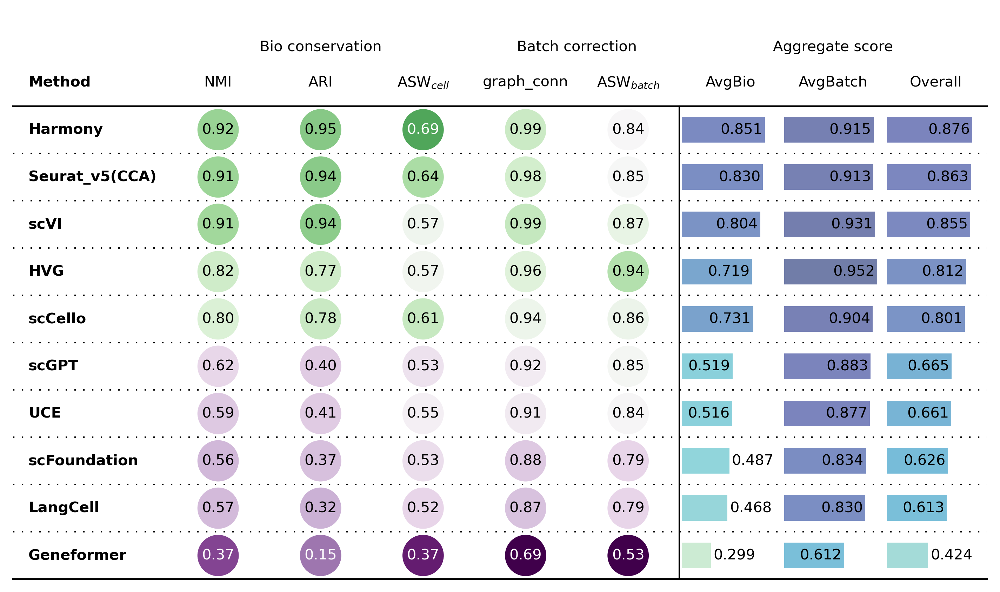

In [15]:
plot_results_table(df.T)

In [35]:
data = df.iloc[:, :-1].T
data["model"] = data.index
data["model_class"] = data["model"].apply(lambda x: "scFM" if x in model_order_scFM else "Baseline")
data

,NMI,ARI,ASW$_{cell}$,graph_conn,ASW$_{batch}$,AvgBio,AvgBatch,Overall,model,model_class
HVG,0.8245,0.7655,0.5660,0.9634,0.9396,0.7187,0.9515,0.8118,HVG,Baseline
scVI,0.9055,0.9383,0.5684,0.9918,0.8708,0.8040,0.9313,0.8549,scVI,Baseline
Harmony,0.9158,0.9457,0.6908,0.9861,0.8429,0.8508,0.9145,0.8763,Harmony,Baseline
Seurat_v5(CCA),0.9118,0.9425,0.6371,0.9802,0.8454,0.8305,0.9128,0.8634,Seurat_v5(CCA),Baseline
Geneformer,0.3706,0.1510,0.3742,0.6935,0.5306,0.2986,0.6121,0.4240,Geneformer,scFM
scGPT,0.6229,0.4046,0.5307,0.9161,0.8494,0.5194,0.8827,0.6647,scGPT,scFM
UCE,0.5934,0.4068,0.5482,0.9136,0.8412,0.5161,0.8774,0.6606,UCE,scFM
scFoundation,0.5631,0.3705,0.5260,0.8761,0.7929,0.4865,0.8345,0.6257,scFoundation,scFM
LangCell,0.5657,0.3214,0.5165,0.8681,0.7921,0.4679,0.8301,0.6128,LangCell,scFM
scCello,0.7986,0.7809,0.6148,0.9445,0.8643,0.7314,0.9044,0.8006,scCello,scFM


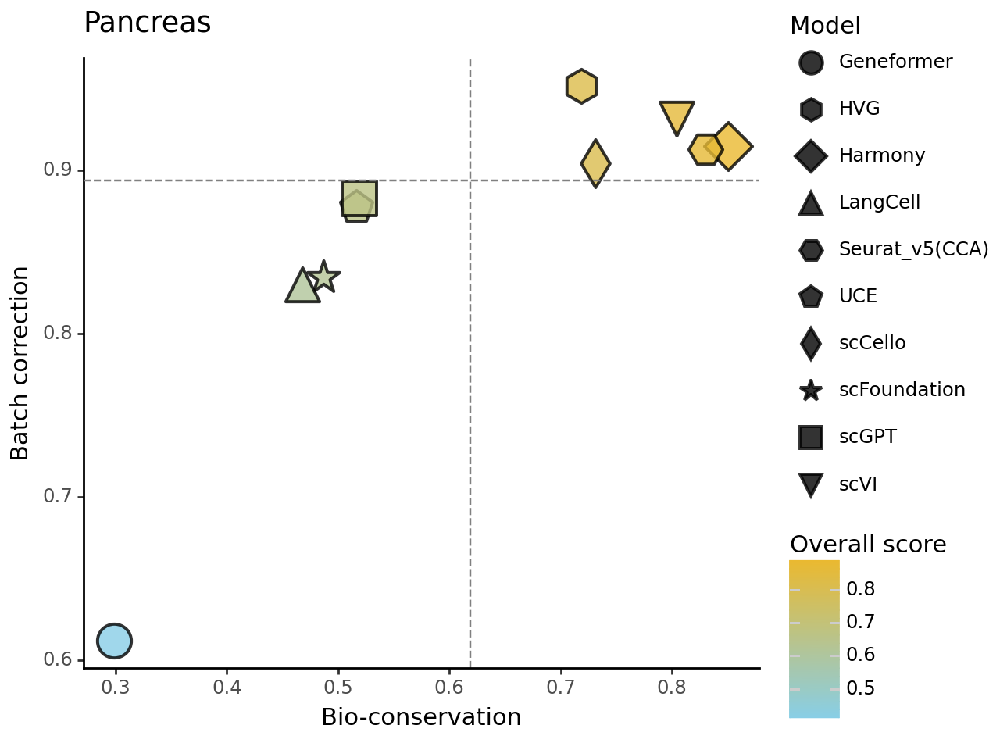

<Figure Size: (640 x 480)>

In [36]:
(
ggplot(data, aes(x='AvgBio', y='AvgBatch', shape='model')) 
+ geom_point(
    aes(fill='Overall', color="model_class"), 
    size=8, alpha=0.8, stroke=0.8
)
+ scale_shape_manual(custom_shape) 
+ scale_fill_gradient(low="#88CEE6", high="#EAB930", name='Overall score') 
+ scale_color_manual(values={'Baseline':'black', 'scFM':'black'}, name='Model class') 
+ guides(
    size=False,
    shape=guide_legend(title='Model', override_aes={'size':5}),
    fill=guide_colorbar(title='Overall score', barheight=10),
    color=False,
)
+ geom_vline(xintercept=data['AvgBio'].median(), linetype='dashed', color='grey') 
+ geom_hline(yintercept=data['AvgBatch'].median(), linetype='dashed', color='grey') 
+ xlab('Bio-conservation') 
+ ylab('Batch correction') 
+ ggtitle(dataset_map_dict[dataset_name]) 
+ theme_classic()
)

## Immune

In [ ]:
pd.set_option('display.precision', 4) 
dataset_name = "Immune_all_human"
layer_key = dataset_info_dict[dataset_name]["layer_key"]
df = pd.DataFrame()
for model in cluster_models:
    result_path = os.path.join(output_folder, dataset_name, layer_key, model, "clustering_metrics.csv")
    df_ = pd.read_csv(result_path, index_col=0)
    df = pd.concat([df, df_], axis=1)
df.rename(columns=model_map_dict, inplace=True)
df

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello
NMI_cluster/label,0.6736,0.8160,0.8129,0.7166,0.6200,0.6446,0.7732,0.6466,0.6836,0.7048
ARI_cluster/label,0.4835,0.8268,0.8209,0.6144,0.4481,0.5333,0.7212,0.2730,0.3875,0.4227
ASW_label,0.5119,0.5455,0.5739,0.5574,0.5073,0.5452,0.5603,0.5733,0.5463,0.5950
graph_conn,0.9530,0.9684,0.9555,0.9367,0.9088,0.8982,0.9365,0.8740,0.8682,0.9768
ASW_label/batch,0.9472,0.8948,0.8799,0.8527,0.8617,0.9018,0.8845,0.8250,0.8458,0.8411
avg_bio,0.5563,0.7294,0.7359,0.6295,0.5251,0.5744,0.6849,0.4976,0.5391,0.5742
avg_batch,0.9501,0.9316,0.9177,0.8947,0.8853,0.9000,0.9105,0.8495,0.8570,0.9089
overall,0.7139,0.8103,0.8086,0.7356,0.6692,0.7046,0.7751,0.6384,0.6663,0.7081


In [17]:
keys = df.columns
values = df.iloc[-3:-1,:].values.transpose(1,0)
population = {k:v for k,v in zip(keys, values)}
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

Front 1: ['HVG', 'scVI', 'Harmony']
Front 2: ['UCE']
Front 3: ['Seurat_v5(CCA)', 'scCello']
Front 4: ['scGPT']
Front 5: ['Geneformer', 'LangCell']
Front 6: ['scFoundation']


In [18]:
df.rename(index=scib_metrics_dict, inplace=True)
df[_METRIC_TYPE] = ["Bio conservation", "Bio conservation", "Bio conservation", 
                    "Batch correction", "Batch correction",
                    _AGGREGATE_SCORE, _AGGREGATE_SCORE, _AGGREGATE_SCORE]
df

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello,Metric Type
NMI,0.6736,0.8160,0.8129,0.7166,0.6200,0.6446,0.7732,0.6466,0.6836,0.7048,Bio conservation
ARI,0.4835,0.8268,0.8209,0.6144,0.4481,0.5333,0.7212,0.2730,0.3875,0.4227,Bio conservation
ASW$_{cell}$,0.5119,0.5455,0.5739,0.5574,0.5073,0.5452,0.5603,0.5733,0.5463,0.5950,Bio conservation
graph_conn,0.9530,0.9684,0.9555,0.9367,0.9088,0.8982,0.9365,0.8740,0.8682,0.9768,Batch correction
ASW$_{batch}$,0.9472,0.8948,0.8799,0.8527,0.8617,0.9018,0.8845,0.8250,0.8458,0.8411,Batch correction
AvgBio,0.5563,0.7294,0.7359,0.6295,0.5251,0.5744,0.6849,0.4976,0.5391,0.5742,Aggregate score
AvgBatch,0.9501,0.9316,0.9177,0.8947,0.8853,0.9000,0.9105,0.8495,0.8570,0.9089,Aggregate score
Overall,0.7139,0.8103,0.8086,0.7356,0.6692,0.7046,0.7751,0.6384,0.6663,0.7081,Aggregate score


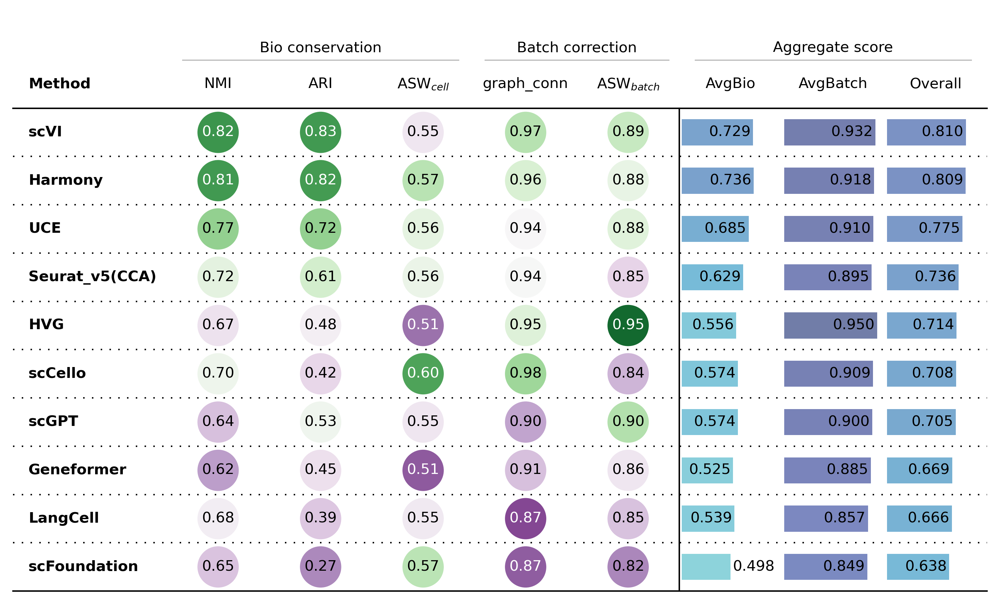

In [19]:
plot_results_table(df.T)

In [20]:
data = df.iloc[:, :-1].T
data["model"] = data.index
data["model_class"] = data["model"].apply(lambda x: "scFM" if x in model_order_scFM else "Baseline")
data

,NMI,ARI,ASW$_{cell}$,graph_conn,ASW$_{batch}$,AvgBio,AvgBatch,Overall,model,model_class
HVG,0.6736,0.4835,0.5119,0.9530,0.9472,0.5563,0.9501,0.7139,HVG,Baseline
scVI,0.8160,0.8268,0.5455,0.9684,0.8948,0.7294,0.9316,0.8103,scVI,Baseline
Harmony,0.8129,0.8209,0.5739,0.9555,0.8799,0.7359,0.9177,0.8086,Harmony,Baseline
Seurat_v5(CCA),0.7166,0.6144,0.5574,0.9367,0.8527,0.6295,0.8947,0.7356,Seurat_v5(CCA),Baseline
Geneformer,0.6200,0.4481,0.5073,0.9088,0.8617,0.5251,0.8853,0.6692,Geneformer,scFM
scGPT,0.6446,0.5333,0.5452,0.8982,0.9018,0.5744,0.9000,0.7046,scGPT,scFM
UCE,0.7732,0.7212,0.5603,0.9365,0.8845,0.6849,0.9105,0.7751,UCE,scFM
scFoundation,0.6466,0.2730,0.5733,0.8740,0.8250,0.4976,0.8495,0.6384,scFoundation,scFM
LangCell,0.6836,0.3875,0.5463,0.8682,0.8458,0.5391,0.8570,0.6663,LangCell,scFM
scCello,0.7048,0.4227,0.5950,0.9768,0.8411,0.5742,0.9089,0.7081,scCello,scFM


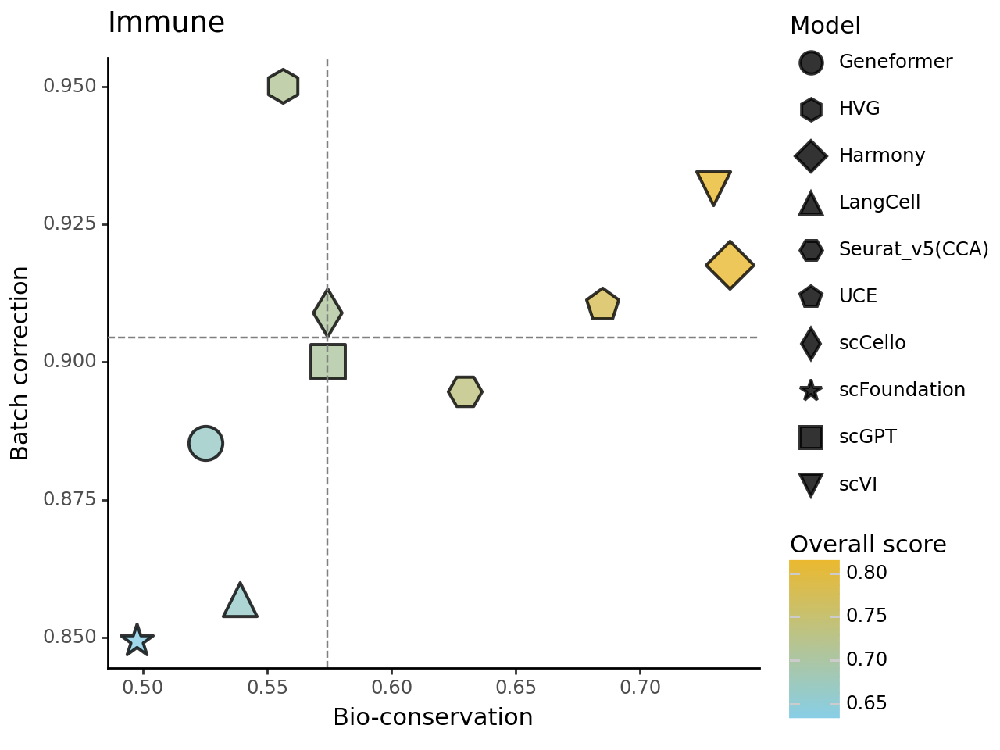

<Figure Size: (640 x 480)>

In [ ]:
(
ggplot(data, aes(x='AvgBio', y='AvgBatch', shape='model')) 
+ geom_point(
    aes(fill='Overall', color="model_class"), 
    size=8, alpha=0.8, stroke=0.8
)
+ scale_shape_manual(custom_shape) 
+ scale_fill_gradient(low="#88CEE6", high="#EAB930", name='Overall score') 
+ scale_color_manual(values={'Baseline':'black', 'scFM':'black'}, name='Model class') 
+ guides(
    size=False,
    shape=guide_legend(title='Model', override_aes={'size':5}),
    fill=guide_colorbar(title='Overall score', barheight=10),
    color=False,
)
+ geom_vline(xintercept=data['AvgBio'].median(), linetype='dashed', color='grey') 
+ geom_hline(yintercept=data['AvgBatch'].median(), linetype='dashed', color='grey') 
+ xlab('Bio-conservation') 
+ ylab('Batch correction') 
+ ggtitle(dataset_map_dict[dataset_name]) 
+ theme_classic()
)

## HLCA

In [ ]:
pd.set_option('display.precision', 4) 
dataset_name = "HLCA_core"
layer_key = dataset_info_dict[dataset_name]["layer_key"]
df = pd.DataFrame()
for model in cluster_models:
    result_path = os.path.join(output_folder, dataset_name, layer_key, model, "clustering_metrics.csv")
    df_ = pd.read_csv(result_path, index_col=0)
    df = pd.concat([df, df_], axis=1)
df.rename(columns=model_map_dict, inplace=True)
df

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello
NMI_cluster/label,0.7605,0.8090,0.7554,0.6886,0.6662,0.7736,0.7337,0.6749,0.6638,0.7550
ARI_cluster/label,0.5715,0.6528,0.5844,0.5056,0.4476,0.6651,0.4667,0.3038,0.3275,0.5512
ASW_label,0.5220,0.5395,0.5476,0.5238,0.4981,0.5098,0.5646,0.5543,0.5258,0.5836
graph_conn,0.9794,0.9930,0.9651,0.9268,0.9358,0.9634,0.9810,0.9773,0.9291,0.9743
ASW_label/batch,0.9369,0.9051,0.8510,0.8105,0.8840,0.9180,0.8847,0.8525,0.8730,0.8795
avg_bio,0.6180,0.6671,0.6291,0.5727,0.5373,0.6495,0.5883,0.5110,0.5057,0.6300
avg_batch,0.9582,0.9490,0.9080,0.8687,0.9099,0.9407,0.9329,0.9149,0.9011,0.9269
overall,0.7541,0.7799,0.7407,0.6911,0.6863,0.7660,0.7262,0.6726,0.6638,0.7487


In [22]:
keys = df.columns
values = df.iloc[-3:-1,:].values.transpose(1,0)
population = {k:v for k,v in zip(keys, values)}
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

Front 1: ['HVG', 'scVI']
Front 2: ['scGPT']
Front 3: ['UCE', 'scCello']
Front 4: ['Harmony', 'Geneformer', 'scFoundation']
Front 5: ['Seurat_v5(CCA)', 'LangCell']


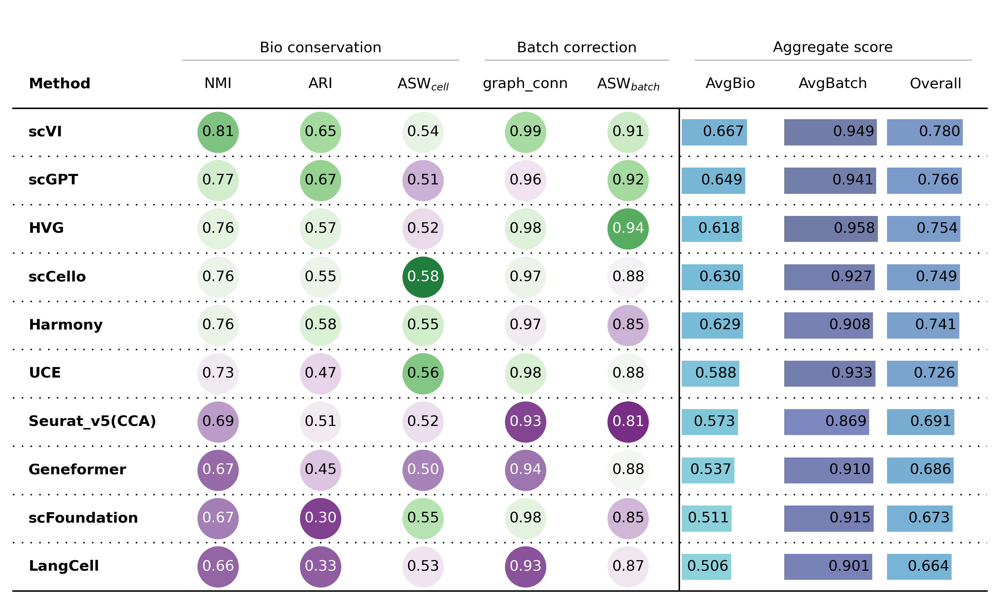

In [23]:
df.rename(index=scib_metrics_dict, inplace=True)
df[_METRIC_TYPE] = ["Bio conservation", "Bio conservation", "Bio conservation", 
                    "Batch correction", "Batch correction",
                    _AGGREGATE_SCORE, _AGGREGATE_SCORE, _AGGREGATE_SCORE]
plot_results_table(df.T)

In [63]:
data = df.iloc[:, :-1].T
data["model"] = data.index
data["model_class"] = data["model"].apply(lambda x: "scFM" if x in model_order_scFM else "Baseline")
data

,NMI,ARI,ASW$_{cell}$,graph_conn,ASW$_{batch}$,AvgBio,AvgBatch,Overall,model,model_class
HVG,0.7605,0.5715,0.5220,0.9794,0.9369,0.6180,0.9582,0.7541,HVG,Baseline
scVI,0.8090,0.6528,0.5395,0.9930,0.9051,0.6671,0.9490,0.7799,scVI,Baseline
Harmony,0.7554,0.5844,0.5476,0.9651,0.8510,0.6291,0.9080,0.7407,Harmony,Baseline
Seurat_v5(CCA),0.6886,0.5056,0.5238,0.9268,0.8105,0.5727,0.8687,0.6911,Seurat_v5(CCA),Baseline
Geneformer,0.6662,0.4476,0.4981,0.9358,0.8840,0.5373,0.9099,0.6863,Geneformer,scFM
scGPT,0.7736,0.6651,0.5098,0.9634,0.9180,0.6495,0.9407,0.7660,scGPT,scFM
UCE,0.7337,0.4667,0.5646,0.9810,0.8847,0.5883,0.9329,0.7262,UCE,scFM
scFoundation,0.6749,0.3038,0.5543,0.9773,0.8525,0.5110,0.9149,0.6726,scFoundation,scFM
LangCell,0.6638,0.3275,0.5258,0.9291,0.8730,0.5057,0.9011,0.6638,LangCell,scFM
scCello,0.7550,0.5512,0.5836,0.9743,0.8795,0.6300,0.9269,0.7487,scCello,scFM


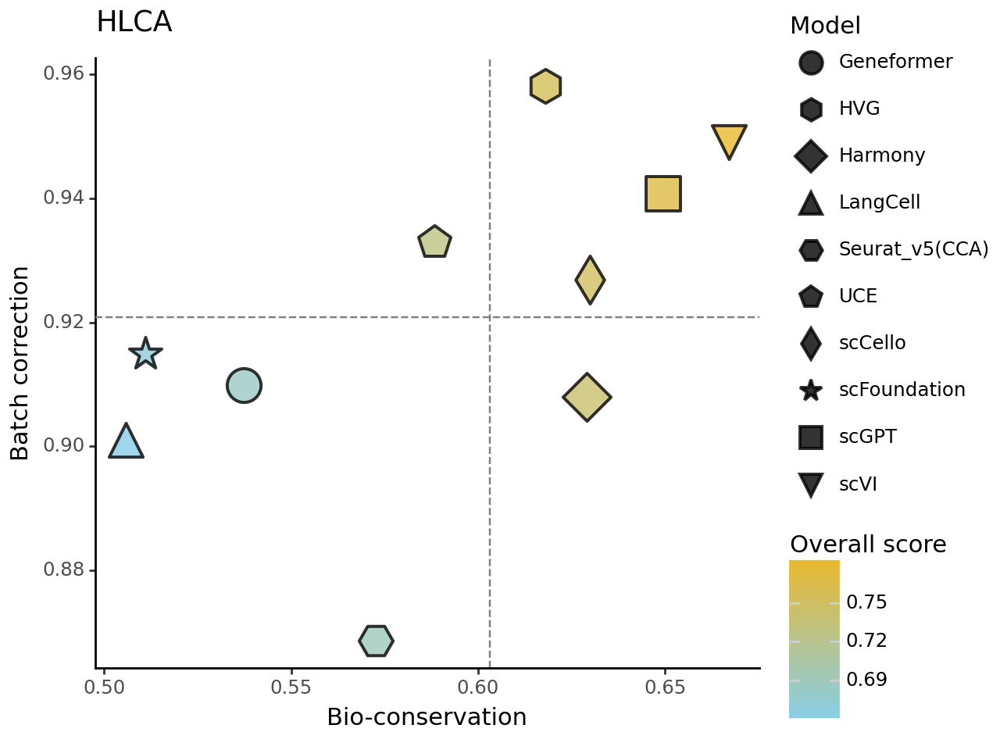

<Figure Size: (640 x 480)>

In [ ]:
(
ggplot(data, aes(x='AvgBio', y='AvgBatch', shape='model')) 
+ geom_point(
    aes(fill='Overall', color="model_class"), 
    size=8, alpha=0.8, stroke=0.8
)
+ scale_shape_manual(custom_shape) 
+ scale_fill_gradient(low="#88CEE6", high="#EAB930", name='Overall score') 
+ scale_color_manual(values={'Baseline':'black', 'scFM':'black'}, name='Model class') 
+ guides(
    size=False,
    shape=guide_legend(title='Model', override_aes={'size':5}),
    fill=guide_colorbar(title='Overall score', barheight=10),
    color=False,
)
+ geom_vline(xintercept=data['AvgBio'].median(), linetype='dashed', color='grey') 
+ geom_hline(yintercept=data['AvgBatch'].median(), linetype='dashed', color='grey') 
+ xlab('Bio-conservation') 
+ ylab('Batch correction') 
+ ggtitle(dataset_map_dict[dataset_name]) 
+ theme_classic()
)

### scGraph metrics

In [66]:
scgraph = f"{output_folder}/scGraph/{dataset_name}.csv"
scgraph_df = pd.DataFrame()
x, y = [], []
model_list_new = []
for model in cluster_models:
    # if model == "scVI":
    #     x.append(pd.read_csv(scgraph_hvg_wo_batchkey, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    #     y.append(pd.read_csv(scgraph_hvg_wo_batchkey, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    # else:
    #     x.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    #     y.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    x.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    y.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    model_list_new.append(model_map_dict[f"X_{model.lower()}"])
scgraph_df["model"] = model_list_new
scgraph_df["scGraph-Pearson-PCA"] = x
scgraph_df["scGraph-Pearson-OntoRWR"] = y
scgraph_df["Overall_score"] = (scgraph_df["scGraph-Pearson-PCA"] + scgraph_df["scGraph-Pearson-OntoRWR"]) / 2
scgraph_df["model_class"] = scgraph_df["model"].apply(lambda x: "scFM" if x in model_order_scFM else "Baseline")
scgraph_df

,model,scGraph-Pearson-PCA,scGraph-Pearson-OntoRWR,Overall_score,model_class
0,HVG,0.8957,0.7656,0.8306,Baseline
1,scVI,0.6497,0.7467,0.6982,Baseline
2,Harmony,0.3200,0.4481,0.3840,Baseline
3,Seurat_v5(CCA),0.7719,0.5232,0.6476,Baseline
4,Geneformer,0.6601,0.6967,0.6784,scFM
5,scGPT,0.7022,0.7311,0.7167,scFM
6,UCE,0.6945,0.7994,0.7470,scFM
7,scFoundation,0.6919,0.7886,0.7403,scFM
8,LangCell,0.6425,0.7719,0.7072,scFM
9,scCello,0.7378,0.7560,0.7469,scFM


In [67]:
keys = scgraph_df["model"]
values = scgraph_df.loc[:, ["scGraph-Pearson-PCA", "scGraph-Pearson-OntoRWR"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'HVG': array([0.89565284, 0.76564415]), 'scVI': array([0.6497249 , 0.74668821]), 'Harmony': array([0.3199608 , 0.44806277]), 'Seurat_v5(CCA)': array([0.77191393, 0.52319454]), 'Geneformer': array([0.66010006, 0.6966999 ]), 'scGPT': array([0.70218902, 0.73111642]), 'UCE': array([0.69452227, 0.79938658]), 'scFoundation': array([0.69190658, 0.78859846]), 'LangCell': array([0.64254141, 0.77185943]), 'scCello': array([0.73784828, 0.75595837])}
Front 1: ['HVG', 'UCE']
Front 2: ['Seurat_v5(CCA)', 'scCello', 'scFoundation']
Front 3: ['scGPT', 'scVI', 'LangCell']
Front 4: ['Geneformer']
Front 5: ['Harmony']


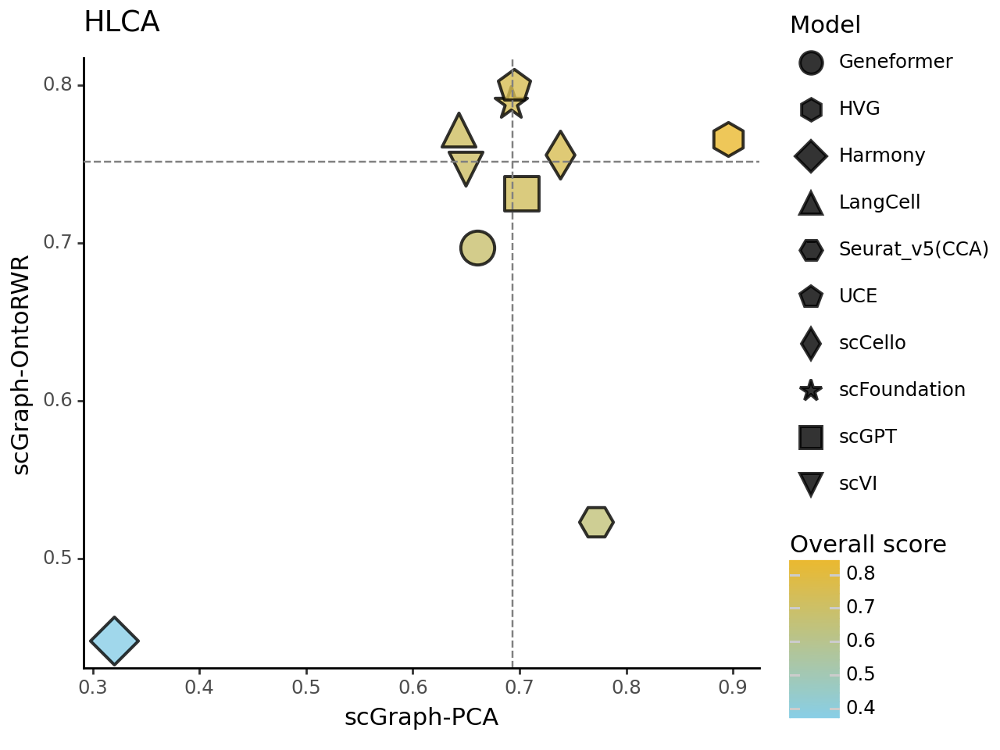

<Figure Size: (640 x 480)>

In [ ]:
(
ggplot(scgraph_df, aes(x="scGraph-Pearson-PCA", y="scGraph-Pearson-OntoRWR", shape='model')) 
+ geom_point(
    aes(fill='Overall_score', color="model_class"), 
    size=8, alpha=0.8, stroke=0.8
)
+ scale_shape_manual(custom_shape) 
+ scale_fill_gradient(low="#88CEE6", high="#EAB930", name='Overall score') 
+ scale_color_manual(values={'Baseline':'black', 'scFM':'black'}, name='Model class') 
+ guides(
    size=False,
    shape=guide_legend(title='Model', override_aes={'size':5}),
    fill=guide_colorbar(title='Overall score', barheight=10),
    color=False,
)
+ geom_vline(xintercept=scgraph_df["scGraph-Pearson-PCA"].median(), linetype='dashed', color='grey') 
+ geom_hline(yintercept=scgraph_df["scGraph-Pearson-OntoRWR"].median(), linetype='dashed', color='grey') 
+ xlab("scGraph-PCA") 
+ ylab("scGraph-OntoRWR") 
+ ggtitle(dataset_map_dict[dataset_name]) 
+ theme_classic()
)

##### detailed analysis

In [ ]:
use_cols = [f"X_{model.lower()}" for model in cluster_models]
rwr_detailed = pd.read_csv(f"{output_folder}/scGraph/{dataset_name}_rwr_detailed.csv", index_col=0).loc[:, use_cols]
rwr_detailed = rwr_detailed.rename(columns=model_map_dict)
rwr_detailed = pd.melt(rwr_detailed, var_name='Model', value_name='Pearsonr')
rwr_detailed

,Model,Pearsonr
0,HVG,0.6121
1,HVG,0.8243
2,HVG,0.8289
3,HVG,0.7720
4,HVG,0.7199
...,...,...
495,scCello,0.7884
496,scCello,0.7538
497,scCello,0.7488
498,scCello,0.7599


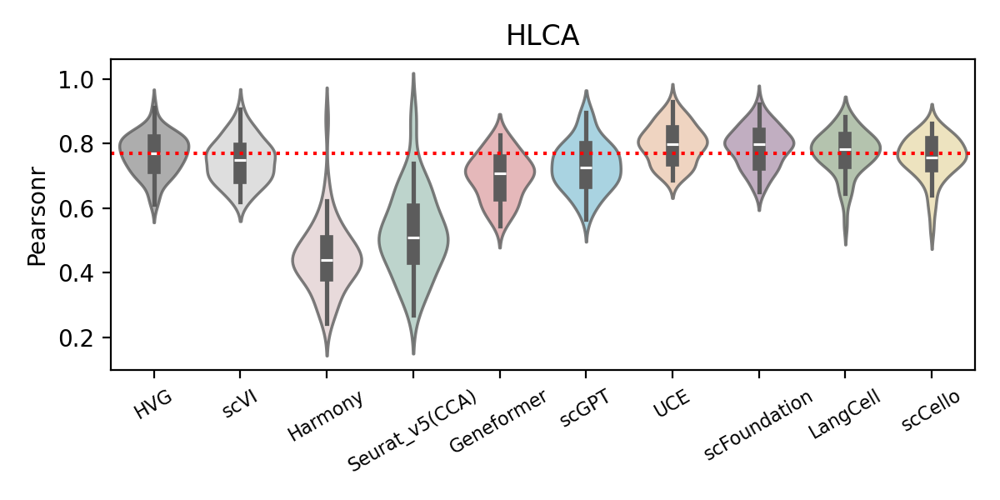

In [ ]:
plt.figure(figsize=(6, 3))
sns.violinplot(rwr_detailed, x="Model", y="Pearsonr", hue="Model", 
               palette=custom_palette, alpha=0.8,
               order=model_order)
plt.xticks(fontsize=8, rotation=30)
plt.xlabel("")
plt.ylabel("Pearsonr", fontsize=10)
plt.axhline(y=rwr_detailed[rwr_detailed["Model"]=="HVG"]["Pearsonr"].median(), color="red", linestyle=':')
plt.title(dataset_map_dict[dataset_name])
plt.tight_layout()
plt.savefig("../figures/clustering/hlca_pearsonr_violinplot.png", dpi=300, bbox_inches='tight')

## Tabula_Sapiens_all

In [ ]:
pd.set_option('display.precision', 4) 
dataset_name = "Tabula_Sapiens_all"
layer_key = dataset_info_dict[dataset_name]["layer_key"]
df = pd.DataFrame()
for model in cluster_models:
    result_path = os.path.join(output_folder, dataset_name, layer_key, model, "clustering_metrics.csv")
    df_ = pd.read_csv(result_path, index_col=0)
    df = pd.concat([df, df_], axis=1)
df.rename(columns=model_map_dict, inplace=True)
df

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello
NMI_cluster/label,0.7433,0.7453,0.6400,0.5007,0.6811,0.6949,0.7367,0.7324,0.7325,0.7509
ARI_cluster/label,0.3935,0.4750,0.3439,0.1871,0.3772,0.3351,0.4011,0.4139,0.4196,0.5067
ASW_label,0.5006,0.4888,0.4561,0.3925,0.4106,0.4905,0.5298,0.5170,0.5038,0.5229
graph_conn,0.8809,0.8390,0.7939,0.5355,0.7392,0.8286,0.8635,0.8533,0.8370,0.8496
ASW_label/batch,0.8910,0.7844,0.8101,0.8134,0.7831,0.8744,0.7430,0.7977,0.8439,0.8043
avg_bio,0.5458,0.5697,0.4800,0.3601,0.4896,0.5068,0.5559,0.5545,0.5520,0.5935
avg_batch,0.8860,0.8117,0.8020,0.6745,0.7611,0.8515,0.8032,0.8255,0.8404,0.8269
overall,0.6819,0.6665,0.6088,0.4859,0.5982,0.6447,0.6548,0.6629,0.6673,0.6869


In [25]:
keys = df.columns
values = df.iloc[-3:-1,:].values.transpose(1,0)
population = {k:v for k,v in zip(keys, values)}
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

Front 1: ['HVG', 'LangCell', 'scCello']
Front 2: ['scGPT', 'scVI', 'scFoundation']
Front 3: ['UCE']
Front 4: ['Harmony', 'Geneformer']
Front 5: ['Seurat_v5(CCA)']


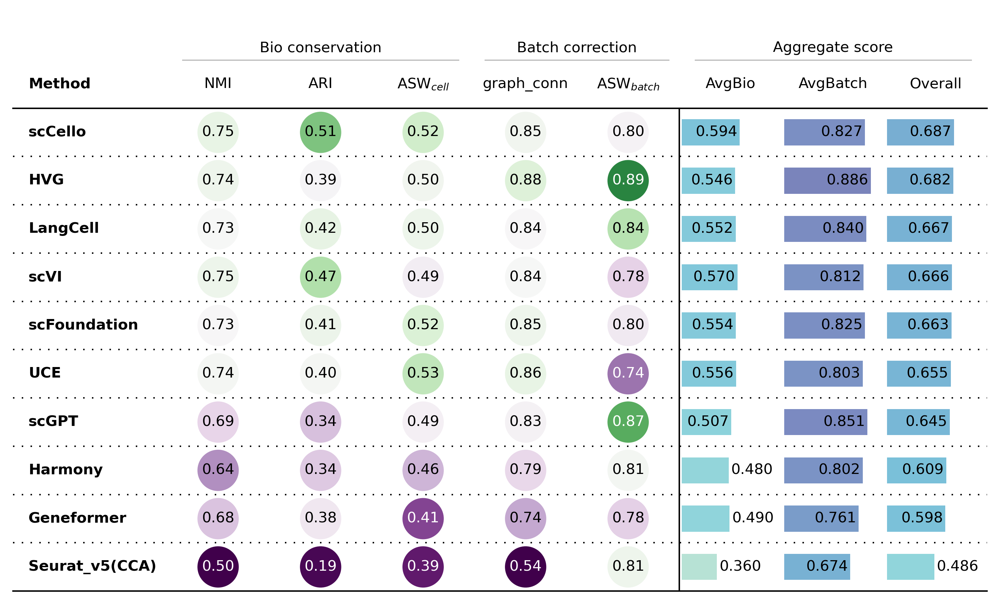

In [26]:
df.rename(index=scib_metrics_dict, inplace=True)
df[_METRIC_TYPE] = ["Bio conservation", "Bio conservation", "Bio conservation", 
                    "Batch correction", "Batch correction",
                    _AGGREGATE_SCORE, _AGGREGATE_SCORE, _AGGREGATE_SCORE]
plot_results_table(df.T)

In [87]:
data = df.iloc[:, :-1].T
data["model"] = data.index
data["model_class"] = data["model"].apply(lambda x: "scFM" if x in model_order_scFM else "Baseline")
data

,NMI,ARI,ASW$_{cell}$,graph_conn,ASW$_{batch}$,AvgBio,AvgBatch,Overall,model,model_class
HVG,0.7433,0.3935,0.5006,0.8809,0.8910,0.5458,0.8860,0.6819,HVG,Baseline
scVI,0.7453,0.4750,0.4888,0.8390,0.7844,0.5697,0.8117,0.6665,scVI,Baseline
Harmony,0.6400,0.3439,0.4561,0.7939,0.8101,0.4800,0.8020,0.6088,Harmony,Baseline
Seurat_v5(CCA),0.5007,0.1871,0.3925,0.5355,0.8134,0.3601,0.6745,0.4859,Seurat_v5(CCA),Baseline
Geneformer,0.6811,0.3772,0.4106,0.7392,0.7831,0.4896,0.7611,0.5982,Geneformer,scFM
scGPT,0.6949,0.3351,0.4905,0.8286,0.8744,0.5068,0.8515,0.6447,scGPT,scFM
UCE,0.7367,0.4011,0.5298,0.8635,0.7430,0.5559,0.8032,0.6548,UCE,scFM
scFoundation,0.7324,0.4139,0.5170,0.8533,0.7977,0.5545,0.8255,0.6629,scFoundation,scFM
LangCell,0.7325,0.4196,0.5038,0.8370,0.8439,0.5520,0.8404,0.6673,LangCell,scFM
scCello,0.7509,0.5067,0.5229,0.8496,0.8043,0.5935,0.8269,0.6869,scCello,scFM


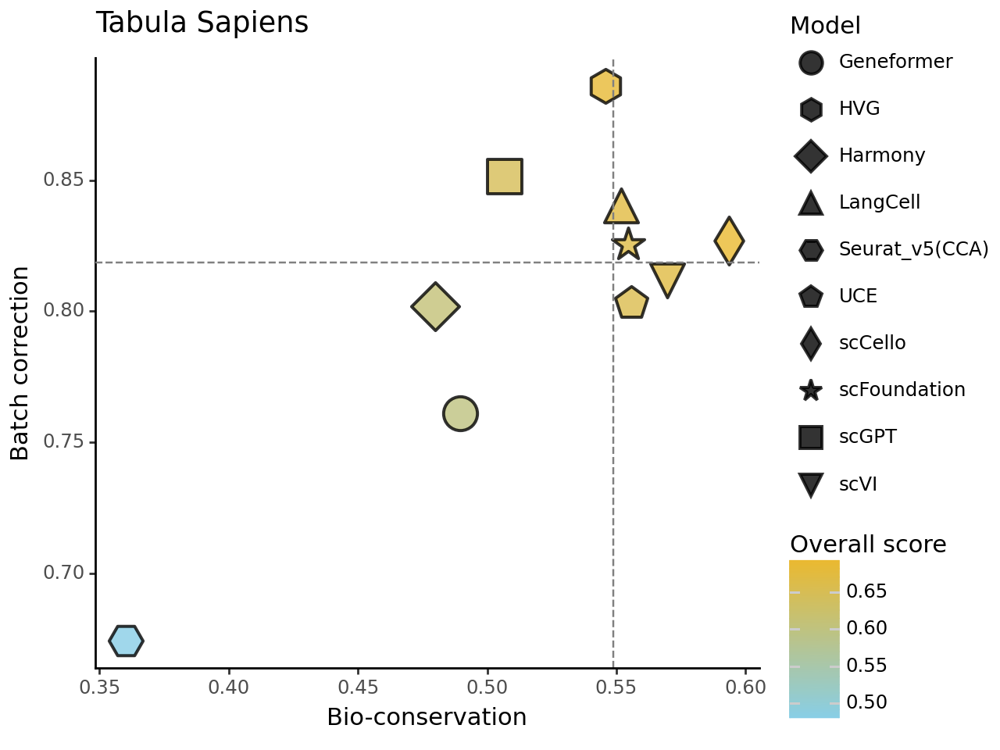

<Figure Size: (640 x 480)>

In [ ]:
(
ggplot(data, aes(x='AvgBio', y='AvgBatch', shape='model')) 
+ geom_point(
    aes(fill='Overall', color="model_class"), 
    size=8, alpha=0.8, stroke=0.8
)
+ scale_shape_manual(custom_shape) 
+ scale_fill_gradient(low="#88CEE6", high="#EAB930", name='Overall score') 
+ scale_color_manual(values={'Baseline':'black', 'scFM':'black'}, name='Model class') 
+ guides(
    size=False,
    shape=guide_legend(title='Model', override_aes={'size':5}),
    fill=guide_colorbar(title='Overall score', barheight=10),
    color=False,
)
+ geom_vline(xintercept=data['AvgBio'].median(), linetype='dashed', color='grey') 
+ geom_hline(yintercept=data['AvgBatch'].median(), linetype='dashed', color='grey') 
+ xlab('Bio-conservation') 
+ ylab('Batch correction') 
+ ggtitle(dataset_map_dict[dataset_name]) 
+ theme_classic()
)

### scGraph metrics

In [89]:
scgraph = f"{output_folder}/scGraph/{dataset_name}.csv"
scgraph_df = pd.DataFrame()
x, y = [], []
model_list_new = []
for model in cluster_models:
    # if model == "scVI":
    #     x.append(pd.read_csv(scgraph_hvg_wo_batchkey, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    #     y.append(pd.read_csv(scgraph_hvg_wo_batchkey, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    # else:
    #     x.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    #     y.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    x.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    y.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    model_list_new.append(model_map_dict[f"X_{model.lower()}"])
scgraph_df["model"] = model_list_new
scgraph_df["scGraph-Pearson-PCA"] = x
scgraph_df["scGraph-Pearson-OntoRWR"] = y
scgraph_df["Overall_score"] = (scgraph_df["scGraph-Pearson-PCA"] + scgraph_df["scGraph-Pearson-OntoRWR"]) / 2
scgraph_df["model_class"] = scgraph_df["model"].apply(lambda x: "scFM" if x in model_order_scFM else "Baseline")
scgraph_df

,model,scGraph-Pearson-PCA,scGraph-Pearson-OntoRWR,Overall_score,model_class
0,HVG,0.7257,0.5213,0.6235,Baseline
1,scVI,0.6353,0.4932,0.5643,Baseline
2,Harmony,0.5727,0.3762,0.4744,Baseline
3,Seurat_v5(CCA),0.4064,0.2098,0.3081,Baseline
4,Geneformer,0.4987,0.2570,0.3778,scFM
5,scGPT,0.6439,0.4958,0.5699,scFM
6,UCE,0.6334,0.5915,0.6124,scFM
7,scFoundation,0.6115,0.5761,0.5938,scFM
8,LangCell,0.6278,0.5433,0.5856,scFM
9,scCello,0.6152,0.5276,0.5714,scFM


In [90]:
keys = scgraph_df["model"]
values = scgraph_df.loc[:, ["scGraph-Pearson-PCA", "scGraph-Pearson-OntoRWR"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'HVG': array([0.72568964, 0.5213361 ]), 'scVI': array([0.63531523, 0.49318794]), 'Harmony': array([0.57265403, 0.37621884]), 'Seurat_v5(CCA)': array([0.40636744, 0.2097757 ]), 'Geneformer': array([0.49867324, 0.25695737]), 'scGPT': array([0.64393155, 0.49582515]), 'UCE': array([0.63337416, 0.59149406]), 'scFoundation': array([0.61150213, 0.57611242]), 'LangCell': array([0.62784482, 0.54330202]), 'scCello': array([0.61519085, 0.52762563])}
Front 1: ['HVG', 'UCE']
Front 2: ['scGPT', 'scFoundation', 'LangCell']
Front 3: ['scVI', 'scCello']
Front 4: ['Harmony']
Front 5: ['Geneformer']
Front 6: ['Seurat_v5(CCA)']


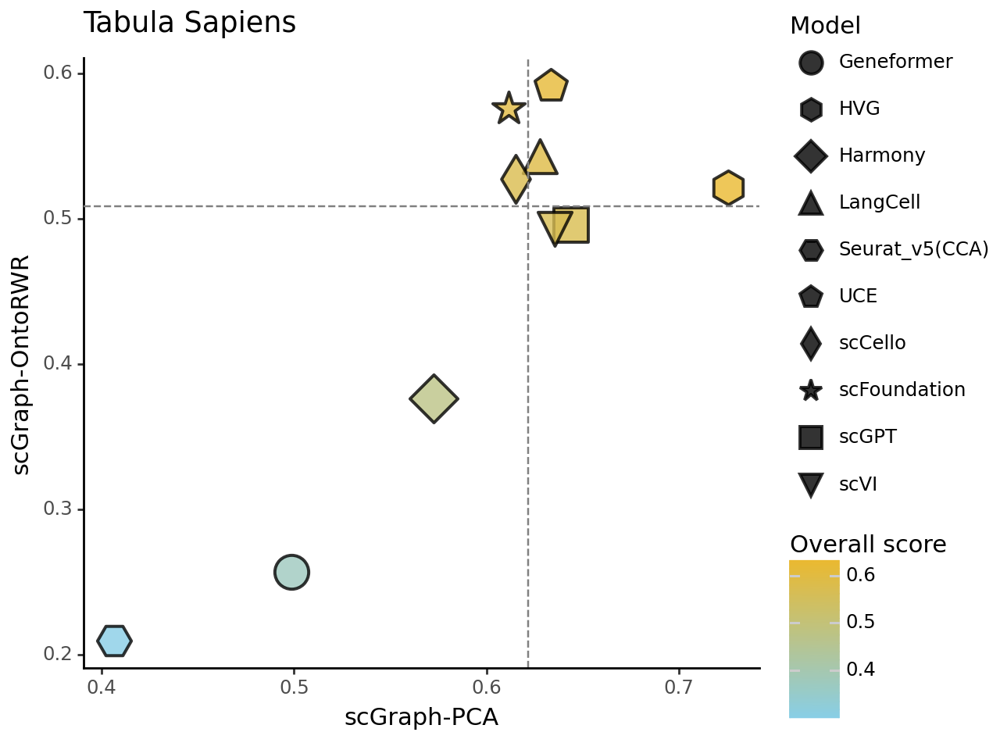

<Figure Size: (640 x 480)>

In [ ]:
(
ggplot(scgraph_df, aes(x="scGraph-Pearson-PCA", y="scGraph-Pearson-OntoRWR", shape='model')) 
+ geom_point(
    aes(fill='Overall_score', color="model_class"), 
    size=8, alpha=0.8, stroke=0.8
)
+ scale_shape_manual(custom_shape) 
+ scale_fill_gradient(low="#88CEE6", high="#EAB930", name='Overall score') 
+ scale_color_manual(values={'Baseline':'black', 'scFM':'black'}, name='Model class') 
+ guides(
    size=False,
    shape=guide_legend(title='Model', override_aes={'size':5}),
    fill=guide_colorbar(title='Overall score', barheight=10),
    color=False,
)
+ geom_vline(xintercept=scgraph_df["scGraph-Pearson-PCA"].median(), linetype='dashed', color='grey') 
+ geom_hline(yintercept=scgraph_df["scGraph-Pearson-OntoRWR"].median(), linetype='dashed', color='grey') 
+ xlab("scGraph-PCA") 
+ ylab("scGraph-OntoRWR") 
+ ggtitle(dataset_map_dict[dataset_name]) 
+ theme_classic()
)

#### detailed analysis

In [92]:
use_cols = [f"X_{model.lower()}" for model in cluster_models]
rwr_detailed = pd.read_csv(f"{output_folder}/scGraph/{dataset_name}_rwr_detailed.csv", index_col=0).loc[:, use_cols]
rwr_detailed = rwr_detailed.rename(columns=model_map_dict)
rwr_detailed = pd.melt(rwr_detailed, var_name='Model', value_name='Pearsonr')
rwr_detailed

,Model,Pearsonr
0,HVG,0.3252
1,HVG,0.4066
2,HVG,0.3351
3,HVG,0.3452
4,HVG,0.3431
...,...,...
1545,scCello,0.5534
1546,scCello,0.4972
1547,scCello,0.5768
1548,scCello,0.6996


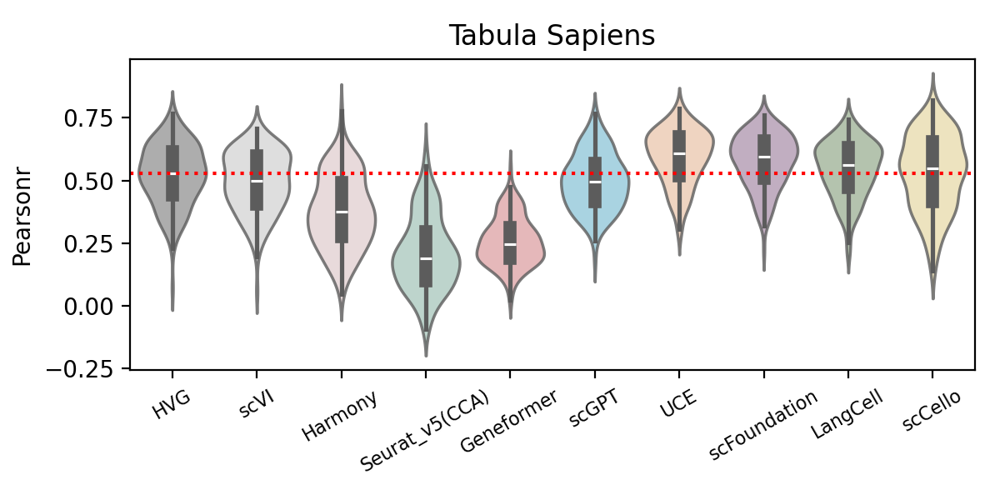

In [ ]:
plt.figure(figsize=(6, 3))
sns.violinplot(rwr_detailed, x="Model", y="Pearsonr", hue="Model", 
               palette=custom_palette, alpha=0.8,
               order=model_order)
plt.xticks(fontsize=8, rotation=30)
plt.xlabel("")
plt.ylabel("Pearsonr", fontsize=10)
plt.axhline(y=rwr_detailed[rwr_detailed["Model"]=="HVG"]["Pearsonr"].median(), color="red", linestyle=':')
plt.title(dataset_map_dict[dataset_name])
plt.tight_layout()
plt.savefig("../figures/clustering/tabula_pearsonr_violinplot.png", dpi=300, bbox_inches='tight')

## AIDA v2

In [ ]:
pd.set_option('display.precision', 4) 
dataset_name = "AIDA_v2_new"
layer_key = dataset_info_dict[dataset_name]["layer_key"]
df = pd.DataFrame()
for model in cluster_models:
    result_path = os.path.join(output_folder, dataset_name, layer_key, model, "clustering_metrics.csv")
    df_ = pd.read_csv(result_path, index_col=0)
    df = pd.concat([df, df_], axis=1)
df.rename(columns=model_map_dict, inplace=True)
df

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello
NMI_cluster/label,0.6677,0.7134,0.6769,0.6615,0.5864,0.6177,0.7097,0.6800,0.6637,0.7262
ARI_cluster/label,0.4957,0.5180,0.5163,0.4761,0.2928,0.3252,0.5157,0.4645,0.4052,0.5520
ASW_label,0.4932,0.5117,0.5150,0.5377,0.5033,0.5132,0.5357,0.5380,0.5219,0.6002
graph_conn,0.8878,0.9741,0.9455,0.9358,0.8899,0.9090,0.9648,0.9785,0.9534,0.9621
ASW_label/batch,0.9548,0.8867,0.8036,0.6458,0.8756,0.8765,0.8575,0.8838,0.9350,0.7738
avg_bio,0.5522,0.5810,0.5694,0.5584,0.4608,0.4854,0.5871,0.5608,0.5303,0.6261
avg_batch,0.9213,0.9304,0.8746,0.7908,0.8828,0.8927,0.9111,0.9311,0.9442,0.8679
overall,0.6998,0.7208,0.6915,0.6514,0.6296,0.6483,0.7167,0.7090,0.6959,0.7229


In [28]:
keys = df.columns
values = df.iloc[-3:-1,:].values.transpose(1,0)
population = {k:v for k,v in zip(keys, values)}
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

Front 1: ['scVI', 'UCE', 'LangCell', 'scCello']
Front 2: ['scFoundation', 'Harmony']
Front 3: ['HVG', 'Seurat_v5(CCA)']
Front 4: ['scGPT']
Front 5: ['Geneformer']


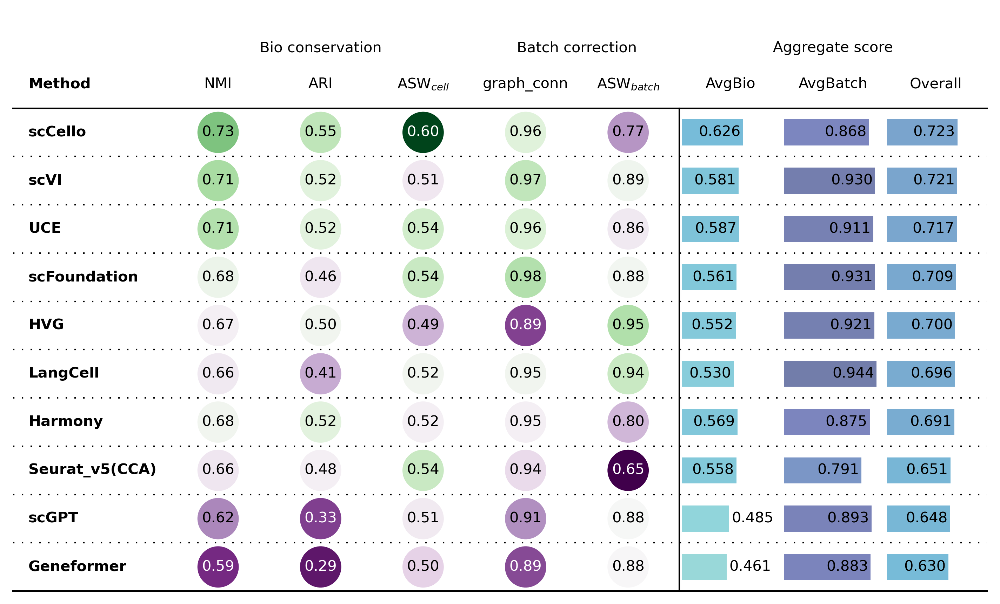

In [29]:
df.rename(index=scib_metrics_dict, inplace=True)
df[_METRIC_TYPE] = ["Bio conservation", "Bio conservation", "Bio conservation", 
                    "Batch correction", "Batch correction",
                    _AGGREGATE_SCORE, _AGGREGATE_SCORE, _AGGREGATE_SCORE]
plot_results_table(df.T)

In [98]:
data = df.iloc[:, :-1].T
data["model"] = data.index
data["model_class"] = data["model"].apply(lambda x: "scFM" if x in model_order_scFM else "Baseline")
data

,NMI,ARI,ASW$_{cell}$,graph_conn,ASW$_{batch}$,AvgBio,AvgBatch,Overall,model,model_class
HVG,0.6677,0.4957,0.4932,0.8878,0.9548,0.5522,0.9213,0.6998,HVG,Baseline
scVI,0.7134,0.5180,0.5117,0.9741,0.8867,0.5810,0.9304,0.7208,scVI,Baseline
Harmony,0.6769,0.5163,0.5150,0.9455,0.8036,0.5694,0.8746,0.6915,Harmony,Baseline
Seurat_v5(CCA),0.6615,0.4761,0.5377,0.9358,0.6458,0.5584,0.7908,0.6514,Seurat_v5(CCA),Baseline
Geneformer,0.5864,0.2928,0.5033,0.8899,0.8756,0.4608,0.8828,0.6296,Geneformer,scFM
scGPT,0.6177,0.3252,0.5132,0.9090,0.8765,0.4854,0.8927,0.6483,scGPT,scFM
UCE,0.7097,0.5157,0.5357,0.9648,0.8575,0.5871,0.9111,0.7167,UCE,scFM
scFoundation,0.6800,0.4645,0.5380,0.9785,0.8838,0.5608,0.9311,0.7090,scFoundation,scFM
LangCell,0.6637,0.4052,0.5219,0.9534,0.9350,0.5303,0.9442,0.6959,LangCell,scFM
scCello,0.7262,0.5520,0.6002,0.9621,0.7738,0.6261,0.8679,0.7229,scCello,scFM


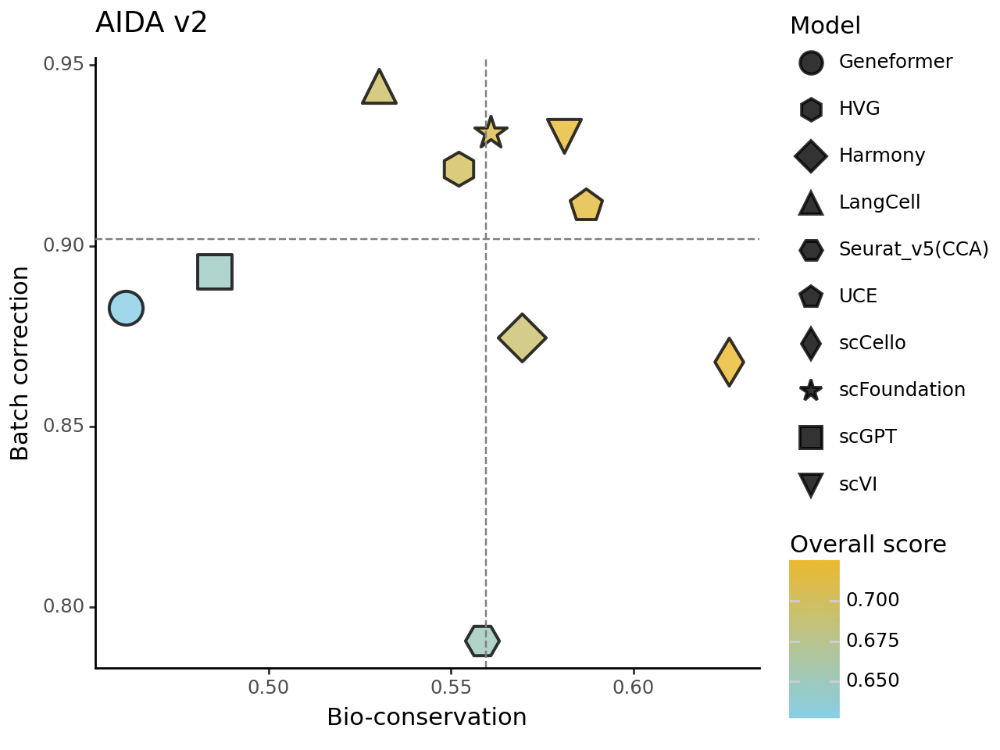

<Figure Size: (640 x 480)>

In [ ]:
(
ggplot(data, aes(x='AvgBio', y='AvgBatch', shape='model')) 
+ geom_point(
    aes(fill='Overall', color="model_class"), 
    size=8, alpha=0.8, stroke=0.8
)
+ scale_shape_manual(custom_shape) 
+ scale_fill_gradient(low="#88CEE6", high="#EAB930", name='Overall score') 
+ scale_color_manual(values={'Baseline':'black', 'scFM':'black'}, name='Model class') 
+ guides(
    size=False,
    shape=guide_legend(title='Model', override_aes={'size':5}),
    fill=guide_colorbar(title='Overall score', barheight=10),
    color=False,
)
+ geom_vline(xintercept=data['AvgBio'].median(), linetype='dashed', color='grey') 
+ geom_hline(yintercept=data['AvgBatch'].median(), linetype='dashed', color='grey') 
+ xlab('Bio-conservation') 
+ ylab('Batch correction') 
+ ggtitle(dataset_map_dict[dataset_name]) 
+ theme_classic()
)

### scGraph metrics

In [100]:
scgraph = f"{output_folder}/scGraph/{dataset_name}.csv"
scgraph_df = pd.DataFrame()
x, y = [], []
model_list_new = []
for model in cluster_models:
    # if model == "scVI":
    #     x.append(pd.read_csv(scgraph_hvg_wo_batchkey, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    #     y.append(pd.read_csv(scgraph_hvg_wo_batchkey, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    # else:
    #     x.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    #     y.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    x.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    y.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    model_list_new.append(model_map_dict[f"X_{model.lower()}"])
scgraph_df["model"] = model_list_new
scgraph_df["scGraph-Pearson-PCA"] = x
scgraph_df["scGraph-Pearson-OntoRWR"] = y
scgraph_df["Overall_score"] = (scgraph_df["scGraph-Pearson-PCA"] + scgraph_df["scGraph-Pearson-OntoRWR"]) / 2
scgraph_df["model_class"] = scgraph_df["model"].apply(lambda x: "scFM" if x in model_order_scFM else "Baseline")
scgraph_df

,model,scGraph-Pearson-PCA,scGraph-Pearson-OntoRWR,Overall_score,model_class
0,HVG,0.9612,0.6733,0.8173,Baseline
1,scVI,0.5816,0.6741,0.6278,Baseline
2,Harmony,0.8448,0.6008,0.7228,Baseline
3,Seurat_v5(CCA),0.9370,0.6151,0.7761,Baseline
4,Geneformer,0.8280,0.6796,0.7538,scFM
5,scGPT,0.8760,0.6790,0.7775,scFM
6,UCE,0.7568,0.7560,0.7564,scFM
7,scFoundation,0.7881,0.7454,0.7667,scFM
8,LangCell,0.7213,0.7923,0.7568,scFM
9,scCello,0.7218,0.7851,0.7534,scFM


In [101]:
keys = scgraph_df["model"]
values = scgraph_df.loc[:, ["scGraph-Pearson-PCA", "scGraph-Pearson-OntoRWR"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'HVG': array([0.96117715, 0.67333722]), 'scVI': array([0.58159702, 0.67406456]), 'Harmony': array([0.84476802, 0.60082442]), 'Seurat_v5(CCA)': array([0.93704356, 0.61508235]), 'Geneformer': array([0.82795978, 0.6795675 ]), 'scGPT': array([0.87596382, 0.67901774]), 'UCE': array([0.75683724, 0.75604487]), 'scFoundation': array([0.78812505, 0.74536186]), 'LangCell': array([0.72132004, 0.79228681]), 'scCello': array([0.72183968, 0.78505   ])}
Front 1: ['HVG', 'scGPT', 'UCE', 'scFoundation', 'LangCell']
Front 2: ['Seurat_v5(CCA)', 'Geneformer', 'scCello']
Front 3: ['Harmony', 'scVI']


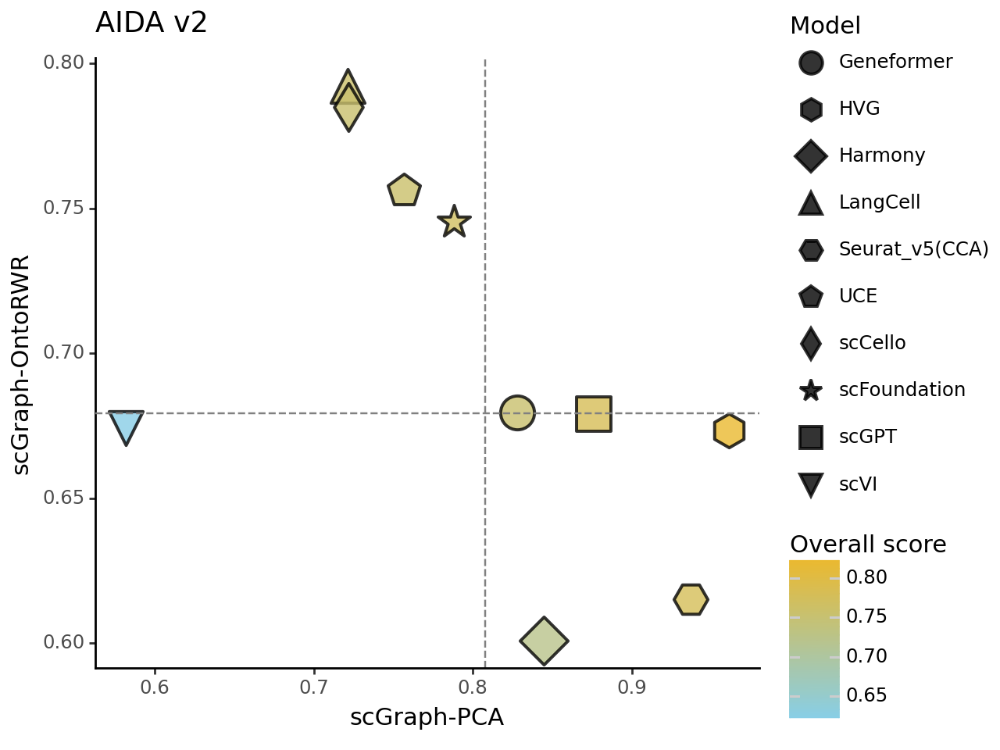

<Figure Size: (640 x 480)>

In [ ]:
(
ggplot(scgraph_df, aes(x="scGraph-Pearson-PCA", y="scGraph-Pearson-OntoRWR", shape='model')) 
+ geom_point(
    aes(fill='Overall_score', color="model_class"), 
    size=8, alpha=0.8, stroke=0.8
)
+ scale_shape_manual(custom_shape) 
+ scale_fill_gradient(low="#88CEE6", high="#EAB930", name='Overall score') 
+ scale_color_manual(values={'Baseline':'black', 'scFM':'black'}, name='Model class') 
+ guides(
    size=False,
    shape=guide_legend(title='Model', override_aes={'size':5}),
    fill=guide_colorbar(title='Overall score', barheight=10),
    color=False,
)
+ geom_vline(xintercept=scgraph_df["scGraph-Pearson-PCA"].median(), linetype='dashed', color='grey') 
+ geom_hline(yintercept=scgraph_df["scGraph-Pearson-OntoRWR"].median(), linetype='dashed', color='grey') 
+ xlab("scGraph-PCA") 
+ ylab("scGraph-OntoRWR") 
+ ggtitle(dataset_map_dict[dataset_name]) 
+ theme_classic()
)

#### detailed analysis

In [103]:
use_cols = [f"X_{model.lower()}" for model in cluster_models]
rwr_detailed = pd.read_csv(f"{output_folder}/scGraph/{dataset_name}_rwr_detailed.csv", index_col=0).loc[:, use_cols]
rwr_detailed = rwr_detailed.rename(columns=model_map_dict)
rwr_detailed = pd.melt(rwr_detailed, var_name='Model', value_name='Pearsonr')
rwr_detailed

,Model,Pearsonr
0,HVG,0.5516
1,HVG,0.7269
2,HVG,0.7647
3,HVG,0.7506
4,HVG,0.6075
...,...,...
315,scCello,0.5815
316,scCello,0.7101
317,scCello,0.7782
318,scCello,0.7369


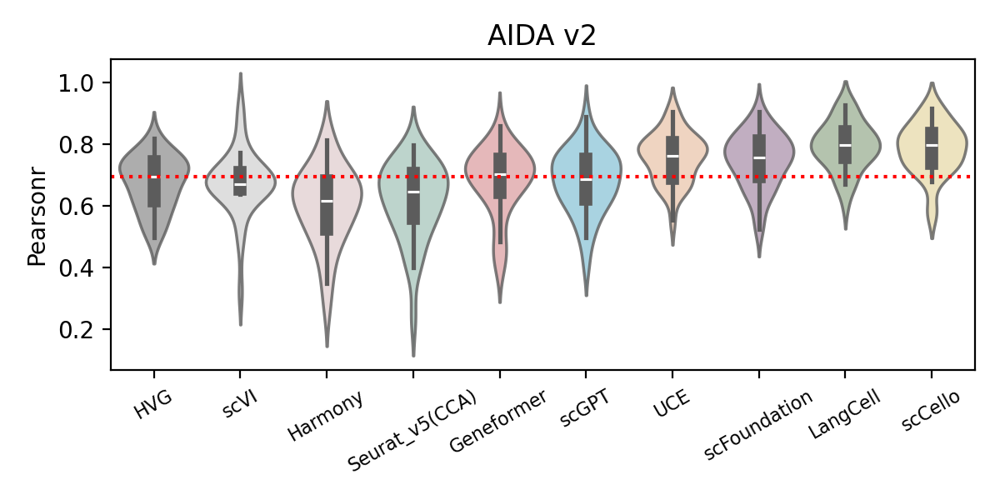

In [ ]:
plt.figure(figsize=(6, 3))
sns.violinplot(rwr_detailed, x="Model", y="Pearsonr", hue="Model", 
               palette=custom_palette, alpha=0.8,
               order=model_order)
plt.xticks(fontsize=8, rotation=30)
plt.xlabel("")
plt.ylabel("Pearsonr", fontsize=10)
plt.axhline(y=rwr_detailed[rwr_detailed["Model"]=="HVG"]["Pearsonr"].median(), color="red", linestyle=':')
plt.title(dataset_map_dict[dataset_name])
plt.tight_layout()
plt.savefig("../figures/clustering/aida_pearsonr_violinplot.png", dpi=300, bbox_inches='tight')

## Embedding distance analysis

#### Case study of the proposed metric

In [34]:
def get_ontology_name(obo_file, lower=True):
	fin = open(obo_file)
	co2name = {}
	name2co = {}
	tag_is_syn = {}
	for line in fin:
		if line.startswith('id: '):
			co = line.strip().split('id: ')[1]
		if line.startswith('name: '):
			if lower:
				name = line.strip().lower().split('name: ')[1]
			else:
				name = line.strip().split('name: ')[1]
			co2name[co] = name
			name2co[name] = co
		if line.startswith('synonym: '):
			if lower:
				syn = line.strip().lower().split('synonym: "')[1].split('" ')[0]
			else:
				syn = line.strip().split('synonym: "')[1].split('" ')[0]
			if syn in name2co:
				continue
			name2co[syn] = co
	fin.close()
	return co2name, name2co

In [35]:
co2name, name2co = get_ontology_name("../data/OnClass_data_public/Ontology_data/cl.obo")
co2name

{'CL:0000000': 'cell',
 'CL:0000001': 'primary cultured cell',
 'CL:0000002': 'obsolete immortal cell line cell',
 'CL:0000003': 'obsolete native cell',
 'CL:0000004': 'obsolete cell by organism',
 'CL:0000005': 'neural crest derived fibroblast',
 'CL:0000006': 'neuronal receptor cell',
 'CL:0000007': 'early embryonic cell (metazoa)',
 'CL:0000008': 'migratory cranial neural crest cell',
 'CL:0000009': 'obsolete fusiform initial',
 'CL:0000010': 'cultured cell',
 'CL:0000011': 'migratory trunk neural crest cell',
 'CL:0000012': 'obsolete cell by class',
 'CL:0000013': 'obsolete dentine secreting cell',
 'CL:0000014': 'germ line stem cell',
 'CL:0000015': 'male germ cell',
 'CL:0000016': 'male germ line stem cell',
 'CL:0000017': 'spermatocyte',
 'CL:0000018': 'spermatid',
 'CL:0000019': 'sperm',
 'CL:0000020': 'spermatogonium',
 'CL:0000021': 'female germ cell',
 'CL:0000022': 'female germ line stem cell',
 'CL:0000023': 'oocyte',
 'CL:0000024': 'oogonial cell',
 'CL:0000025': 'egg cel

In [36]:
# create ontology graph
onto_sp = pd.read_csv("../data/OnClass_data_public/Ontology_data/cl.ontology.sp.csv", index_col=0)
onto_nlp = pd.read_csv("../data/OnClass_data_public/Ontology_data/cl.ontology.nlp.csv", index_col=0)
onto_rwr = pd.read_csv("../data/OnClass_data_public/Ontology_data/cl.ontology.rwr.csv", index_col=0)
onto_nlp

,CL:0000000,CL:0000001,CL:0000005,CL:0000006,CL:0000007,CL:0000008,CL:0000010,CL:0000011,CL:0000014,CL:0000015,...,CL:4042002,CL:4042003,CL:4042004,CL:4042005,CL:4042006,CL:4042007,CL:4042008,CL:4042009,CL:4042010,CL:4042011
CL:0000000,0.000000,0.672232,1.041984,1.256473,1.071841,1.139974,0.911691,1.193805,1.164662,1.184962,...,1.331425,1.036765,1.046754,1.030395,0.843450,1.217550,1.206490,1.183404,1.149285,1.157841
CL:0000001,0.672232,0.000000,0.913770,1.103122,0.989414,0.967440,0.475365,0.958533,1.037907,1.117927,...,1.187999,0.960066,0.988999,0.964015,0.853606,1.180351,1.165423,1.197557,1.148786,1.180082
CL:0000005,1.041984,0.913770,0.000000,1.074516,1.315732,0.830141,1.032640,0.826486,1.227876,1.294531,...,1.155228,0.876500,0.985932,0.885159,1.042170,1.133911,1.176370,1.166826,1.115774,1.139462
CL:0000006,1.256473,1.103122,1.074516,0.000000,1.177925,0.836709,1.114970,0.959024,1.065092,1.214365,...,0.782866,1.075460,1.119810,1.124066,1.219153,1.117037,1.145368,1.202255,1.076025,1.118687
CL:0000007,1.071841,0.989414,1.315732,1.177925,0.000000,1.140832,0.978524,1.122769,1.110488,0.956397,...,1.207877,1.213567,1.233261,1.240722,1.240959,1.302860,1.212929,1.281575,1.283402,1.297147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CL:4042007,1.217550,1.180351,1.133911,1.117037,1.302860,1.061198,1.274433,1.097722,1.283574,1.297264,...,1.132991,1.158146,1.262508,1.211515,1.239539,0.000000,0.456455,0.306484,0.566029,0.619029
CL:4042008,1.206490,1.165423,1.176370,1.145368,1.212929,0.990784,1.266793,1.074108,1.217526,1.261928,...,1.158793,1.064450,1.177082,1.113149,1.226485,0.456455,0.000000,0.380536,0.529810,0.560025
CL:4042009,1.183404,1.197557,1.166826,1.202255,1.281575,1.066361,1.292603,1.116678,1.282309,1.297275,...,1.233138,1.148845,1.260349,1.191595,1.255516,0.306484,0.380536,0.000000,0.444268,0.491837
CL:4042010,1.149285,1.148786,1.115774,1.076025,1.283402,0.958520,1.245792,1.054815,1.196449,1.324542,...,1.193491,0.991243,1.129390,1.033005,1.203898,0.566029,0.529810,0.444268,0.000000,0.207506


In [37]:
reference_graph_pca = pd.read_csv("../scGraph/reference_graph/Tabula_Sapiens_all/concensus_df_pca.csv", index_col=0)
reference_graph_pca = reference_graph_pca.sort_index(axis=1)
reference_graph_pca

,CL:0000019,CL:0000034,CL:0000037,CL:0000038,CL:0000049,CL:0000057,CL:0000064,CL:0000066,CL:0000067,CL:0000068,...,CL:1000413,CL:1000432,CL:1000436,CL:1000495,CL:1001428,CL:1001516,CL:1001589,CL:2000016,CL:2000055,CL:4006000
CL:0000019,0.000000,NaN,NaN,0.457265,NaN,0.684123,NaN,0.142420,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CL:0000034,NaN,0.0,NaN,NaN,NaN,0.504228,NaN,NaN,NaN,NaN,...,NaN,0.140778,0.529626,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CL:0000037,NaN,NaN,0.000000,0.327703,0.123565,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CL:0000038,0.508669,NaN,0.295469,0.000000,0.257946,0.758313,NaN,0.555784,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CL:0000049,NaN,NaN,0.122267,0.279632,0.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CL:1001516,NaN,NaN,NaN,NaN,NaN,0.696243,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.681719,NaN,0.0000,0.616942,NaN,NaN,NaN
CL:1001589,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.983297,NaN,0.9757,0.000000,NaN,NaN,NaN
CL:2000016,NaN,NaN,NaN,NaN,NaN,0.786044,NaN,NaN,NaN,NaN,...,0.352374,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN
CL:2000055,NaN,NaN,NaN,NaN,NaN,0.635550,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN


In [38]:
name2co["plasma cell"]

'CL:0000786'

In [41]:
remain_celltypes = np.load("../OnClass/result/Tabula_Sapiens_all_remained_celltypes.npy")
target_celltype = 'CL:0000786'
co2distance = {x: onto_sp.loc[target_celltype, x] for x in remain_celltypes}
co2distance

{'CL:0000019': 8.0,
 'CL:0000037': 8.0,
 'CL:0000038': 8.0,
 'CL:0000049': 9.0,
 'CL:0000077': 10.0,
 'CL:0000097': 7.0,
 'CL:0000114': 10.0,
 'CL:0000129': 8.0,
 'CL:0000131': 10.0,
 'CL:0000134': 8.0,
 'CL:0000136': 9.0,
 'CL:0000148': 9.0,
 'CL:0000158': 8.0,
 'CL:0000169': 11.0,
 'CL:0000171': 11.0,
 'CL:0000173': 11.0,
 'CL:0000182': 9.0,
 'CL:0000185': 9.0,
 'CL:0000186': 9.0,
 'CL:0000189': 11.0,
 'CL:0000190': 11.0,
 'CL:0000232': 8.0,
 'CL:0000233': 8.0,
 'CL:0000287': 11.0,
 'CL:0000312': 9.0,
 'CL:0000359': 9.0,
 'CL:0000388': 10.0,
 'CL:0000453': 7.0,
 'CL:0000575': 10.0,
 'CL:0000636': 10.0,
 'CL:0000646': 9.0,
 'CL:0000669': 9.0,
 'CL:0000740': 10.0,
 'CL:0000745': 10.0,
 'CL:0000746': 9.0,
 'CL:0000748': 9.0,
 'CL:0000767': 8.0,
 'CL:0000775': 8.0,
 'CL:0000786': 0.0,
 'CL:0000787': 4.0,
 'CL:0000788': 4.0,
 'CL:0000794': 8.0,
 'CL:0000807': 8.0,
 'CL:0000808': 8.0,
 'CL:0000809': 7.0,
 'CL:0000823': 6.0,
 'CL:0000841': 7.0,
 'CL:0000860': 7.0,
 'CL:0000875': 7.0,
 'CL:0

In [42]:
co2distance_df = pd.DataFrame()
co2distance_df["Cell ontology id"] = co2distance.keys()
co2distance_df["Cell name"] = co2distance_df["Cell ontology id"].apply(lambda x: co2name[x])
co2distance_df["DAG distance"] = co2distance.values()
co2distance_df

,Cell ontology id,Cell name,DAG distance
0,CL:0000019,sperm,8.0
1,CL:0000037,hematopoietic stem cell,8.0
2,CL:0000038,erythroid progenitor cell,8.0
3,CL:0000049,common myeloid progenitor,9.0
4,CL:0000077,mesothelial cell,10.0
...,...,...,...
115,CL:1001516,intestinal enteroendocrine cell,11.0
116,CL:1001589,duodenum glandular cell,11.0
117,CL:2000016,lung microvascular endothelial cell,11.0
118,CL:2000055,liver dendritic cell,6.0


In [43]:
co2distance_df["DAG distance"].value_counts()

DAG distance
11.0    27
10.0    25
9.0     22
8.0     18
7.0     15
12.0     6
4.0      2
6.0      2
0.0      1
2.0      1
13.0     1
Name: count, dtype: int64

In [44]:
selected_cells = co2distance_df[co2distance_df["DAG distance"]<=6].sort_values("DAG distance").reset_index(drop=True)
selected_cells

,Cell ontology id,Cell name,DAG distance
0,CL:0000786,plasma cell,0.0
1,CL:0000980,plasmablast,2.0
2,CL:0000787,memory b cell,4.0
3,CL:0000788,naive b cell,4.0
4,CL:0000823,immature natural killer cell,6.0
5,CL:2000055,liver dendritic cell,6.0


In [45]:
selected_cells["Cell name"].tolist()

['plasma cell',
 'plasmablast',
 'memory b cell',
 'naive b cell',
 'immature natural killer cell',
 'liver dendritic cell']

In [46]:
selected_cells["PCA distance"] = reference_graph_pca.loc[target_celltype, selected_cells["Cell ontology id"]].values
selected_cells

,Cell ontology id,Cell name,DAG distance,PCA distance
0,CL:0000786,plasma cell,0.0,0.000000
1,CL:0000980,plasmablast,2.0,0.364187
2,CL:0000787,memory b cell,4.0,0.464566
3,CL:0000788,naive b cell,4.0,0.504570
4,CL:0000823,immature natural killer cell,6.0,0.792220
5,CL:2000055,liver dendritic cell,6.0,0.143257


In [47]:
selected_cells["OntoRWR distance"] = onto_rwr.loc[target_celltype, selected_cells["Cell ontology id"]].values
selected_cells

,Cell ontology id,Cell name,DAG distance,PCA distance,OntoRWR distance
0,CL:0000786,plasma cell,0.0,0.000000,0.000000
1,CL:0000980,plasmablast,2.0,0.364187,3.022473
2,CL:0000787,memory b cell,4.0,0.464566,5.066945
3,CL:0000788,naive b cell,4.0,0.504570,4.768262
4,CL:0000823,immature natural killer cell,6.0,0.792220,5.111935
5,CL:2000055,liver dendritic cell,6.0,0.143257,5.153073


In [48]:
# selected_cells.to_csv("../figures/clustering/metric_case_study.csv", index=False)

#### Visualization of pairwise distance distribution

In [ ]:
# load dataset and embeddings
adata = sc.read("../data/datasets/Tabula_Sapiens_all.h5ad")
embed_dir = "../output/Tabula_Sapiens_all"
for model in ["scVI", "Geneformer", "LangCell", "scGPT", "UCE", "xTrimoGene"]:
    if model == "xTrimoGene":
        adata.obsm["scFoundation"] = np.load(os.path.join(embed_dir, model, "mapping_01B-resolution_singlecell_cell_embedding_t4.5_resolution.npy"))
    else:
        adata.obsm[model] = np.load(os.path.join(embed_dir, model, "cell_emb.npy"))

In [49]:
# randomly select 1000 cells
selected_cells = np.random.choice(len(adata), 1000, replace=False)
adata_selected = adata[selected_cells]
selected_celltypes = adata_selected.obs["cell_type_ontology_term_id"]
onto_sp_distance = onto_sp.loc[selected_celltypes, selected_celltypes].values
result_df = pd.DataFrame()
indices = np.tril_indices(1000, k=-1)
result_df["DAG distance"] = onto_sp_distance[indices].reshape(-1).astype("int")

# calculate pairwise distance
for model in ["scVI", "Geneformer", "LangCell", "scGPT", "UCE", "scFoundation"]:
    cell_emb = adata_selected.obsm[model]
    emb_distance = cdist(cell_emb, cell_emb, "euclidean")
    result_df[model] = emb_distance[indices].reshape(-1)

In [114]:
result_df.head()

,DAG distance,scVI,Geneformer,LangCell,scGPT,UCE,scFoundation
0,11,8.219437,0.473874,1.049979,0.573772,1.156215,63.471927
1,4,6.257554,0.517107,1.028873,0.420411,1.078763,52.298434
2,10,8.046035,0.595250,0.943501,0.455085,1.084307,55.665005
3,3,6.646749,0.439258,0.986526,0.506966,1.063281,51.868389
4,10,7.090455,0.423623,1.159194,0.427729,1.166949,58.916502


In [73]:
result_df.to_csv("../figures/clustering/emb_distance_plot_data.csv", index=False)

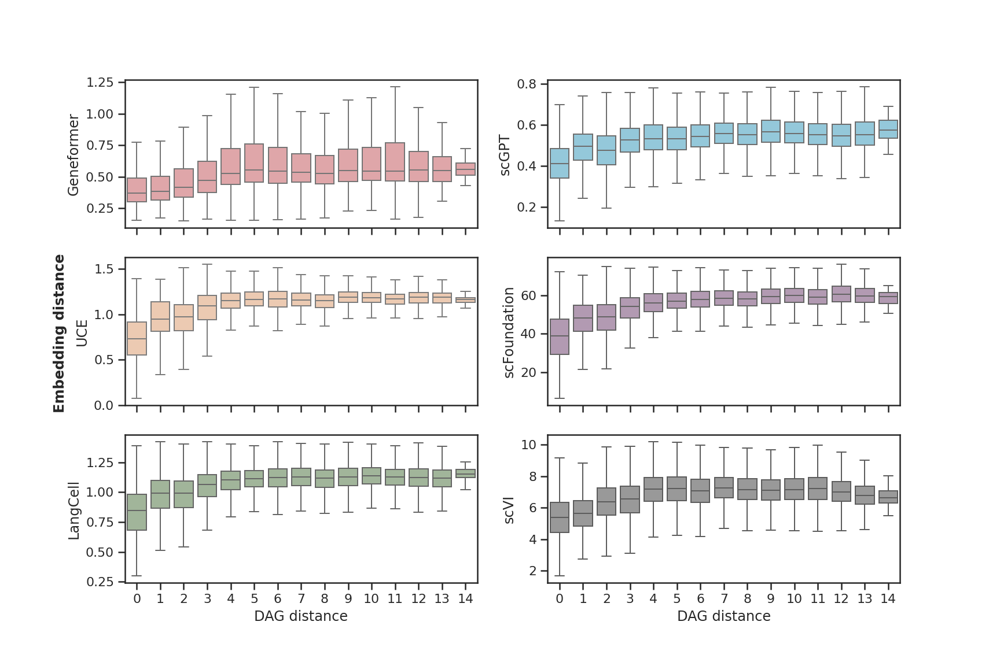

In [116]:
sns.set_theme(style="ticks")
fig, axes = plt.subplots(3, 2, figsize=(12, 8), sharex=True, sharey=False)
pal = sns.color_palette("tab20", 20)
for i, model in enumerate(model_order_wo_hvg):
    if model != "HVG":
        sns.boxplot(result_df, y=model, x="DAG distance", showfliers=False, ax=axes[i//2,i%2], 
                    color=custom_palette[model]
                    )
fig.text(0.06, 0.5, 'Embedding distance', ha='center', va='center', rotation='vertical', fontsize=12, fontweight="bold")
plt.savefig("../figures/clustering/emb_distance_distribution.png", dpi=300)

## Overall ranking

#### scIB

In [46]:
pd.set_option('display.precision', 4) 
df_all = pd.DataFrame()
for dataset in cluster_datasets:
    df = pd.DataFrame()
    for model in cluster_models:
        result_path = os.path.join(output_folder, dataset, dataset_info_dict[dataset]["layer_key"], model, "clustering_metrics.csv")
        df_ = pd.read_csv(result_path, index_col=0)
        df_.rename(columns=model_map_dict, inplace=True)
        df = pd.concat([df, df_], axis=1)
    # df["Dataset"] = dataset_map_dict[dataset]
    df_all = pd.concat([df_all, df])
df_all

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello
NMI_cluster/label,0.8245,0.9055,0.9158,0.9118,0.3706,0.6229,0.5934,0.5631,0.5657,0.7986
ARI_cluster/label,0.7655,0.9383,0.9457,0.9425,0.1510,0.4046,0.4068,0.3705,0.3214,0.7809
ASW_label,0.5660,0.5684,0.6908,0.6371,0.3742,0.5307,0.5482,0.5260,0.5165,0.6148
graph_conn,0.9634,0.9918,0.9861,0.9802,0.6935,0.9161,0.9136,0.8761,0.8681,0.9445
ASW_label/batch,0.9396,0.8708,0.8429,0.8454,0.5306,0.8494,0.8412,0.7929,0.7921,0.8643
avg_bio,0.7187,0.8040,0.8508,0.8305,0.2986,0.5194,0.5161,0.4865,0.4679,0.7314
avg_batch,0.9515,0.9313,0.9145,0.9128,0.6121,0.8827,0.8774,0.8345,0.8301,0.9044
overall,0.8118,0.8549,0.8763,0.8634,0.4240,0.6647,0.6606,0.6257,0.6128,0.8006
NMI_cluster/label,0.6736,0.8160,0.8129,0.7166,0.6200,0.6446,0.7732,0.6466,0.6836,0.7048
ARI_cluster/label,0.4835,0.8268,0.8209,0.6144,0.4481,0.5333,0.7212,0.2730,0.3875,0.4227


In [47]:
df_all_grouped = df_all.groupby(level=0).mean()
df_all_grouped

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello
ARI_cluster/label,0.5419,0.6822,0.6422,0.5451,0.3434,0.4527,0.5023,0.3651,0.3722,0.5627
ASW_label,0.5187,0.5308,0.5567,0.5297,0.4587,0.5179,0.5477,0.5417,0.5229,0.5833
ASW_label/batch,0.9339,0.8684,0.8375,0.7936,0.7870,0.8840,0.8422,0.8304,0.8580,0.8326
NMI_cluster/label,0.7339,0.7979,0.7602,0.6958,0.5849,0.6707,0.7093,0.6594,0.6618,0.7471
avg_batch,0.9334,0.9108,0.8834,0.8283,0.8102,0.8935,0.8870,0.8711,0.8746,0.8870
avg_bio,0.5982,0.6703,0.6530,0.5902,0.4623,0.5471,0.5865,0.5221,0.5190,0.6310
graph_conn,0.9329,0.9532,0.9292,0.8630,0.8334,0.9031,0.9319,0.9118,0.8912,0.9414
overall,0.7323,0.7665,0.7452,0.6855,0.6015,0.6857,0.7067,0.6617,0.6612,0.7334


In [48]:
keys = df_all_grouped.columns
values = df_all_grouped.loc[["avg_batch", "avg_bio"],:].values.transpose(1,0)
population = {k:v for k,v in zip(keys, values)}
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

Front 1: ['HVG', 'scVI']
Front 2: ['Harmony', 'scGPT', 'scCello']
Front 3: ['Seurat_v5(CCA)', 'UCE']
Front 4: ['scFoundation', 'LangCell']
Front 5: ['Geneformer']


### scGraph

In [57]:
df = pd.DataFrame()
for dataset in ["HLCA_core", "Tabula_Sapiens_all", "AIDA_v2_new"]:
    df_ = pd.read_csv(f"{output_folder}/scGraph/{dataset}.csv", index_col=0)
    df_["Dataset"] = dataset_map_dict[dataset]
    df = pd.concat([df, df_], axis=0)
df["Model"] = df.index
df["Model"] = df["Model"].apply(lambda x: model_map_dict.get(x, x))
df

,Rank-Counts,Pearson-Counts,Rank-PCA,Pearson-PCA,Rank-OntoRWR,Pearson-OntoRWR,Dataset,Model
X_geneformer,7.1915,0.7290,7.1915,0.6601,7.6400,0.6967,HLCA,Geneformer
X_harmony,10.6383,0.4202,10.6383,0.3200,12.5600,0.4481,HLCA,Harmony
X_hvg,12.4681,0.8166,12.4681,0.8957,14.3600,0.7656,HLCA,HVG
X_langcell,11.8298,0.8370,11.8298,0.6425,13.0800,0.7719,HLCA,LangCell
X_scanvi_emb,15.9149,0.7776,15.9149,0.6275,17.5200,0.7350,HLCA,X_scanvi_emb
X_scbert,0.7234,0.3943,0.7234,0.1852,0.8000,0.2665,HLCA,X_scbert
X_sccello,12.7660,0.6765,12.7660,0.7378,13.4800,0.7560,HLCA,scCello
X_scgpt,14.8936,0.7759,14.8936,0.7022,16.0800,0.7311,HLCA,scGPT
X_scvi,12.7234,0.7960,12.7234,0.6497,13.8800,0.7467,HLCA,scVI
X_scvi_hvg_wo_batchkey,12.8936,0.7672,12.8936,0.6714,14.7200,0.7372,HLCA,X_scvi_hvg_wo_batchkey


In [58]:
df_grouped = df.groupby("Model")[["Pearson-PCA", "Pearson-OntoRWR"]].agg("mean")
df_grouped

,Pearson-PCA,Pearson-OntoRWR
Model,,
Geneformer,0.6622,0.5444
HVG,0.8608,0.6534
Harmony,0.5791,0.4750
LangCell,0.6639,0.7025
Seurat_v5(CCA),0.7051,0.4494
UCE,0.6949,0.7156
X_pca,0.5818,0.3915
X_scanvi_emb,0.6275,0.7350
X_scbert,0.2686,0.2155


In [59]:
population = {k: df_grouped.loc[k].values for k in model_order}
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

Front 1: ['HVG', 'UCE', 'scFoundation']
Front 2: ['scGPT', 'LangCell', 'scCello']
Front 3: ['Seurat_v5(CCA)', 'scVI', 'Geneformer']
Front 4: ['Harmony']


In [60]:
population

{'HVG': array([0.86083987, 0.65343916]),
 'scVI': array([0.62221239, 0.63798024]),
 'Harmony': array([0.57912762, 0.47503534]),
 'Seurat_v5(CCA)': array([0.70510831, 0.44935086]),
 'Geneformer': array([0.66224436, 0.54440826]),
 'scGPT': array([0.7406948 , 0.63531977]),
 'UCE': array([0.69491122, 0.71564184]),
 'scFoundation': array([0.69717792, 0.70335758]),
 'LangCell': array([0.66390209, 0.70248275]),
 'scCello': array([0.69162627, 0.68954467])}

# Cell type annotation

## HLCA

### unseen_ratio = 0
result folder: lr_0.001_l2_1e-06_tesetset_0.2 or lr_0.001_l2_1e-06_tesetset_0.8
1. macro-f1 score (分段), already saved in all_metrics_unseen_0.csv
2. recalculate accuracy score when unseen_ratio > 0
3. compare training data 80% v.s. 20%

In [ ]:
dataset_name = "HLCA_core"
output_folder = f"../OnClass/results_best_params/"
df_all = pd.DataFrame()
for model in annotation_models:
    if model != "LR_OvR":
        params = model_to_params[dataset_name][model]
        lr, l2 = float(params["lr"]), float(params["l2"])
        result_path = os.path.join(output_folder, model, "onclass_dot_product", dataset_name, f"lr_{lr}_l2_{l2}_testset_0.8/all_metrics_unseen_0.csv")
    else:
        result_path = os.path.join(output_folder, model, "onclass_dot_product", dataset_name, "testset_0.8/all_metrics_unseen_0.csv")

    df = pd.read_csv(result_path).iloc[:-2, :]
    # if model == "xTrimoGene":
    #     df["model"] = "scFoundation"
    # else:
    #     df["model"] = model
    df["model"] = df["model"].apply(lambda x: model_map_dict.get(x, x))
    df_all = pd.concat([df_all, df])
df_all.head()

In [149]:
df_grouped = df_all.groupby("model").agg("mean")
df_grouped

,AUROC,AUPRC,AUROC(seen),AUPRC(seen),AUROC(unseen),AUPRC(unseen),Cohens Kappa,Accuracy@3,Accuracy@5,Accuracy@1,Macro F1,Macro F1 <100,"Macro F1 [100, 1000)","Macro F1 [1000, 5000)",Macro F1 >=5000,Accuracy@1(nonleaf),LCAD
model,,,,,,,,,,,,,,,,,
Geneformer,0.9980,0.9950,0.9980,0.9950,NaN,NaN,0.9125,0.9939,0.9981,0.9193,0.8518,0.7119,0.8225,0.8880,0.9151,0.5684,2.4020
LangCell,0.9986,0.9965,0.9986,0.9965,NaN,NaN,0.9274,0.9952,0.9984,0.9329,0.8901,0.8216,0.8711,0.9065,0.9305,0.5838,2.3703
UCE,0.9990,0.9976,0.9990,0.9976,NaN,NaN,0.9361,0.9964,0.9989,0.9410,0.9138,0.8627,0.9044,0.9265,0.9356,0.6041,2.4142
scFoundation,0.9989,0.9975,0.9989,0.9975,NaN,NaN,0.9422,0.9966,0.9989,0.9467,0.9190,0.8735,0.9047,0.9343,0.9419,0.5913,2.4082
scGPT,0.9981,0.9946,0.9981,0.9946,NaN,NaN,0.9015,0.9923,0.9974,0.9091,0.8535,0.7206,0.8434,0.8742,0.9053,0.5832,2.4164
scVI,0.9993,0.9980,0.9993,0.9980,NaN,NaN,0.9366,0.9964,0.9990,0.9415,0.9112,0.8463,0.9025,0.9243,0.9382,0.5785,2.4251


In [120]:
df_all["LCAD_rank"] = - df_all["LCAD"]
df_grouped = df_all.groupby("model").agg("mean")
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1", "LCAD_rank"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([ 0.91929082,  0.85180745, -2.40203178]), 'LangCell': array([ 0.93294058,  0.89007702, -2.37029303]), 'UCE': array([ 0.94103581,  0.91381305, -2.41417927]), 'scFoundation': array([ 0.94668708,  0.91896087, -2.40822818]), 'scGPT': array([ 0.90909333,  0.85350831, -2.41637356]), 'scVI': array([ 0.94150091,  0.91122556, -2.42510815])}
Front 1: ['LangCell', 'scFoundation']
Front 2: ['Geneformer', 'UCE', 'scVI']
Front 3: ['scGPT']


In [121]:
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.91929082, 0.85180745]), 'LangCell': array([0.93294058, 0.89007702]), 'UCE': array([0.94103581, 0.91381305]), 'scFoundation': array([0.94668708, 0.91896087]), 'scGPT': array([0.90909333, 0.85350831]), 'scVI': array([0.94150091, 0.91122556])}
Front 1: ['scFoundation']
Front 2: ['UCE', 'scVI']
Front 3: ['LangCell']
Front 4: ['Geneformer', 'scGPT']


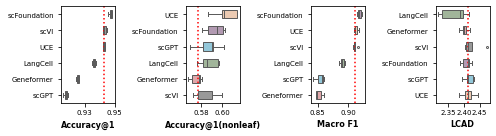

In [27]:
from matplotlib.ticker import FormatStrFormatter
def plot_violin(ax, x, y, data, hue, order, palette, xlabel, median_value):
    # sns.violinplot(x=x, y=y, data=data, hue=hue, width=0.5, alpha=0.8, ax=ax, order=order, palette=palette)
    sns.boxplot(x=x, y=y, data=data, hue=hue, width=0.5, ax=ax, order=order, palette=palette,
                flierprops=dict(marker='o', color='black', markersize=2, linestyle='none'))
    ax.axvline(x=median_value, color='r', linestyle=':')
    ax.set_ylabel("")
    ax.tick_params(axis='y', labelsize=7)
    ax.tick_params(axis='x', labelsize=7)
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax.set_xlabel(xlabel, fontweight="bold", fontsize=8)

def get_model_order(df, column, ascending=False):
    median_values = df.groupby('model')[column].median().sort_values(ascending=ascending)
    return median_values.index.tolist() 

fig, axes = plt.subplots(1, 4, figsize=(7, 2))
plt.subplots_adjust(wspace=0.1) 

for i, col in enumerate(["Accuracy@1", "Accuracy@1(nonleaf)", "Macro F1", "LCAD"]):
    model_order = get_model_order(df_all, col, ascending=True if col=="LCAD" else False)
    plot_violin(axes[i], col, 'model', df_all, 'model', model_order, custom_palette,
                col, df_all[df_all["model"] == "scVI"][col].median())

plt.tight_layout()
# plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/HLCA_Onclass_Yemb_0107.png", dpi=300, bbox_inches="tight")

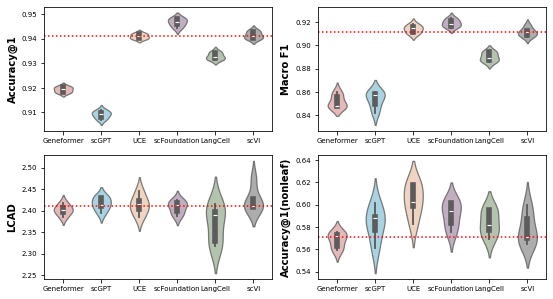

In [27]:
def plot_violin(ax, x, y, data, hue, order, palette, xlabel, median_value):
    sns.violinplot(x=x, y=y, data=data, hue=hue, width=0.5, alpha=0.8, ax=ax, order=order, palette=palette)
    ax.axhline(y=median_value, color='r', linestyle=':')
    ax.set_xlabel("")
    ax.tick_params(axis='y', labelsize=7)
    ax.tick_params(axis='x', labelsize=7)
    ax.set_ylabel(xlabel, fontweight="bold", fontsize=10)

fig, axes = plt.subplots(2, 2, figsize=(9, 5))
for i, col in enumerate(["Accuracy@1", "Macro F1", "LCAD", "Accuracy@1(nonleaf)"]):
    plot_violin(axes[i // 2, i % 2], 'model', col, df_all, 'model', model_order_wo_hvg, custom_palette,
                col, df_all[df_all["model"] == "scVI"][col].median())

plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/HLCA_Onclass_Yemb.png", dpi=300, bbox_inches="tight")

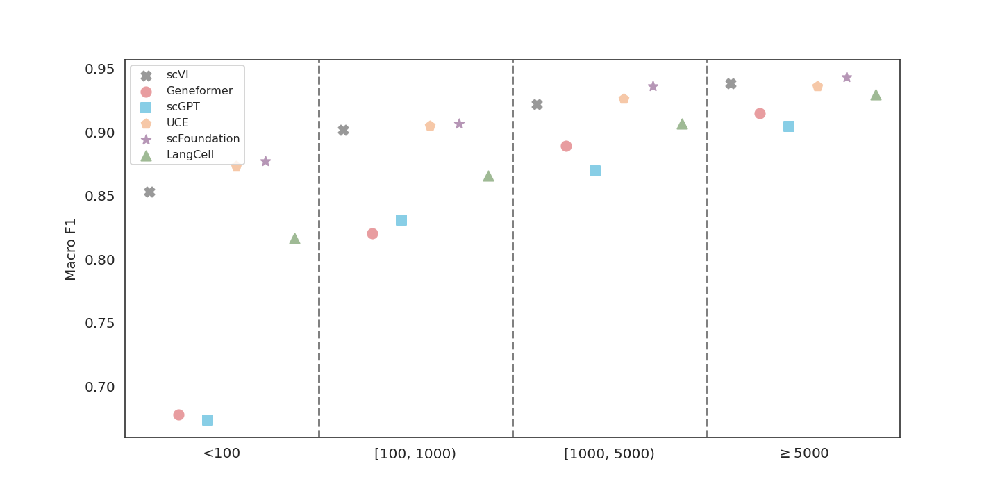

In [93]:
plt.figure(figsize=(10,5))
x = np.arange(1,5)
x_line = [0.5, 1.5, 2.5, 3.5, 4.5]
plt.xlim(0.5, 4.5)
width = 0.15
for i, model_name in enumerate(df_all["model"].unique()):
    x_pos = x + i * width - 2.5 * width  # Adjust x position for each dataset
    y = df_all[df_all["model"]==model_name].values[0, -8:-4].tolist()
    # print(x_pos)
    plt.scatter(x_pos, y, s=50, alpha=1, label=model_name, zorder=2, 
                marker=custom_shape[model_name], color=custom_palette[model_name])
    if model_name == "X":
        x_min = x_line[:-1]
        x_max = x_line[1:]
        xlim = plt.gca().get_xlim()
        for y_, x_min_, x_max_ in zip(y, x_min, x_max):
            print(y_, x_min_, x_max_)
            x_min_ = (x_min_ - xlim[0]) / (xlim[1] - xlim[0])
            x_max_ = (x_max_ - xlim[0]) / (xlim[1] - xlim[0])
            plt.axhline(y=y_, xmin=x_min_, xmax=x_max_, ls="--", color="red",zorder=1)

plt.legend(fontsize=8)
for x in x_line[1:-1]:
    plt.axvline(x=x, ls="--", color="grey")   
plt.ylabel("Macro F1")
plt.xticks(ticks=[1,2,3,4], labels=['<100', '[100, 1000)', '[1000, 5000)', '$\geq$5000'])
plt.savefig("figures/cell_annotation/best_params_scVI_with_batchkey/HLCA_Onclass_Yemb_macrof1.png", dpi=300, bbox_inches="tight")

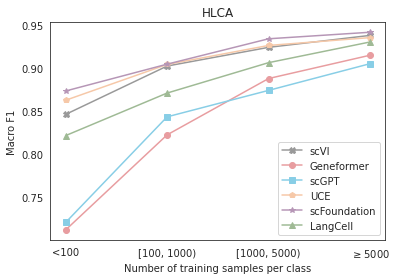

In [101]:
x = np.arange(4)
for i, model_name in enumerate(df_all["model"].unique()):
    y = df_all[df_all["model"]==model_name].values[:, -7:-3].mean(0).tolist()
    plt.plot(x, y, color=custom_palette[model_name], label=model_name, marker=custom_shape[model_name])
    # plt.scatter(x, y, color=custom_palette[model_name])
plt.xticks(x, labels=['<100', '[100, 1000)', '[1000, 5000)', '$\geq$5000'])
plt.xlabel("Number of training samples per class")
plt.ylabel("Macro F1")
plt.legend(ncol=1)
plt.title("HLCA")
plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/HLCA_Onclass_Yemb_macrof1_lineplot.png", dpi=300)

### unseen_ratio > 0

#### Confidence-adjusted confidence score
scBERT: evaluate the accuracy of novel cell type and known cell types, separately. Notably, we employed a strict evaluation method for novel cell types with the accuracy calculated on the union set of cells with the novel cell type label and the cells that are predicted as novel cell types

In [95]:
dataset_name = "HLCA_core"
output_folder = f"../OnClass/results_best_params/"
model_ls = ["scVI", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell"]
result_ls = []
for unseen_ratio in [0.1, 0.3, 0.5, 0.7, 0.9]:
    y_pred_ls = []
    unseen_confidence_ls = []
    for model in model_ls:
        params = model_to_params[dataset_name][model]
        lr, l2 = float(params["lr"]), float(params["l2"])
        for iter in range(5):
            result_file = os.path.join(output_folder, model, "onclass_dot_product", dataset_name, f"lr_{lr}_l2_{l2}_testset_0.2/{iter}/{unseen_ratio}/pred_label.csv")
            df = pd.read_csv(result_file)
            y_true = df["y_true"]
            y_pred = df["y_pred"]

            result = {
                "model": model if model != "xTrimoGene" else "scFoundation",
                "unseen_ratio": unseen_ratio,
                "iter": iter,
            }

            for FPR in [0.05, 0.1, 0.2]:
                cut_off_ratio, number_unkonw = get_FPR(df[df["unseen"]==1].negative_energy, FPR=FPR)
                acc_unknown = accuracy_for_unkonw(y_pred, df["negative_energy"], y_true, number_unkonw, cut_off_ratio=cut_off_ratio)
                result.update({f"Accuracy(FPR={FPR})": acc_unknown})
            
            auroc_softmax = roc_auc_score(1-df["unseen"], df["softmax_score"])
            auprc_softmax = average_precision_score(1-df["unseen"], df["softmax_score"])

            auroc_energy = roc_auc_score(1-df["unseen"], df["negative_energy"])
            auprc_energy = average_precision_score(1-df["unseen"], df["negative_energy"])
            result.update({
                "AUROC(softmax)": auroc_softmax,
                "AUPRC(softmax)": auprc_softmax,
                "AUROC(energy)": auroc_energy,
                "AUPRC(energy)": auprc_energy
                })

            result_ls.append(result)
result_df = pd.DataFrame(result_ls)
result_df

,model,unseen_ratio,iter,Accuracy(FPR=0.05),Accuracy(FPR=0.1),Accuracy(FPR=0.2),AUROC(softmax),AUPRC(softmax),AUROC(energy),AUPRC(energy)
0,scVI,0.1,0,0.5271,0.6464,0.7753,0.8288,0.9257,0.8842,0.9495
1,scVI,0.1,1,0.3002,0.4172,0.5707,0.7563,0.8653,0.7742,0.8810
2,scVI,0.1,2,0.6025,0.7222,0.8293,0.8398,0.9612,0.9069,0.9776
3,scVI,0.1,3,0.7474,0.8413,0.9016,0.9083,0.9379,0.9519,0.9671
4,scVI,0.1,4,0.5997,0.7076,0.8112,0.8323,0.9483,0.8985,0.9707
...,...,...,...,...,...,...,...,...,...,...
145,LangCell,0.9,0,0.4083,0.6201,0.8732,0.9120,0.1384,0.9062,0.1938
146,LangCell,0.9,1,0.4428,0.6848,0.8410,0.8082,0.0574,0.8961,0.1090
147,LangCell,0.9,2,0.6288,0.6768,0.7553,0.8843,0.3080,0.8745,0.4162
148,LangCell,0.9,3,0.1825,0.5006,0.7981,0.8834,0.0986,0.8580,0.0713


In [12]:
# result_df.to_csv("../figures/cell_annotation/best_params_scVI_with_batchkey/novel_cells/hlca_accuracy_unseen.csv",index=False)
result_df = pd.read_csv("../figures/cell_annotation/best_params_scVI_with_batchkey/novel_cells/hlca_accuracy_unseen.csv")

In [99]:
df_grouped = result_df.groupby("model").agg("mean")
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy(FPR=0.05)", "Accuracy(FPR=0.1)", "Accuracy(FPR=0.2)"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.36493527, 0.49370682, 0.67493186]), 'LangCell': array([0.35338765, 0.51442581, 0.71887928]), 'UCE': array([0.45035753, 0.61514088, 0.80408696]), 'scFoundation': array([0.37829598, 0.56082185, 0.75405769]), 'scGPT': array([0.33061169, 0.46212799, 0.66796988]), 'scVI': array([0.36867051, 0.52603342, 0.72424885])}
Front 1: ['UCE']
Front 2: ['scFoundation']
Front 3: ['scVI']
Front 4: ['Geneformer', 'LangCell']
Front 5: ['scGPT']


In [106]:
summary = result_df.groupby(["model", "unseen_ratio"]).agg({"Accuracy(FPR=0.05)": ['mean', 'std']}).reset_index()
summary.columns = ["model", "unseen_ratio", 'mean', 'std']
summary

,model,unseen_ratio,mean,std
0,Geneformer,0.1,0.5392,0.1663
1,Geneformer,0.3,0.2972,0.1425
2,Geneformer,0.5,0.3599,0.1415
3,Geneformer,0.7,0.2536,0.1021
4,Geneformer,0.9,0.3748,0.2478
5,LangCell,0.1,0.4816,0.1006
6,LangCell,0.3,0.3471,0.0717
7,LangCell,0.5,0.2970,0.1015
8,LangCell,0.7,0.2855,0.1057
9,LangCell,0.9,0.3558,0.2074


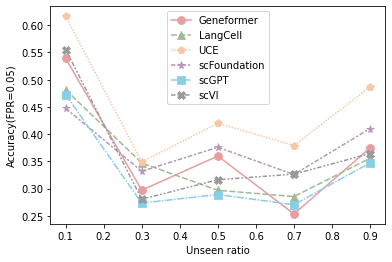

In [108]:
sns.lineplot(x='unseen_ratio', y='mean', data=summary, style='model', hue='model', markers=custom_shape, markersize=8, markeredgecolor=None, palette=custom_palette)
plt.xlabel("Unseen ratio")
plt.ylabel("Accuracy(FPR=0.05)")
ax = plt.gca()
ax.legend(title="")

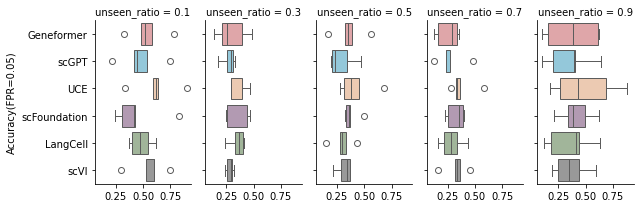

In [189]:
grid = sns.FacetGrid(result_df, col="unseen_ratio", aspect=0.6)
grid.map(sns.boxplot, "Accuracy(FPR=0.05)", "model", data=result_df, hue="model", 
         palette=custom_palette, order=model_order_wo_hvg)
grid.set_axis_labels('', "Accuracy(FPR=0.05)")
# grid.set_xticklabels(rotation=45)
plt.tight_layout()
plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/novel_cells/hlca_accuracy_fpr_0.05.png", dpi=300, bbox_inches='tight')

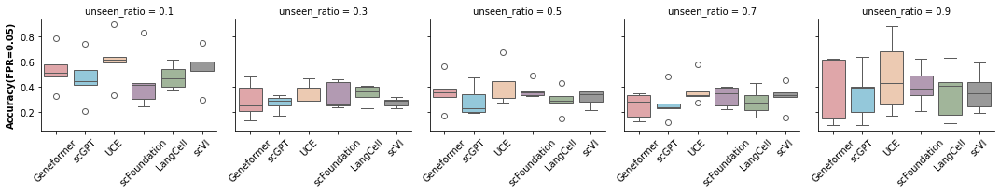

In [19]:
grid = sns.FacetGrid(result_df, col="unseen_ratio")
grid.map(sns.boxplot, "model", "Accuracy(FPR=0.05)", data=result_df, hue="model", 
         palette=custom_palette, order=model_order_wo_hvg)
grid.set_axis_labels('', "Accuracy(FPR=0.05)", fontweight="bold")
grid.set_xticklabels(rotation=45)
plt.tight_layout()
plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/novel_cells/hlca_accuracy_fpr_0.05.png", dpi=300, bbox_inches='tight')

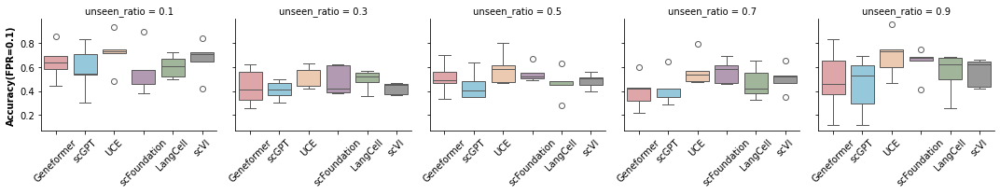

In [20]:
grid = sns.FacetGrid(result_df, col="unseen_ratio")
grid.map(sns.boxplot, "model", "Accuracy(FPR=0.1)", data=result_df, hue="model",
         palette=custom_palette, order=model_order_wo_hvg)
grid.set_axis_labels('', "Accuracy(FPR=0.1)", fontweight="bold")
grid.set_xticklabels(rotation=45)
plt.tight_layout()
plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/novel_cells/hlca_accuracy_fpr_0.1.png", dpi=300, bbox_inches='tight')

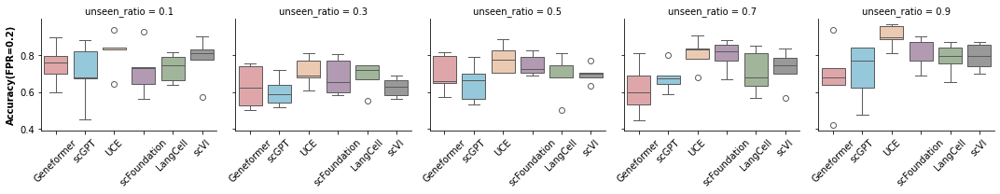

In [21]:
grid = sns.FacetGrid(result_df, col="unseen_ratio")
grid.map(sns.boxplot, "model", "Accuracy(FPR=0.2)", data=result_df, hue="model", 
         palette=custom_palette, order=model_order_wo_hvg)
grid.set_axis_labels('', "Accuracy(FPR=0.2)", fontweight="bold")
grid.set_xticklabels(rotation=45)
plt.tight_layout()
plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/novel_cells/hlca_accuracy_fpr_0.2.png", dpi=300, bbox_inches='tight')

#### OOD detection

In [105]:
result_grouped = result_df.groupby(["model", "unseen_ratio"]).agg("mean").reset_index()
result_grouped

,model,unseen_ratio,iter,Accuracy(FPR=0.05),Accuracy(FPR=0.1),Accuracy(FPR=0.2),AUROC(softmax),AUPRC(softmax),AUROC(energy),AUPRC(energy)
0,Geneformer,0.1,2.0,0.5392,0.6421,0.7515,0.7857,0.9086,0.8758,0.9486
1,Geneformer,0.3,2.0,0.2972,0.4339,0.6304,0.7858,0.6488,0.8209,0.6752
2,Geneformer,0.5,2.0,0.3599,0.5097,0.6981,0.7637,0.5349,0.8435,0.6389
3,Geneformer,0.7,2.0,0.2536,0.3952,0.6140,0.7894,0.3471,0.8212,0.3685
4,Geneformer,0.9,2.0,0.3748,0.4876,0.6808,0.8490,0.1717,0.8454,0.2005
5,LangCell,0.1,2.0,0.4816,0.6012,0.7312,0.8122,0.9188,0.8619,0.9400
6,LangCell,0.3,2.0,0.3471,0.4919,0.6854,0.8088,0.6837,0.8425,0.7174
7,LangCell,0.5,2.0,0.2970,0.4646,0.6835,0.7730,0.5124,0.8380,0.6006
8,LangCell,0.7,2.0,0.2855,0.4662,0.7098,0.8178,0.3480,0.8488,0.4010
9,LangCell,0.9,2.0,0.3558,0.5483,0.7845,0.8796,0.1560,0.8694,0.1799


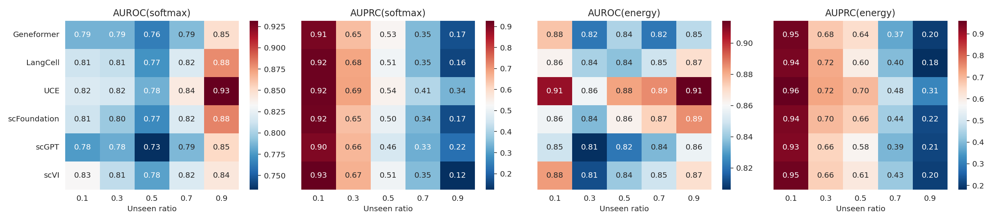

In [110]:
fig, axes = plt.subplots(1, 4, figsize=(18, 4), sharex=True, sharey=False)
for i, col in enumerate(["AUROC(softmax)", "AUPRC(softmax)", "AUROC(energy)", "AUPRC(energy)"]):
    heatmap_df = result_grouped.pivot(index="model", columns="unseen_ratio", values=col)
    sns.heatmap(heatmap_df, annot=True, cmap="RdBu_r", ax=axes[i], fmt='.2f')
    axes[i].set_ylabel("")
    axes[i].set_xlabel("Unseen ratio")
    axes[i].set_title(col)
    if i > 0:
        axes[i].set_yticklabels("")
plt.tight_layout()
plt.savefig("figures/cell_annotation/best_params_scVI_with_batchkey/novel_cells/hlca_confidence_iid_positive.png", dpi=300, bbox_inches='tight')

## Tabula Sapiens

### unseen_ratio = 0

In [28]:
dataset_name = "Tabula_Sapiens_all"
# output_folder = f"../OnClass/result/"
output_folder = f"../OnClass/results_best_params/"
df_all = pd.DataFrame()
for model in ["scVI", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell"]:
    params = model_to_params[dataset_name][model]
    lr, l2 = float(params["lr"]), float(params["l2"])
    for unseen_ratio in [0]:
        result_path = os.path.join(output_folder, model, "onclass_dot_product", dataset_name, f"lr_{lr}_l2_{l2}_testset_0.8/all_metrics_unseen_{unseen_ratio}.csv")
        df = pd.read_csv(result_path).iloc[:-2, :]
        if model == "xTrimoGene":
            df["model"] = "scFoundation"
        else:
            df["model"] = model
        df_all = pd.concat([df_all, df])
df_all.head()

,AUROC,AUPRC,AUROC(seen),AUPRC(seen),AUROC(unseen),AUPRC(unseen),Cohens Kappa,Accuracy@3,Accuracy@5,Accuracy@1,Macro F1,Macro F1 <100,"Macro F1 [100, 1000)","Macro F1 [1000, 5000)",Macro F1 >=5000,Accuracy@1(nonleaf),LCAD,model
0,0.9970,0.9917,0.9970,0.9917,NaN,NaN,0.8612,0.9718,0.9889,0.8656,0.6765,0.5479,0.7611,0.8706,NaN,0.4793,2.1863,scVI
1,0.9971,0.9910,0.9971,0.9910,NaN,NaN,0.8584,0.9707,0.9890,0.8629,0.6661,0.5345,0.7525,0.8654,NaN,0.4889,2.1500,scVI
2,0.9968,0.9903,0.9968,0.9903,NaN,NaN,0.8630,0.9728,0.9899,0.8673,0.6817,0.5561,0.7645,0.8711,NaN,0.4648,2.1811,scVI
3,0.9974,0.9913,0.9974,0.9913,NaN,NaN,0.8619,0.9726,0.9896,0.8662,0.6885,0.5711,0.7630,0.8712,NaN,0.4717,2.1645,scVI
4,0.9972,0.9916,0.9972,0.9916,NaN,NaN,0.8690,0.9738,0.9901,0.8731,0.7037,0.5925,0.7743,0.8769,NaN,0.4638,2.1759,scVI


In [45]:
df_all["LCAD_rank"] = - df_all["LCAD"]
df_grouped = df_all.groupby("model").agg("mean")
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1", "LCAD_rank"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([ 0.85780208,  0.61623062, -2.178942  ]), 'LangCell': array([ 0.896001  ,  0.7239172 , -2.10166349]), 'UCE': array([ 0.90902583,  0.78126821, -2.06411778]), 'scFoundation': array([ 0.9128577 ,  0.77673268, -2.02378273]), 'scGPT': array([ 0.83889157,  0.64134797, -2.27596735]), 'scVI': array([ 0.8670034 ,  0.68329797, -2.17155159])}
Front 1: ['UCE', 'scFoundation']
Front 2: ['LangCell']
Front 3: ['scVI']
Front 4: ['Geneformer', 'scGPT']


In [46]:
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.85780208, 0.61623062]), 'LangCell': array([0.896001 , 0.7239172]), 'UCE': array([0.90902583, 0.78126821]), 'scFoundation': array([0.9128577 , 0.77673268]), 'scGPT': array([0.83889157, 0.64134797]), 'scVI': array([0.8670034 , 0.68329797])}
Front 1: ['UCE', 'scFoundation']
Front 2: ['LangCell']
Front 3: ['scVI']
Front 4: ['Geneformer', 'scGPT']


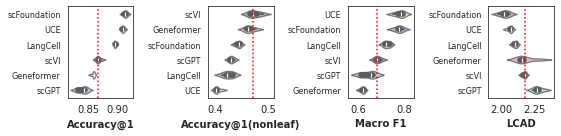

In [103]:
def plot_violin(ax, x, y, data, hue, order, palette, xlabel, median_value):
    sns.violinplot(x=x, y=y, data=data, hue=hue, width=0.5, alpha=0.8, ax=ax, order=order, palette=palette,
                   flierprops=dict(marker='o', color='black', markersize=2, linestyle='none'))
    ax.axvline(x=median_value, color='r', linestyle=':')
    ax.set_ylabel("")
    ax.tick_params(axis='y', labelsize=8)
    ax.set_xlabel(xlabel, fontweight="bold")

def get_model_order(df, column, ascending=False):
    median_values = df.groupby('model')[column].median().sort_values(ascending=ascending)
    return median_values.index.tolist() 

fig, axes = plt.subplots(1, 4, figsize=(8, 2))

for i, col in enumerate(["Accuracy@1", "Accuracy@1(nonleaf)", "Macro F1", "LCAD"]):
    model_order = get_model_order(df_all, col, ascending=True if col=="LCAD" else False)
    plot_violin(axes[i], col, 'model', df_all, 'model', model_order, custom_palette,
                col, df_all[df_all["model"] == "scVI"][col].median())
    
plt.tight_layout()
plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/Tabula_Onclass_Yemb_0107.png", dpi=300, bbox_inches="tight")

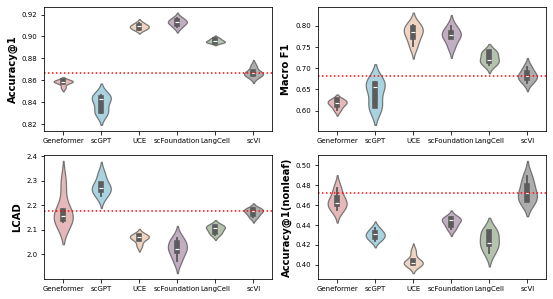

In [29]:
def plot_violin(ax, x, y, data, hue, order, palette, xlabel, median_value):
    sns.violinplot(x=x, y=y, data=data, hue=hue, width=0.5, alpha=0.8, ax=ax, order=order, palette=palette)
    ax.axhline(y=median_value, color='r', linestyle=':')
    ax.set_xlabel("")
    ax.tick_params(axis='y', labelsize=7)
    ax.tick_params(axis='x', labelsize=7)
    ax.set_ylabel(xlabel, fontweight="bold", fontsize=10)

fig, axes = plt.subplots(2, 2, figsize=(9, 5))
for i, col in enumerate(["Accuracy@1", "Macro F1", "LCAD", "Accuracy@1(nonleaf)"]):
    plot_violin(axes[i // 2, i % 2], 'model', col, df_all, 'model', model_order_wo_hvg, custom_palette,
                col, df_all[df_all["model"] == "scVI"][col].median())

plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/Tabula_Onclass_Yemb.png", dpi=300, bbox_inches="tight")

In [64]:
df_all[df_all["model"]=="scVI"]

,AUROC,AUPRC,AUROC(seen),AUPRC(seen),AUROC(unseen),AUPRC(unseen),Cohens Kappa,Accuracy@3,Accuracy@5,Accuracy@1,Macro F1,Macro F1 <100,"Macro F1 [100, 1000)","Macro F1 [1000, 5000)",Macro F1 >=5000,Accuracy@1(nonleaf),LCAD,model,LCAD_rank
0,0.9970,0.9917,0.9970,0.9917,NaN,NaN,0.8612,0.9718,0.9889,0.8656,0.6765,0.5479,0.7611,0.8706,NaN,0.4793,2.1863,scVI,-2.1863
1,0.9971,0.9910,0.9971,0.9910,NaN,NaN,0.8584,0.9707,0.9890,0.8629,0.6661,0.5345,0.7525,0.8654,NaN,0.4889,2.1500,scVI,-2.1500
2,0.9968,0.9903,0.9968,0.9903,NaN,NaN,0.8630,0.9728,0.9899,0.8673,0.6817,0.5561,0.7645,0.8711,NaN,0.4648,2.1811,scVI,-2.1811
3,0.9974,0.9913,0.9974,0.9913,NaN,NaN,0.8619,0.9726,0.9896,0.8662,0.6885,0.5711,0.7630,0.8712,NaN,0.4717,2.1645,scVI,-2.1645
4,0.9972,0.9916,0.9972,0.9916,NaN,NaN,0.8690,0.9738,0.9901,0.8731,0.7037,0.5925,0.7743,0.8769,NaN,0.4638,2.1759,scVI,-2.1759


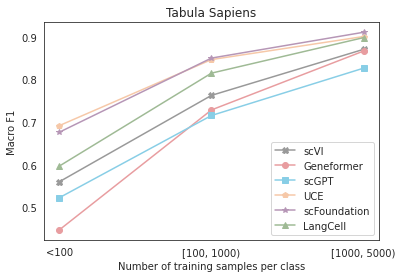

In [89]:
# plot one time --> average of five times
x = np.arange(3)
for i, model_name in enumerate(df_all["model"].unique()):
    y = df_all[df_all["model"]==model_name].values[:, -7:-4].mean(0).tolist()
    plt.plot(x, y, color=custom_palette[model_name], label=model_name, marker=custom_shape[model_name])
    # plt.scatter(x, y, color=custom_palette[model_name])
plt.xticks(x, labels=['<100', '[100, 1000)', '[1000, 5000)'])
plt.xlabel("Number of training samples per class")
plt.ylabel("Macro F1")
plt.legend(ncol=1)
plt.title("Tabula Sapiens")
plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/Tabula_Onclass_Yemb_macrof1_lineplot.png", dpi=300)

### unseen_ratio > 0

#### Distribution of confidence scores

In [129]:
dataset_name = "Tabula_Sapiens_all"
output_folder = f"../OnClass/results_best_params/"
pred_df_all = pd.DataFrame()
for model in ["scVI", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell"]:
    params = model_to_params[dataset_name][model]
    lr, l2 = float(params["lr"]), float(params["l2"])
    for unseen_ratio in [0.1,0.3,0.5,0.7,0.9]:
        for seed in range(5):
            result_path = os.path.join(output_folder, model, "onclass_dot_product", dataset_name, f"lr_{lr}_l2_{l2}_testset_0.2/{seed}/{unseen_ratio}/pred_label.csv")
            df = pd.read_csv(result_path)
            if model == "xTrimoGene":
                df["model"] = "scFoundation"
            else:
                df["model"] = model
            df["unseen_ratio"] = unseen_ratio
            df["seed"] = seed
            pred_df_all = pd.concat([pred_df_all, df])
pred_df_all.head()

,y_true,y_pred,y_pred_all,softmax_score,energy_score,negative_energy,unseen,model,unseen_ratio,seed
0,CL:0002623,CL:0002518,CL:0002518,0.5603,0.2656,-0.2656,1,scVI,0.1,0
1,CL:0002623,CL:0000646,CL:0000646,0.6433,-1.1183,1.1183,1,scVI,0.1,0
2,CL:0000233,CL:0000232,CL:0000232,0.9871,-3.1622,3.1622,1,scVI,0.1,0
3,CL:0002623,CL:0002518,CL:0002518,0.6919,-2.8209,2.8209,1,scVI,0.1,0
4,CL:0002623,CL:0000746,CL:0000746,0.9546,-2.1236,2.1236,1,scVI,0.1,0


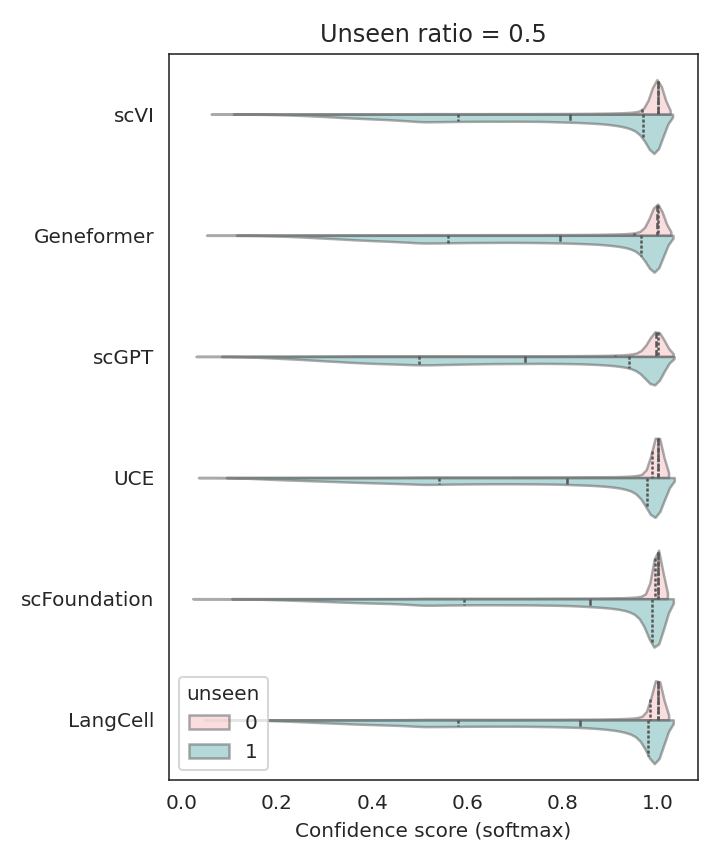

In [130]:
# visualize probs distribution
unseen_ratio = 0.5
plt.figure(figsize=(5,6))
sns.violinplot(data=pred_df_all[pred_df_all["unseen_ratio"]==unseen_ratio], x="softmax_score", y="model", hue="unseen",
               split=True, 
               inner="quart", fill=True,
               palette={0: "#ffb6b9", 1: "#61c0bf"},
               alpha=0.5
               )
plt.xlabel("Confidence score (softmax)")
plt.ylabel("")
plt.title(f"Unseen ratio = {unseen_ratio}")
plt.tight_layout()

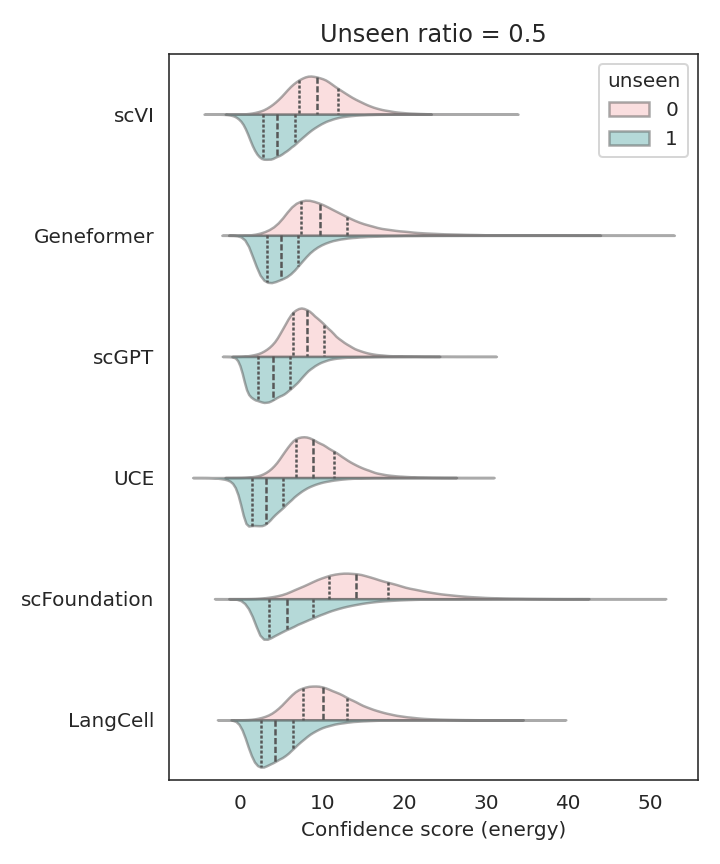

In [131]:
unseen_ratio = 0.5
plt.figure(figsize=(5,6))
sns.violinplot(data=pred_df_all[pred_df_all["unseen_ratio"]==unseen_ratio], x="negative_energy", y="model", hue="unseen",
               split=True, 
               inner="quart", fill=True,
               palette={0: "#ffb6b9", 1: "#61c0bf"},
               alpha=0.5
               )
plt.xlabel("Confidence score (energy)")
plt.ylabel("")
plt.title(f"Unseen ratio = {unseen_ratio}")
plt.tight_layout()

#### Confidence-adjusted confidence score
scBERT: evaluate the accuracy of novel cell type and known cell types, separately. Notably, we employed a strict evaluation method for novel cell types with the accuracy calculated on the union set of cells with the novel cell type label and the cells that are predicted as novel cell types

In [ ]:
dataset_name = "Tabula_Sapiens_all"
output_folder = f"../OnClass/results_best_params/"
model_ls = ["scVI", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell"]
result_ls = []
for unseen_ratio in [0.1, 0.3, 0.5, 0.7, 0.9]:
    y_pred_ls = []
    unseen_confidence_ls = []
    for model in model_ls:
        params = model_to_params[dataset_name][model]
        lr, l2 = float(params["lr"]), float(params["l2"])
        for iter in range(5):
            result_file = os.path.join(output_folder, model, "onclass_dot_product", dataset_name, f"lr_{lr}_l2_{l2}_testset_0.2/{iter}/{unseen_ratio}/pred_label.csv")
            df = pd.read_csv(result_file)
            y_true = df["y_true"]
            y_pred = df["y_pred"]

            result = {
                "model": model if model != "xTrimoGene" else "scFoundation",
                "unseen_ratio": unseen_ratio,
                "iter": iter,
            }

            for FPR in [0.05, 0.1, 0.2]:
                cut_off_ratio, number_unkonw = get_FPR(df[df["unseen"]==1].negative_energy, FPR=FPR)
                acc_unknown = accuracy_for_unkonw(y_pred, df["negative_energy"], y_true, number_unkonw, cut_off_ratio=cut_off_ratio)
                result.update({f"Accuracy(FPR={FPR})": acc_unknown})
            
            auroc_softmax = roc_auc_score(1-df["unseen"], df["softmax_score"])
            auprc_softmax = average_precision_score(1-df["unseen"], df["softmax_score"])

            auroc_energy = roc_auc_score(1-df["unseen"], df["negative_energy"])
            auprc_energy = average_precision_score(1-df["unseen"], df["negative_energy"])
            result.update({
                "AUROC(softmax)": auroc_softmax,
                "AUPRC(softmax)": auprc_softmax,
                "AUROC(energy)": auroc_energy,
                "AUPRC(energy)": auprc_energy
                })

            result_ls.append(result)
result_df = pd.DataFrame(result_ls)
result_df

In [22]:
# result_df.to_csv("../figures/cell_annotation/best_params_scVI_with_batchkey/novel_cells/tabula_accuracy_unseen.csv",index=False)
result_df = pd.read_csv("../figures/cell_annotation/best_params_scVI_with_batchkey/novel_cells/tabula_accuracy_unseen.csv")

In [31]:
df_grouped = result_df.groupby("model").agg("mean")
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy(FPR=0.05)", "Accuracy(FPR=0.1)", "Accuracy(FPR=0.2)"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.3859947 , 0.52441459, 0.67559759]), 'LangCell': array([0.4790014 , 0.62279622, 0.7779991 ]), 'UCE': array([0.53270768, 0.67175439, 0.80858481]), 'scFoundation': array([0.46521699, 0.62439884, 0.78460485]), 'scGPT': array([0.43695119, 0.56614411, 0.70502481]), 'scVI': array([0.41754955, 0.55556853, 0.70707006])}
Front 1: ['UCE']
Front 2: ['LangCell', 'scFoundation']
Front 3: ['scGPT', 'scVI']
Front 4: ['Geneformer']


In [89]:
summary = result_df.groupby(["model", "unseen_ratio"]).agg({"Accuracy(FPR=0.05)": ['mean', 'std']}).reset_index()
summary.columns = ["model", "unseen_ratio", 'mean', 'std']
summary

,model,unseen_ratio,mean,std
0,Geneformer,0.1,0.2586,0.1802
1,Geneformer,0.3,0.3363,0.0944
2,Geneformer,0.5,0.3893,0.0454
3,Geneformer,0.7,0.4234,0.1119
4,Geneformer,0.9,0.5223,0.1996
5,LangCell,0.1,0.3632,0.1206
6,LangCell,0.3,0.4468,0.0924
7,LangCell,0.5,0.4727,0.0722
8,LangCell,0.7,0.5175,0.1165
9,LangCell,0.9,0.5948,0.1628


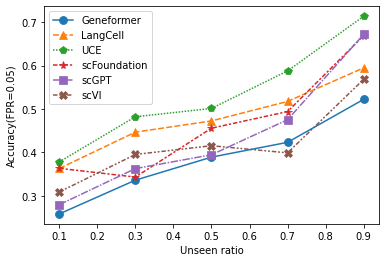

In [104]:
sns.lineplot(x='unseen_ratio', y='mean', data=summary, style='model', hue='model', markers=custom_shape, markersize=8, markeredgecolor=None)
plt.xlabel("Unseen ratio")
plt.ylabel("Accuracy(FPR=0.05)")
ax = plt.gca()
ax.legend(title="")

# add error bar
# palette = sns.color_palette()
# models = summary['model'].unique()
# for i, model in enumerate(models):
#     model_data = summary[summary['model'] == model]
#     plt.errorbar(x=model_data['unseen_ratio'], 
#                  y=model_data['mean'], 
#                  yerr=model_data['std'], 
#                  fmt='none', 
#                  capsize=5, 
#                  ecolor=palette[i], 
#                  elinewidth=2) 
# plt.savefig("figures/cell_annotation/best_params_scVI_with_batchkey/novel_cells/tabula_accuracy_fpr_0.05.png", dpi=300, bbox_inches='tight')

In [ ]:
from matplotlib.ticker import FormatStrFormatter
def plot_violin(ax, x, y, data, hue, order, palette, xlabel, median_value):
    # sns.violinplot(x=x, y=y, data=data, hue=hue, width=0.5, alpha=0.8, ax=ax, order=order, palette=palette)
    sns.boxplot(x=x, y=y, data=data, hue=hue, width=0.5, ax=ax, order=order, palette=palette, 
                flierprops=dict(marker='o', color='black', markersize=2, linestyle='none'))
    ax.axvline(x=median_value, color='r', linestyle=':')
    ax.set_ylabel("")
    ax.tick_params(axis='y', labelsize=8)
    ax.tick_params(axis='x', labelsize=7)
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax.set_xlabel(xlabel, fontweight="bold")

def get_model_order(df, column, ascending=False):
    median_values = df.groupby('model')[column].median().sort_values(ascending=ascending)
    return median_values.index.tolist() 

cols = ["Accuracy@1", "Macro F1", "LCAD"]
fig, axes = plt.subplots(1, len(cols), figsize=(2*len(cols)-1, 2.3))

for i, col in enumerate(cols):
    model_order = get_model_order(df_all, col, ascending=True if col=="LCAD" else False)
    plot_violin(axes[i], col, 'model', df_all, 'model', model_order, custom_palette,
                col, df_all[df_all["model"] == "scVI"][col].median())
fig.suptitle("Transfer from Tabula Sapiens to HLCA", fontsize=10, fontweight='bold')
plt.tight_layout()
plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/tabula_to_hlca.png", dpi=300, bbox_inches='tight')

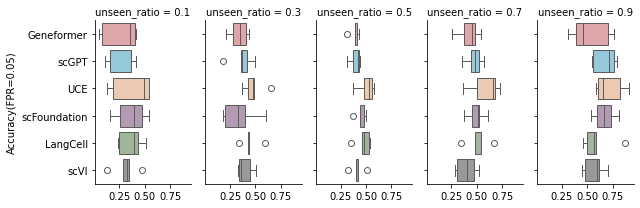

In [185]:
grid = sns.FacetGrid(result_df, col="unseen_ratio", aspect=0.6)
grid.map(sns.boxplot, "Accuracy(FPR=0.05)", "model", data=result_df, hue="model", 
         palette=custom_palette, order=model_order_wo_hvg)
grid.set_axis_labels('', "Accuracy(FPR=0.05)")
plt.tight_layout()
plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/novel_cells/tabula_accuracy_fpr_0.05.png", dpi=300, bbox_inches='tight')

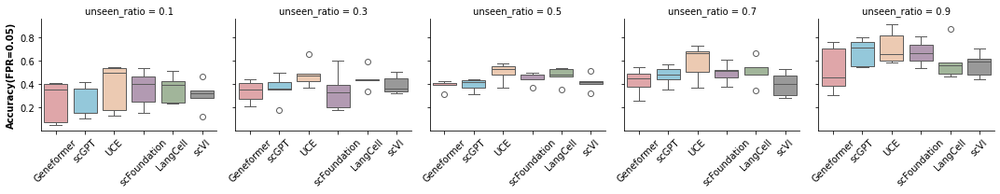

In [23]:
grid = sns.FacetGrid(result_df, col="unseen_ratio")
grid.map(sns.boxplot, "model", "Accuracy(FPR=0.05)", data=result_df, hue="model", 
         palette=custom_palette, order=model_order_wo_hvg)
grid.set_axis_labels('', "Accuracy(FPR=0.05)", fontweight="bold")
grid.set_xticklabels(rotation=45)
plt.tight_layout()
plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/novel_cells/tabula_accuracy_fpr_0.05.png", dpi=300, bbox_inches='tight')

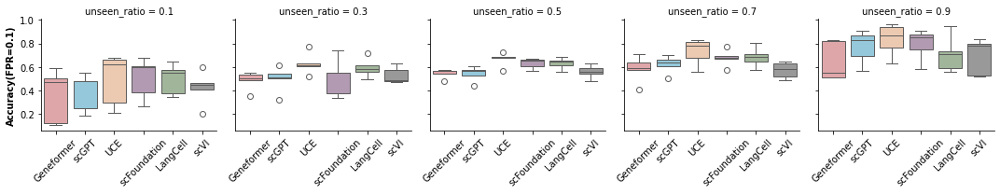

In [24]:
grid = sns.FacetGrid(result_df, col="unseen_ratio")
grid.map(sns.boxplot, "model", "Accuracy(FPR=0.1)", data=result_df, hue="model",
         palette=custom_palette, order=model_order_wo_hvg)
grid.set_axis_labels('', "Accuracy(FPR=0.1)", fontweight="bold")
grid.set_xticklabels(rotation=45)
plt.tight_layout()
plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/novel_cells/tabula_accuracy_fpr_0.1.png", dpi=300, bbox_inches='tight')

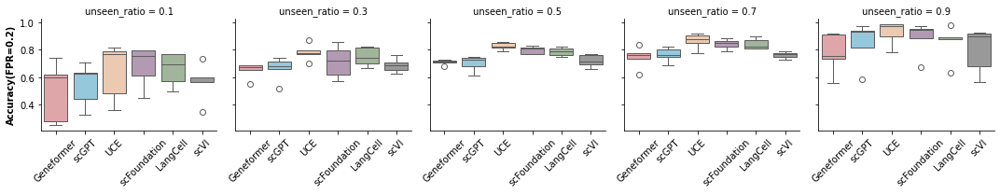

In [25]:
grid = sns.FacetGrid(result_df, col="unseen_ratio")
grid.map(sns.boxplot, "model", "Accuracy(FPR=0.2)", data=result_df, hue="model", 
         palette=custom_palette, order=model_order_wo_hvg)
grid.set_axis_labels('', "Accuracy(FPR=0.2)", fontweight="bold")
grid.set_xticklabels(rotation=45)
plt.tight_layout()
plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/novel_cells/tabula_accuracy_fpr_0.2.png", dpi=300, bbox_inches='tight')

#### OOD detection

In [139]:
result_grouped = result_df.groupby(["model", "unseen_ratio"]).agg("mean").reset_index()
result_grouped

,model,unseen_ratio,iter,Accuracy(FPR=0.05),Accuracy(FPR=0.1),Accuracy(FPR=0.2),AUROC(softmax),AUPRC(softmax),AUROC(energy),AUPRC(energy)
0,Geneformer,0.1,2.0,0.2586,0.3594,0.4969,0.7137,0.8579,0.7366,0.8664
1,Geneformer,0.3,2.0,0.3363,0.4880,0.6506,0.7773,0.7164,0.8160,0.7367
2,Geneformer,0.5,2.0,0.3893,0.5475,0.7099,0.8028,0.5558,0.8529,0.6013
3,Geneformer,0.7,2.0,0.4234,0.5837,0.7445,0.8281,0.3791,0.8601,0.4467
4,Geneformer,0.9,2.0,0.5223,0.6434,0.7761,0.8802,0.3597,0.8649,0.3174
5,LangCell,0.1,2.0,0.3632,0.4984,0.6612,0.7742,0.8960,0.8311,0.9192
6,LangCell,0.3,2.0,0.4468,0.5934,0.7487,0.8277,0.7808,0.8712,0.8110
7,LangCell,0.5,2.0,0.4727,0.6317,0.7862,0.8281,0.5867,0.8868,0.6681
8,LangCell,0.7,2.0,0.5175,0.6834,0.8411,0.8721,0.4751,0.9039,0.5392
9,LangCell,0.9,2.0,0.5948,0.7071,0.8528,0.9256,0.3729,0.9081,0.3651


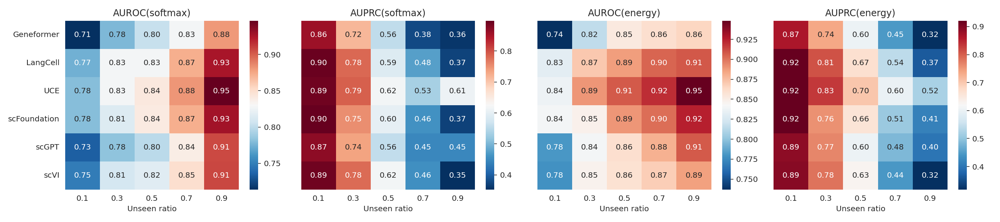

In [140]:
fig, axes = plt.subplots(1, 4, figsize=(18, 4), sharex=True, sharey=False)
for i, col in enumerate(["AUROC(softmax)", "AUPRC(softmax)", "AUROC(energy)", "AUPRC(energy)"]):
    heatmap_df = result_grouped.pivot(index="model", columns="unseen_ratio", values=col)
    sns.heatmap(heatmap_df, annot=True, cmap="RdBu_r", ax=axes[i], fmt='.2f')
    axes[i].set_ylabel("")
    axes[i].set_xlabel("Unseen ratio")
    axes[i].set_title(col)
    if i > 0:
        axes[i].set_yticklabels("")
plt.tight_layout()
plt.savefig("figures/cell_annotation/best_params_scVI_with_batchkey/novel_cells/tabula_confidence_iid_positive.png", dpi=300, bbox_inches='tight')

## Cross dataset label transfer

### Tabula to HLCA

In [170]:
source_dataset = "Tabula_Sapiens_all"
target_dataset = "HLCA_core"
output_folder = f"../OnClass/results_best_params/"
df_all = pd.DataFrame()
for model in ["scVI", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell"]:
    params = model_to_params[source_dataset][model]
    lr, l2 = float(params["lr"]), float(params["l2"])
    result_path = os.path.join(output_folder, model, "onclass_dot_product", 
                               source_dataset, f"lr_{lr}_l2_{l2}_testset_0.8/all_metrics_transfer_{target_dataset}.csv")
    df = pd.read_csv(result_path, index_col=0).iloc[:-2, :]
    df["model"] = model if model != "xTrimoGene" else "scFoundation"
    df_all = pd.concat([df_all, df])
df_all

,unseen_ratio,Accuracy@1,Macro F1,LCAD,model
iter,,,,,
0.0,0.0,0.6109,0.0842,2.9309,scVI
1.0,0.0,0.6060,0.0764,2.8358,scVI
2.0,0.0,0.6095,0.0807,2.9438,scVI
3.0,0.0,0.6202,0.0825,2.7777,scVI
4.0,0.0,0.6105,0.0801,2.9362,scVI
0.0,0.0,0.6650,0.0898,2.8003,Geneformer
1.0,0.0,0.6714,0.0897,2.4860,Geneformer
2.0,0.0,0.6595,0.0929,2.5097,Geneformer
3.0,0.0,0.6794,0.0776,2.4619,Geneformer


In [143]:
df_all["LCAD_rank"] = - df_all["LCAD"]
df_grouped = df_all.groupby("model").agg("mean")
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1", "LCAD_rank"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([ 0.66497263,  0.08659671, -2.5589799 ]), 'LangCell': array([ 0.65286571,  0.08026233, -2.79830363]), 'UCE': array([ 0.66933571,  0.08892166, -2.03479574]), 'scFoundation': array([ 0.67190901,  0.08318657, -2.17635071]), 'scGPT': array([ 0.67394331,  0.08148226, -2.46761235]), 'scVI': array([ 0.61143785,  0.08078325, -2.88487515])}
Front 1: ['UCE', 'scFoundation', 'scGPT']
Front 2: ['Geneformer']
Front 3: ['LangCell', 'scVI']


In [144]:
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.66497263, 0.08659671]), 'LangCell': array([0.65286571, 0.08026233]), 'UCE': array([0.66933571, 0.08892166]), 'scFoundation': array([0.67190901, 0.08318657]), 'scGPT': array([0.67394331, 0.08148226]), 'scVI': array([0.61143785, 0.08078325])}
Front 1: ['UCE', 'scFoundation', 'scGPT']
Front 2: ['Geneformer']
Front 3: ['LangCell', 'scVI']


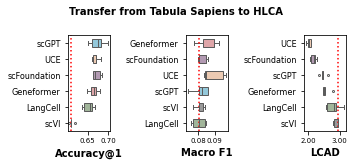

In [171]:
from matplotlib.ticker import FormatStrFormatter
def plot_violin(ax, x, y, data, hue, order, palette, xlabel, median_value):
    # sns.violinplot(x=x, y=y, data=data, hue=hue, width=0.5, alpha=0.8, ax=ax, order=order, palette=palette)
    sns.boxplot(x=x, y=y, data=data, hue=hue, width=0.5, ax=ax, order=order, palette=palette, 
                flierprops=dict(marker='o', color='black', markersize=2, linestyle='none'))
    ax.axvline(x=median_value, color='r', linestyle=':')
    ax.set_ylabel("")
    ax.tick_params(axis='y', labelsize=8)
    ax.tick_params(axis='x', labelsize=7)
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax.set_xlabel(xlabel, fontweight="bold")

def get_model_order(df, column, ascending=False):
    median_values = df.groupby('model')[column].median().sort_values(ascending=ascending)
    return median_values.index.tolist() 

cols = ["Accuracy@1", "Macro F1", "LCAD"]
fig, axes = plt.subplots(1, len(cols), figsize=(2*len(cols)-1, 2.3))

for i, col in enumerate(cols):
    model_order = get_model_order(df_all, col, ascending=True if col=="LCAD" else False)
    plot_violin(axes[i], col, 'model', df_all, 'model', model_order, custom_palette,
                col, df_all[df_all["model"] == "scVI"][col].median())
fig.suptitle("Transfer from Tabula Sapiens to HLCA", fontsize=10, fontweight='bold')
plt.tight_layout()
plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/tabula_to_hlca.png", dpi=300, bbox_inches='tight')

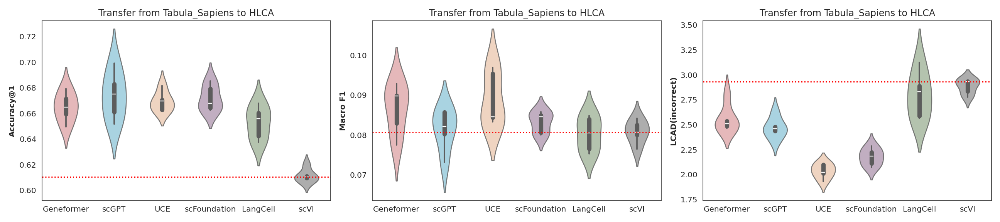

In [146]:
fig, axes = plt.subplots(1,3, figsize=(18,4))

sns.violinplot(df_all, x='model', y='Accuracy@1', hue="model", width=0.5, alpha=0.8, ax=axes[0],
               order=model_order_wo_hvg, palette=custom_palette)
axes[0].axhline(y=df_all[df_all["model"]=="scVI"]['Accuracy@1'].median(), color='r', linestyle=':')
axes[0].set_xlabel("")
axes[0].set_ylabel("Accuracy@1", fontweight="bold")
axes[0].set_title("Transfer from Tabula_Sapiens to HLCA")

sns.violinplot(df_all, x='model', y='Macro F1', hue="model", width=0.5, alpha=0.8, ax=axes[1],
               order=model_order_wo_hvg, palette=custom_palette)
axes[1].axhline(y=df_all[df_all["model"]=="scVI"]['Macro F1'].median(), color='r', linestyle=':')
axes[1].set_xlabel("")
axes[1].set_ylabel("Macro F1", fontweight="bold")
axes[1].set_title("Transfer from Tabula_Sapiens to HLCA")


sns.violinplot(df_all, x='model', y='LCAD', hue="model", width=0.5, alpha=0.8, ax=axes[2],
               order=model_order_wo_hvg, palette=custom_palette)
axes[2].axhline(y=df_all[df_all["model"]=="scVI"]['LCAD'].median(), color='r', linestyle=':')
axes[2].set_xlabel("")
axes[2].set_ylabel("LCAD(incorrect)", fontweight="bold")
axes[2].set_title("Transfer from Tabula_Sapiens to HLCA")

plt.tight_layout()
plt.savefig("figures/cell_annotation/best_params_scVI_with_batchkey/tabula_to_hlca.png", dpi=300, bbox_inches='tight')

### HLCA to Tabula

In [45]:
source_dataset = "HLCA_core"
target_dataset = "Tabula_Sapiens_all"
output_folder = f"../OnClass/results_best_params/"
df_all = pd.DataFrame()
for model in ["scVI", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell"]:
    params = model_to_params[source_dataset][model]
    lr, l2 = float(params["lr"]), float(params["l2"])
    result_path = os.path.join(output_folder, model, "onclass_dot_product", 
                               source_dataset, f"lr_{lr}_l2_{l2}_testset_0.8/all_metrics_transfer_{target_dataset}.csv")
    df = pd.read_csv(result_path, index_col=0).iloc[:-2, :]
    df["model"] = model if model != "xTrimoGene" else "scFoundation"
    df_all = pd.concat([df_all, df])
df_all

,unseen_ratio,Accuracy@1,Macro F1,LCAD,model
iter,,,,,
0.0,0.0,0.7898,0.2542,2.2402,scVI
1.0,0.0,0.7974,0.2595,2.1981,scVI
2.0,0.0,0.7949,0.2571,2.1939,scVI
3.0,0.0,0.7848,0.2503,2.2063,scVI
4.0,0.0,0.7853,0.2569,2.2667,scVI
0.0,0.0,0.7657,0.2299,2.3297,Geneformer
1.0,0.0,0.7767,0.2414,2.3964,Geneformer
2.0,0.0,0.7628,0.2386,2.3580,Geneformer
3.0,0.0,0.7778,0.2416,2.3968,Geneformer


In [46]:
df_all["LCAD_rank"] = - df_all["LCAD"]
df_grouped = df_all.groupby("model").agg("mean")
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1", "LCAD_rank"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([ 0.7722865 ,  0.23880406, -2.3562378 ]), 'LangCell': array([ 0.76565577,  0.24420721, -2.22432249]), 'UCE': array([ 0.82538845,  0.28266984, -2.24460473]), 'scFoundation': array([ 0.78202853,  0.25932158, -2.1753326 ]), 'scGPT': array([ 0.61433599,  0.20941044, -2.05724713]), 'scVI': array([ 0.79045266,  0.25559449, -2.22104297])}
Front 1: ['UCE', 'scFoundation', 'scGPT', 'scVI']
Front 2: ['Geneformer', 'LangCell']


In [47]:
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.7722865 , 0.23880406]), 'LangCell': array([0.76565577, 0.24420721]), 'UCE': array([0.82538845, 0.28266984]), 'scFoundation': array([0.78202853, 0.25932158]), 'scGPT': array([0.61433599, 0.20941044]), 'scVI': array([0.79045266, 0.25559449])}
Front 1: ['UCE']
Front 2: ['scFoundation', 'scVI']
Front 3: ['Geneformer', 'LangCell']
Front 4: ['scGPT']


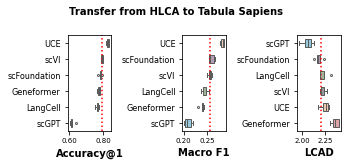

In [48]:
from matplotlib.ticker import FormatStrFormatter
def plot_violin(ax, x, y, data, hue, order, palette, xlabel, median_value):
    # sns.violinplot(x=x, y=y, data=data, hue=hue, width=0.5, alpha=0.8, ax=ax, order=order, palette=palette)
    sns.boxplot(x=x, y=y, data=data, hue=hue, width=0.5, ax=ax, order=order, palette=palette, 
                flierprops=dict(marker='o', color='black', markersize=2, linestyle='none'))
    ax.axvline(x=median_value, color='r', linestyle=':')
    ax.set_ylabel("")
    ax.tick_params(axis='y', labelsize=8)
    ax.tick_params(axis='x', labelsize=7)
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax.set_xlabel(xlabel, fontweight="bold")

def get_model_order(df, column, ascending=False):
    median_values = df.groupby('model')[column].median().sort_values(ascending=ascending)
    return median_values.index.tolist() 

cols = ["Accuracy@1", "Macro F1", "LCAD"]
fig, axes = plt.subplots(1, len(cols), figsize=(2*len(cols)-1, 2.3))

for i, col in enumerate(cols):
    model_order = get_model_order(df_all, col, ascending=True if col=="LCAD" else False)
    plot_violin(axes[i], col, 'model', df_all, 'model', model_order, custom_palette,
                col, df_all[df_all["model"] == "scVI"][col].median())
# plt.title("Transfer from HLCA to Tabula_Sapiens")
fig.suptitle("Transfer from HLCA to Tabula Sapiens", fontsize=10, fontweight='bold')
plt.tight_layout()
plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/hlca_to_tabula.png", dpi=300, bbox_inches='tight')

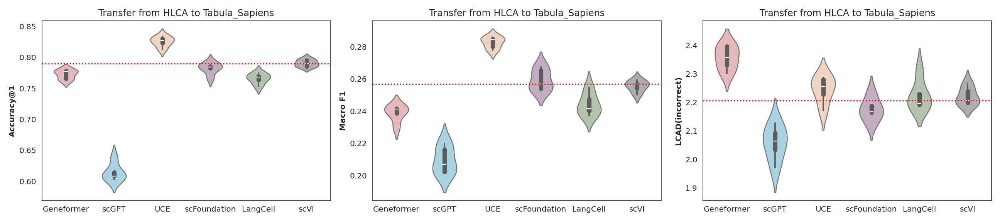

In [151]:
fig, axes = plt.subplots(1,3, figsize=(18,4))

sns.violinplot(df_all, x='model', y='Accuracy@1', hue="model", width=0.5, alpha=0.8, ax=axes[0],
               order=model_order_wo_hvg, palette=custom_palette)
axes[0].axhline(y=df_all[df_all["model"]=="scVI"]['Accuracy@1'].median(), color='r', linestyle=':')
axes[0].set_xlabel("")
axes[0].set_ylabel("Accuracy@1", fontweight="bold")
axes[0].set_title("Transfer from HLCA to Tabula_Sapiens")

sns.violinplot(df_all, x='model', y='Macro F1', hue="model", width=0.5, alpha=0.8, ax=axes[1],
               order=model_order_wo_hvg, palette=custom_palette)
axes[1].axhline(y=df_all[df_all["model"]=="scVI"]['Macro F1'].median(), color='r', linestyle=':')
axes[1].set_xlabel("")
axes[1].set_ylabel("Macro F1", fontweight="bold")
axes[1].set_title("Transfer from HLCA to Tabula_Sapiens")


sns.violinplot(df_all, x='model', y='LCAD', hue="model", width=0.5, alpha=0.8, ax=axes[2],
               order=model_order_wo_hvg, palette=custom_palette)
axes[2].axhline(y=df_all[df_all["model"]=="scVI"]['LCAD'].median(), color='r', linestyle=':')
axes[2].set_xlabel("")
axes[2].set_ylabel("LCAD(incorrect)", fontweight="bold")
axes[2].set_title("Transfer from HLCA to Tabula_Sapiens")

plt.tight_layout()
plt.savefig("figures/cell_annotation/best_params_scVI_with_batchkey/hlca_to_tabula.png", dpi=300, bbox_inches='tight')

#### cell type distribution

In [ ]:
target_labels = {'CL:0000860', 'CL:0002543', 'CL:0000875', 'CL:0000077', 'CL:0002062', 'CL:0000786', 'CL:0000186', 
                'CL:0002138', 'CL:0002063', 'CL:0000097', 'CL:0000158', 'CL:0002399', 'CL:0002144', 'CL:0000037'}
adata = sc.read("../data/datasets/Tabula_Sapiens_all.h5ad")
adata_selected = adata[adata.obs["cell_type_ontology_term_id"].isin(target_labels)]

In [15]:
hlca_adata = sc.read("../data/datasets/HLCA_core.h5ad")
hlca_adata_selected = hlca_adata[hlca_adata.obs["cell_type_ontology_term_id"].isin(target_labels)]

In [16]:
adata_selected.obs["cell_type_ontology_term_id"].value_counts()

cell_type_ontology_term_id
CL:0000860    13387
CL:0000786    11545
CL:0002063     9146
CL:0002144     5089
CL:0002543     3379
CL:0000186     3070
CL:0000097     2238
CL:0000158     2116
CL:0002138     1052
CL:0000875     1044
CL:0000037      794
CL:0002399      306
CL:0002062      211
CL:0000077       41
Name: count, dtype: int64

In [ ]:
hlca_adata_selected.obs["cell_type_ontology_term_id"].value_counts()

cell_type_ontology_term_id
CL:0002063    62405
CL:0000158    36023
CL:0002144    23205
CL:0000860    17695
CL:0002543    12975
CL:0002399     9133
CL:0000875     8834
CL:0002062     7937
CL:0000097     6623
CL:0002138     4595
CL:0000786     1773
CL:0000186      716
CL:0000077      230
CL:0000037       60
Name: count, dtype: int64

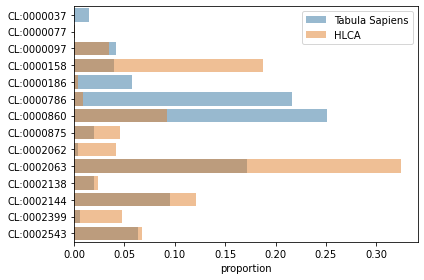

In [26]:
sns.barplot(adata_selected.obs["cell_type_ontology_term_id"].value_counts(normalize=True), alpha=0.5, orient="h", label="Tabula Sapiens")
sns.barplot(hlca_adata_selected.obs["cell_type_ontology_term_id"].value_counts(normalize=True), alpha=0.5, orient="h", label="HLCA")
plt.legend()
plt.ylabel("")
plt.tight_layout()
plt.savefig("../figures/cell_annotation/overlap_category_distribution.png",dpi=300, bbox_inches='tight')

#### Tissue-specific performance

In [8]:
target_labels = {'CL:0000860', 'CL:0002543', 'CL:0000875', 'CL:0000077', 'CL:0002062', 'CL:0000786', 'CL:0000186', 
                'CL:0002138', 'CL:0002063', 'CL:0000097', 'CL:0000158', 'CL:0002399', 'CL:0002144', 'CL:0000037'}
# read adata
adata = sc.read("../data/datasets/Tabula_Sapiens_all.h5ad")

# select the subset with the target labels
adata_selected = adata[adata.obs["cell_type_ontology_term_id"].isin(target_labels)]

# report the tissue-specific accuracy
tissue = adata_selected.obs["tissue_in_publication"].to_list()

In [ ]:
value_counts = adata_selected.obs["tissue_in_publication"].value_counts().reset_index()
fig = px.pie(
    value_counts,
    names="tissue_in_publication",
    values="count"
)

In [47]:
fig.show()

In [11]:
source_dataset = "HLCA_core"
target_dataset = "Tabula_Sapiens_all"
output_folder = f"../OnClass/results_best_params/"
df_all = pd.DataFrame()
for model in ["scVI", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell"]:
    df_model = pd.DataFrame()
    params = model_to_params[source_dataset][model]
    lr, l2 = float(params["lr"]), float(params["l2"])
    for iter in range(5):
        result_path = os.path.join(output_folder, model, "onclass_dot_product", 
                                   source_dataset, f"lr_{lr}_l2_{l2}_testset_0.8/{iter}/0/{target_dataset}/pred_label.csv")
        df = pd.read_csv(result_path)
        df["tissue"] = tissue
        df["iter"] = iter
        df_model = pd.concat([df_model, df], axis=0)
    accuracy_per_tissue = df_model.groupby(['tissue', 'iter']).apply(lambda x: (x['y_true'] == x['y_pred']).mean())
    accuracy_per_tissue = accuracy_per_tissue.groupby(['tissue']).agg("mean").reset_index().rename(columns={0: 'Accuracy'})
    accuracy_per_tissue["model"] = model if model != "xTrimoGene" else "scFoundation"
    df_all = pd.concat([df_all, accuracy_per_tissue], axis=0)
df_all

,tissue,Accuracy,model
0,Bladder,0.517811,scVI
1,Blood,0.970966,scVI
2,Bone_Marrow,0.797781,scVI
3,Eye,0.937255,scVI
4,Fat,0.027668,scVI
...,...,...,...
17,Thymus,0.775536,LangCell
18,Tongue,0.704043,LangCell
19,Trachea,0.958454,LangCell
20,Uterus,0.244186,LangCell


In [12]:
df_all = df_all.reset_index(drop=True)
df_max_acc = df_all.loc[df_all.groupby('tissue')['Accuracy'].idxmax()].reset_index(drop=True)
df_max_acc.model.value_counts()

model
UCE             12
scVI             4
scFoundation     3
scGPT            2
Geneformer       1
Name: count, dtype: int64

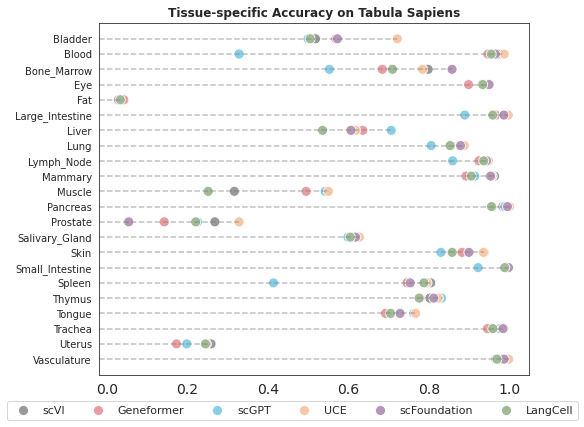

In [32]:
sns.set_style('white')
plt.figure(figsize=(8,6))
# pal = sns.color_palette("husl", 6)  
scatter = sns.scatterplot(df_all, y="tissue", x="Accuracy", hue="model", s=100, palette=custom_palette)
yticklabels = scatter.get_yticklabels()
max_values = df_all.groupby('tissue')['Accuracy'].max()
xlim = scatter.get_xlim()
ax = plt.gca()
for i, label in enumerate(scatter.get_yticklabels()):
    dataset = label.get_text()
    ax.axhline(y=i, xmin=0, xmax=(max_values[dataset] - xlim[0])/(xlim[1] - xlim[0]), color='gray', linestyle='--', alpha=0.5)
    # print(dataset, max_values[dataset])

# plt.xticks(rotation=90)
plt.xlabel("")
plt.ylabel("")
plt.legend(ncol=6, loc="center", bbox_to_anchor=(.45,-0.1), fontsize=11)
plt.xticks(fontsize=14)
plt.title("Tissue-specific Accuracy on Tabula Sapiens", fontweight="bold", fontsize=12)
plt.tight_layout()
plt.savefig("../figures/cell_annotation/best_params_scVI_with_batchkey/hlca_to_tabula_tissue_acc.png", dpi=300, bbox_inches='tight')

## Model complementary

1. Dataset: Tabula_Sapiens_all
2. Setting: 20% training, 80% test, unseen_ratio=0
3. Plot: Heatmaps representing performance of pairwise model combinations in terms of Accuracy@1 or Macro F1

### Tabula to HLCA

In [20]:
source_dataset = "Tabula_Sapiens_all"
target_dataset = "HLCA_core"
combinations = pd.read_csv(f"../figures/model_complement_transfer_{source_dataset}_to_{target_dataset}.csv")
combinations.head()

,iter,model1,model2,Accuracy@1,Macro F1
0,0,Geneformer,scGPT,0.739735,0.121073
1,0,Geneformer,UCE,0.718731,0.119384
2,0,Geneformer,LangCell,0.712160,0.101890
3,0,Geneformer,scFoundation,0.700927,0.117296
4,0,scGPT,UCE,0.738382,0.135777


In [21]:
output_folder = f"../OnClass/results_best_params/"
single_model_result = []
single_model_acc = defaultdict(list)
single_model_f1 = defaultdict(list)
for model in ["Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell"]:
	params = model_to_params[source_dataset][model]
	lr, l2 = float(params["lr"]), float(params["l2"])
	result_path = os.path.join(output_folder, model, "onclass_dot_product", 
								source_dataset, f"lr_{lr}_l2_{l2}_testset_0.8/all_metrics_transfer_{target_dataset}.csv")
	df = pd.read_csv(result_path)
	model = model if model != "xTrimoGene" else "scFoundation"
	for iter in range(5):
		single_model_result.append(
			{
				"iter": iter,
				"model1": model,
				"model2": model,
				"Accuracy@1": df["Accuracy@1"].values[iter],
				"Macro F1": df["Macro F1"].values[iter],
			}
		)
		single_model_acc[model].append(df["Accuracy@1"].values[iter])
		single_model_f1[model].append(df["Macro F1"].values[iter])
single_model_result = pd.DataFrame.from_dict(single_model_result)

In [22]:
result = pd.concat([combinations, single_model_result],axis=0)
result_grouped = result.groupby(["model1", "model2"]).agg("mean").reset_index()
result_grouped

,model1,model2,iter,Accuracy@1,Macro F1
0,Geneformer,Geneformer,2.0,0.664973,0.086597
1,Geneformer,LangCell,2.0,0.713289,0.111455
2,Geneformer,UCE,2.0,0.714510,0.116603
3,Geneformer,scFoundation,2.0,0.706409,0.116749
4,Geneformer,scGPT,2.0,0.737971,0.114872
5,LangCell,LangCell,2.0,0.652866,0.080262
6,LangCell,scFoundation,2.0,0.707931,0.111494
7,UCE,LangCell,2.0,0.713011,0.110840
8,UCE,UCE,2.0,0.669336,0.088922
9,UCE,scFoundation,2.0,0.703438,0.112137


In [23]:
result_grouped["acc_improve"] = result_grouped.apply(lambda x: x["Accuracy@1"]-max(np.mean(single_model_acc[x["model1"]]), np.mean(single_model_acc[x["model2"]])), axis=1)
result_grouped["f1_improve"] = result_grouped.apply(lambda x: x["Macro F1"]-max(np.mean(single_model_f1[x["model1"]]), np.mean(single_model_f1[x["model2"]])), axis=1)
result_grouped

,model1,model2,iter,Accuracy@1,Macro F1,acc_improve,f1_improve
0,Geneformer,Geneformer,2.0,0.664973,0.086597,0.000000e+00,0.000000e+00
1,Geneformer,LangCell,2.0,0.713289,0.111455,4.831637e-02,2.485789e-02
2,Geneformer,UCE,2.0,0.714510,0.116603,4.517388e-02,2.768129e-02
3,Geneformer,scFoundation,2.0,0.706409,0.116749,3.449980e-02,3.015218e-02
4,Geneformer,scGPT,2.0,0.737971,0.114872,6.402780e-02,2.827528e-02
5,LangCell,LangCell,2.0,0.652866,0.080262,0.000000e+00,0.000000e+00
6,LangCell,scFoundation,2.0,0.707931,0.111494,3.602214e-02,2.830712e-02
7,UCE,LangCell,2.0,0.713011,0.110840,4.367547e-02,2.191847e-02
8,UCE,UCE,2.0,0.669336,0.088922,0.000000e+00,0.000000e+00
9,UCE,scFoundation,2.0,0.703438,0.112137,3.152900e-02,2.321552e-02


In [24]:
heatmap_df = result_grouped.pivot(index="model1", columns="model2", values="Accuracy@1")
for i, row in enumerate(heatmap_df.index):
    for j, col in enumerate(heatmap_df.columns):
        if i < j:  
            try:
                heatmap_df.loc[row, col] = result_grouped[(result_grouped["model1"]==row)&(result_grouped["model2"]==col)]["Accuracy@1"].values[0]
            except:
                heatmap_df.loc[row, col] = result_grouped[(result_grouped["model1"]==col)&(result_grouped["model2"]==row)]["Accuracy@1"].values[0]
        elif i > j:
            try:
                heatmap_df.loc[row, col] = result_grouped[(result_grouped["model1"]==row)&(result_grouped["model2"]==col)]["acc_improve"].values[0]
            except:
                heatmap_df.loc[row, col] = result_grouped[(result_grouped["model1"]==col)&(result_grouped["model2"]==row)]["acc_improve"].values[0]
        else:
            heatmap_df.loc[row, col] = result_grouped[(result_grouped["model1"]==row)&(result_grouped["model2"]==row)]["Accuracy@1"].values[0]
heatmap_df = heatmap_df.astype(float)
heatmap_df

model2,Geneformer,LangCell,UCE,scFoundation,scGPT
model1,,,,,
Geneformer,0.664973,0.713289,0.714510,0.706409,0.737971
LangCell,0.048316,0.652866,0.713011,0.707931,0.719170
UCE,0.045174,0.043675,0.669336,0.703438,0.725341
scFoundation,0.034500,0.036022,0.031529,0.671909,0.718377
scGPT,0.064028,0.045227,0.051397,0.044434,0.673943


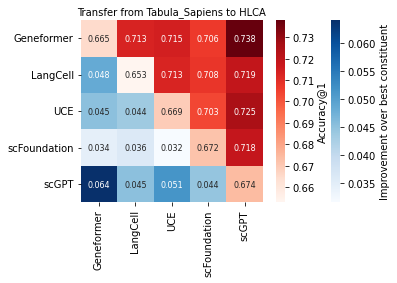

In [25]:
data = heatmap_df.values
mask_upper = np.triu(np.ones_like(data, dtype=bool))
mask_lower = np.tril(np.ones_like(data, dtype=bool),k=-1)

ax1 = sns.heatmap(data, mask=mask_upper, cmap='Blues', annot=True, annot_kws={"fontsize": 8}, fmt=".3f", 
            cbar_kws={'label': "Improvement over best constituent"}, square=True)
ax2 = sns.heatmap(data, mask=mask_lower, cmap='Reds', annot=True, annot_kws={"fontsize": 8}, fmt=".3f", 
                  xticklabels=heatmap_df.index, yticklabels=heatmap_df.index,
                  cbar_kws={'label': "Accuracy@1"}, square=True)
plt.title("Transfer from Tabula_Sapiens to HLCA", fontsize=10)
plt.tight_layout()
plt.savefig("figures/cell_annotation/best_params_scVI_with_batchkey/tabula_to_hlca_complement.png", dpi=300, bbox_inches='tight')

### HLCA to Tabula

In [26]:
source_dataset = "HLCA_core"
target_dataset = "Tabula_Sapiens_all"
combinations = pd.read_csv(f"../figures/model_complement_transfer_{source_dataset}_to_{target_dataset}.csv")
combinations.head()

,iter,model1,model2,Accuracy@1,Macro F1
0,0,Geneformer,scGPT,0.769067,0.244215
1,0,Geneformer,UCE,0.808754,0.267021
2,0,Geneformer,LangCell,0.776105,0.245716
3,0,Geneformer,scFoundation,0.786383,0.252900
4,0,scGPT,UCE,0.800348,0.266207


In [27]:
output_folder = f"../OnClass/results_best_params/"
single_model_result = []
single_model_acc = defaultdict(list)
single_model_f1 = defaultdict(list)
for model in ["Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell"]:
	params = model_to_params[source_dataset][model]
	lr, l2 = float(params["lr"]), float(params["l2"])
	result_path = os.path.join(output_folder, model, "onclass_dot_product", source_dataset, f"lr_{lr}_l2_{l2}_testset_0.8/all_metrics_transfer_{target_dataset}.csv")
	df = pd.read_csv(result_path)
	model = model if model != "xTrimoGene" else "scFoundation"
	for iter in range(5):
		single_model_result.append(
			{
				"iter": iter,
				"model1": model,
				"model2": model,
				"Accuracy@1": df["Accuracy@1"].values[iter],
				"Macro F1": df["Macro F1"].values[iter],
			}
		)
		single_model_acc[model].append(df["Accuracy@1"].values[iter])
		single_model_f1[model].append(df["Macro F1"].values[iter])
single_model_result = pd.DataFrame.from_dict(single_model_result)

In [28]:
result = pd.concat([combinations, single_model_result],axis=0)
result_grouped = result.groupby(["model1", "model2"]).agg("mean").reset_index()
result_grouped

,model1,model2,iter,Accuracy@1,Macro F1
0,Geneformer,Geneformer,2.0,0.772286,0.238804
1,Geneformer,LangCell,2.0,0.785589,0.251869
2,Geneformer,UCE,2.0,0.820109,0.274316
3,Geneformer,scFoundation,2.0,0.796855,0.261226
4,Geneformer,scGPT,2.0,0.768685,0.252435
5,LangCell,LangCell,2.0,0.765656,0.244207
6,LangCell,scFoundation,2.0,0.790352,0.265613
7,UCE,LangCell,2.0,0.808001,0.275112
8,UCE,UCE,2.0,0.825388,0.282670
9,UCE,scFoundation,2.0,0.808888,0.274636


In [29]:
result_grouped["acc_improve"] = result_grouped.apply(lambda x: x["Accuracy@1"]-max(np.mean(single_model_acc[x["model1"]]), np.mean(single_model_acc[x["model2"]])), axis=1)
result_grouped["f1_improve"] = result_grouped.apply(lambda x: x["Macro F1"]-max(np.mean(single_model_f1[x["model1"]]), np.mean(single_model_f1[x["model2"]])), axis=1)
result_grouped

,model1,model2,iter,Accuracy@1,Macro F1,acc_improve,f1_improve
0,Geneformer,Geneformer,2.0,0.772286,0.238804,0.000000e+00,0.000000e+00
1,Geneformer,LangCell,2.0,0.785589,0.251869,1.330263e-02,7.662081e-03
2,Geneformer,UCE,2.0,0.820109,0.274316,-5.279119e-03,-8.354108e-03
3,Geneformer,scFoundation,2.0,0.796855,0.261226,1.482646e-02,1.904783e-03
4,Geneformer,scGPT,2.0,0.768685,0.252435,-3.601782e-03,1.363046e-02
5,LangCell,LangCell,2.0,0.765656,0.244207,0.000000e+00,-5.551115e-17
6,LangCell,scFoundation,2.0,0.790352,0.265613,8.323037e-03,6.291671e-03
7,UCE,LangCell,2.0,0.808001,0.275112,-1.738740e-02,-7.558234e-03
8,UCE,UCE,2.0,0.825388,0.282670,-2.220446e-16,0.000000e+00
9,UCE,scFoundation,2.0,0.808888,0.274636,-1.650006e-02,-8.034318e-03


In [30]:
heatmap_df = result_grouped.pivot(index="model1", columns="model2", values="Accuracy@1")
for i, row in enumerate(heatmap_df.index):
    for j, col in enumerate(heatmap_df.columns):
        if i < j:  
            try:
                heatmap_df.loc[row, col] = result_grouped[(result_grouped["model1"]==row)&(result_grouped["model2"]==col)]["Accuracy@1"].values[0]
            except:
                heatmap_df.loc[row, col] = result_grouped[(result_grouped["model1"]==col)&(result_grouped["model2"]==row)]["Accuracy@1"].values[0]
        elif i > j:
            try:
                heatmap_df.loc[row, col] = result_grouped[(result_grouped["model1"]==row)&(result_grouped["model2"]==col)]["acc_improve"].values[0]
            except:
                heatmap_df.loc[row, col] = result_grouped[(result_grouped["model1"]==col)&(result_grouped["model2"]==row)]["acc_improve"].values[0]
        else:
            heatmap_df.loc[row, col] = result_grouped[(result_grouped["model1"]==row)&(result_grouped["model2"]==row)]["Accuracy@1"].values[0]
heatmap_df = heatmap_df.astype(float)
heatmap_df

model2,Geneformer,LangCell,UCE,scFoundation,scGPT
model1,,,,,
Geneformer,0.772286,0.785589,0.820109,0.796855,0.768685
LangCell,0.013303,0.765656,0.808001,0.790352,0.768707
UCE,-0.005279,-0.017387,0.825388,0.808888,0.802224
scFoundation,0.014826,0.008323,-0.016500,0.782029,0.774859
scGPT,-0.003602,0.003051,-0.023164,-0.007170,0.614336


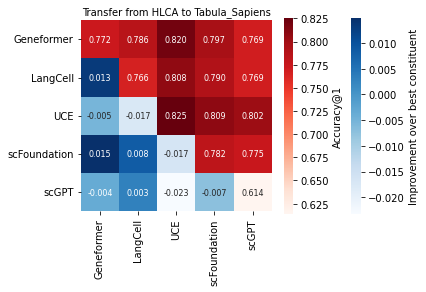

In [31]:
data = heatmap_df.values
mask_upper = np.triu(np.ones_like(data, dtype=bool))
mask_lower = np.tril(np.ones_like(data, dtype=bool),k=-1)

ax1 = sns.heatmap(data, mask=mask_upper, cmap='Blues', annot=True, annot_kws={"fontsize": 8}, fmt=".3f", 
            cbar_kws={'label': "Improvement over best constituent", "pad":0.1}, square=True)
ax2 = sns.heatmap(data, mask=mask_lower, cmap='Reds', annot=True, annot_kws={"fontsize": 8}, fmt=".3f", 
                  xticklabels=heatmap_df.index, yticklabels=heatmap_df.index,
                  cbar_kws={'label': "Accuracy@1"}, square=True)
plt.title("Transfer from HLCA to Tabula_Sapiens", fontsize=10)
plt.tight_layout()
plt.savefig("figures/cell_annotation/best_params_scVI_with_batchkey/hlca_to_tabula_complement.png", dpi=300, bbox_inches='tight')

# CancerFinder (leave-one-tissue-out)

## AUROC/AURPC

In [129]:
model_list = ["X", "scVI", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell"]
tissue_list = ["Blood", "Brain", "Bone", "Eye"]

scVI_model_list = ["scVI_integrated_Patient", "scVI_integrated_dataset", 
                   "scVI_integrated_tumor", "scVI_integrated_tissue"]

### Compare scVI with different batch_key (default parameters)

In [11]:
result_dir = "../SequencingCancerFinder/optuna_results"
df_all = pd.DataFrame()
for tissue in tissue_list:
    df = pd.DataFrame()
    auroc_ls, auprc_ls = [], []
    batchkey_ls = []
    for model in scVI_model_list:
        optuna_results = pd.read_csv(os.path.join(result_dir, model, "optuna_all_trials.csv"))
        bs, dropout, lr, decay = optuna_results.loc[optuna_results["value"].idxmax(), :][1:]
        with open(os.path.join(result_dir, model, f"bs_{int(bs)}_lr_{lr}_drop_{dropout:.2f}_decay_{decay}", tissue, "train_log_val.txt")) as f:
            res = f.readlines()[-2:]
            auroc, auprc = res[0].strip().split(": ")[1], res[1].strip().split(": ")[1]
            auroc_ls.append(float(auroc))
            auprc_ls.append(float(auprc))
            batchkey_ls.append(model.split("_")[-1])
    df["Batch_key"] = batchkey_ls
    df["AUROC"] = auroc_ls
    df["AUPRC"] = auprc_ls
    df["Tissue"] = tissue
    df_all = pd.concat([df_all, df], axis=0)
df_all

,Batch_key,AUROC,AUPRC,Tissue
0,Patient,0.7335,0.6256,Blood
1,dataset,0.7258,0.6557,Blood
2,tumor,0.7060,0.6347,Blood
3,tissue,0.7623,0.6918,Blood
0,Patient,0.7633,0.8951,Brain
1,dataset,0.7883,0.8836,Brain
2,tumor,0.6718,0.8583,Brain
3,tissue,0.7370,0.8981,Brain
0,Patient,0.7078,0.8071,Bone
1,dataset,0.7758,0.8624,Bone


In [47]:
# the best batch key on average is "tissue"
df_all.groupby(["Batch_key"])[["AUROC", "AUPRC"]].agg("mean")

,AUROC,AUPRC
Batch_key,,
Patient,0.793325,0.829125
dataset,0.813600,0.847300
tissue,0.811225,0.859750
tumor,0.748400,0.809850


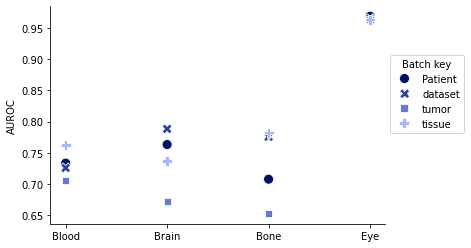

In [51]:
colors = ["#001360", "#28439c", "#647ad4", "#a5b7ff"]
sns.scatterplot(df_all, x="Tissue", y="AUROC", style="Batch_key", hue="Batch_key", s=100, 
                palette=colors)
# sns.stripplot(df_all, x="Tissue", y="AUROC", hue="Batch_key", s=10, 
#               palette="Blues")   
sns.despine(top=True, right=True, left=False, bottom=False)
ax = plt.gca()
ax.legend(loc="upper left", ncol=1, frameon=True, bbox_to_anchor=(1, 0.8), title="Batch key")
plt.xlabel("")
plt.savefig("../figures/cancer_finder/scvi_batchkey_auroc.png", dpi=300, bbox_inches='tight')

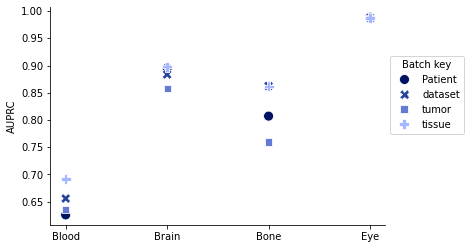

In [52]:
colors = ["#001360", "#28439c", "#647ad4", "#a5b7ff"]
sns.scatterplot(df_all, x="Tissue", y="AUPRC", style="Batch_key", hue="Batch_key", s=100, 
                palette=colors)
sns.despine(top=True, right=True, left=False, bottom=False)
ax = plt.gca()
ax.legend(loc="upper left", ncol=1, frameon=True, bbox_to_anchor=(1, 0.8), title="Batch key")
plt.xlabel("")
plt.savefig("../figures/cancer_finder/scvi_batchkey_auprc.png", dpi=300, bbox_inches='tight')

### Plot relative improvement to raw counts

In [53]:
# load optimized results
result_dir = "../SequencingCancerFinder/optuna_results"
df_all = pd.DataFrame()
model_list = ["X", "scVI_integrated_tissue", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell"]
for tissue in tissue_list:
    df = pd.DataFrame()
    auroc_ls, auprc_ls = [], []
    model_ls = []
    for model in model_list:
        optuna_results = pd.read_csv(os.path.join(result_dir, model, "optuna_all_trials.csv"))
        bs, dropout, lr, decay = optuna_results.loc[optuna_results["value"].idxmax(), :][1:]
        with open(os.path.join(result_dir, model, f"bs_{int(bs)}_lr_{lr}_drop_{dropout:.2f}_decay_{decay}", tissue, "train_log_val.txt")) as f:
            res = f.readlines()[-2:]
            auroc, auprc = res[0].strip().split(": ")[1], res[1].strip().split(": ")[1]
            if model == "X":  
                auroc_base, auprc_base = float(auroc), float(auprc)
            else:
                auroc_ls.append(float(auroc)-auroc_base)
                auprc_ls.append(float(auprc)-auprc_base)
                model_ls.append(model_map_dict.get(model, model))
    df["Model"] = model_ls
    df["AUROC"] = auroc_ls
    df["AUPRC"] = auprc_ls
    df["Tissue"] = tissue
    df_all = pd.concat([df_all, df], axis=0)
df_all

,Model,AUROC,AUPRC,Tissue
0,scVI,0.1681,0.1899,Blood
1,Geneformer,0.0925,0.0599,Blood
2,scGPT,0.2069,0.2290,Blood
3,UCE,0.1525,0.1444,Blood
4,scFoundation,0.0011,-0.0352,Blood
5,LangCell,0.1021,0.0892,Blood
0,scVI,-0.1209,-0.0565,Brain
1,Geneformer,-0.1027,-0.0416,Brain
2,scGPT,-0.1206,-0.0685,Brain
3,UCE,0.0659,0.0247,Brain


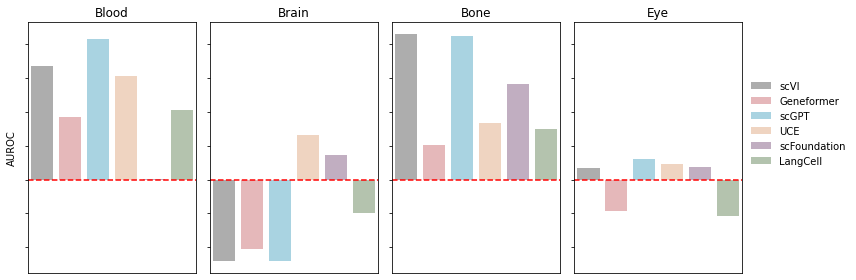

In [64]:
fig, axes = plt.subplots(1, 4, figsize=(12, 4), sharex=False, sharey=True)
for i, tissue in enumerate(tissue_list):
    df = df_all[df_all["Tissue"]==tissue]
    if i == len(tissue_list) - 1: 
        sns.barplot(data=df, x="Model", y="AUROC", hue="Model", ax=axes[i], 
                    alpha=0.8, palette=custom_palette, legend="brief")
    else:
        sns.barplot(data=df, x="Model", y="AUROC", hue="Model", ax=axes[i], 
                    alpha=0.8, palette=custom_palette)
    if i != 0:
        axes[i].set_yticklabels([])
    axes[i].set_xlabel("")
    axes[i].set_xticklabels([])
    axes[i].tick_params(axis='x', which='both', length=0)
    axes[i].set_title(tissue)
    axes[i].axhline(y=0, color='red', ls="--")
axes[-1].legend(loc='upper left', bbox_to_anchor=(1, 0.8), ncol=1, title=None, frameon=False, fontsize=10)
plt.tight_layout()
# plt.savefig("../figures/cancer_finder/auroc_all.png", dpi=300, bbox_inches='tight')

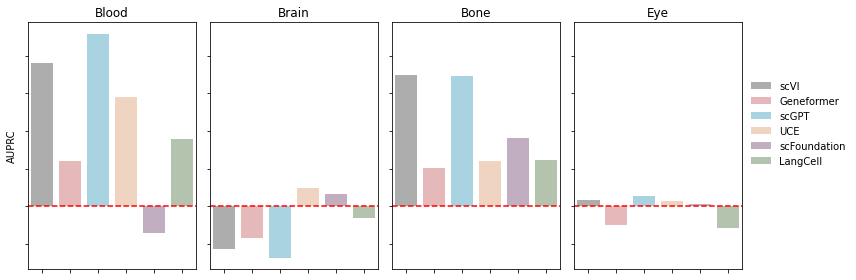

In [65]:
fig, axes = plt.subplots(1, 4, figsize=(12, 4), sharex=False, sharey=False)
for i, tissue in enumerate(tissue_list):
    df = df_all[df_all["Tissue"]==tissue]
    if i == len(tissue_list) - 1: 
        sns.barplot(data=df, x="AUPRC", y="Model", hue="Model", ax=axes[i], 
                    alpha=0.8, palette=custom_palette, legend="brief", orient="h")
    else:
        sns.barplot(data=df, x="AUPRC", y="Model", hue="Model", ax=axes[i], 
                    alpha=0.8, palette=custom_palette, orient="h")
    if i != 0:
        axes[i].set_yticklabels([])
    axes[i].set_ylabel("")
    axes[i].set_title(tissue)
    # axes[i].set_xlim(-0.25,0.25)
    axes[i].axvline(x=0, color='red', ls="--")
axes[-1].legend(loc='upper left', bbox_to_anchor=(1, 0.8), ncol=1, title=None, frameon=False, fontsize=10)
# plt.savefig("../figures/cancer_finder/auprc_all.png", dpi=300, bbox_inches='tight')

### Absolute metrics

In [15]:
# load optimized results
result_dir = "../SequencingCancerFinder/optuna_results"
df_all = pd.DataFrame()
model_list = ["X", "scVI_integrated_tissue", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell"]
for t_id, tissue in enumerate(tissue_list):
    df = pd.DataFrame()
    auroc_ls, auprc_ls = [], []
    model_ls = []
    for model in model_list:
        optuna_results = pd.read_csv(os.path.join(result_dir, model, "optuna_all_trials.csv"))
        bs, dropout, lr, decay = optuna_results.loc[optuna_results["value"].idxmax(), :][1:]
        if t_id == 0:
            print(f"Best params for model {model}:", bs, dropout, lr, decay)
        with open(os.path.join(result_dir, model, f"bs_{int(bs)}_lr_{lr}_drop_{dropout:.2f}_decay_{decay}", tissue, "train_log_val.txt")) as f:
            res = f.readlines()[-2:]
            auroc, auprc = res[0].strip().split(": ")[1], res[1].strip().split(": ")[1]
            auroc_ls.append(float(auroc))
            auprc_ls.append(float(auprc))
            model_ls.append(model_map_dict.get(model, model))
    df["Model"] = model_ls
    df["AUROC"] = auroc_ls
    df["AUPRC"] = auprc_ls
    df["Tissue"] = tissue
    df_all = pd.concat([df_all, df], axis=0)
df_all = df_all.reset_index(drop=True)
df_all

Best params for model X: 256.0 0.25 0.005 1e-06
Best params for model scVI_integrated_tissue: 128.0 0.1 0.005 1e-05
Best params for model Geneformer: 128.0 0.1 0.005 1e-05
Best params for model scGPT: 128.0 0.25 0.001 1e-05
Best params for model UCE: 128.0 0.1 0.005 1e-06
Best params for model xTrimoGene: 256.0 0.1 0.005 1e-05
Best params for model LangCell: 256.0 0.1 0.005 1e-05


,Model,AUROC,AUPRC,Tissue
0,Raw,0.5942,0.5019,Blood
1,scVI,0.7623,0.6918,Blood
2,Geneformer,0.6867,0.5618,Blood
3,scGPT,0.8011,0.7309,Blood
4,UCE,0.7467,0.6463,Blood
5,scFoundation,0.5953,0.4667,Blood
6,LangCell,0.6963,0.5911,Blood
7,Raw,0.8579,0.9546,Brain
8,scVI,0.7370,0.8981,Brain
9,Geneformer,0.7552,0.9130,Brain


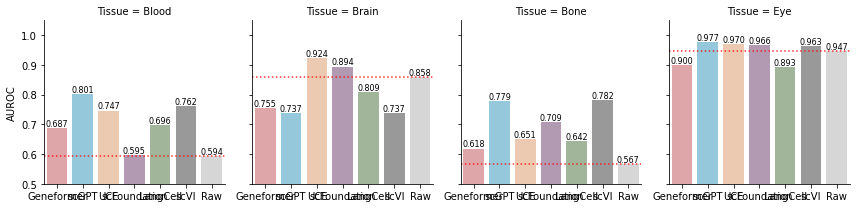

In [13]:
grid = sns.FacetGrid(df_all, col="Tissue")
# grid.map(sns.barplot, "Model", "AUROC", data=df_all, hue="Model", 
#          palette=custom_palette, order=model_order_wo_hvg+["Raw"])

def barplot_with_text(data, **kwargs):
    order = model_order_wo_hvg + ["Raw"]
    sns.barplot(data=data, x="Model", y="AUROC", hue="Model", palette=custom_palette, order=order)
    for index, model in enumerate(order):
        if model in data["Model"].values:
            value = data.set_index("Model").loc[model, "AUROC"]
            plt.text(index, value, f'{value:.3f}', ha='center', va='bottom', fontsize=8)
    plt.axhline(y=data.set_index("Model").loc["Raw", "AUROC"], color="red", linestyle=':', alpha=0.8)
grid.map_dataframe(barplot_with_text) # map_datafrmae：不需要传递data参数
grid.set_axis_labels('', "AUROC")
# grid.set_xticklabels([])
plt.ylim(0.5,1.05)
# plt.legend(loc='upper left', bbox_to_anchor=(1, 0.8), ncol=1, title=None, frameon=False, fontsize=10)
plt.tight_layout()
# plt.savefig("../figures/cancer_finder/auroc_all_absolute.png", 
#             dpi=300, bbox_inches='tight')

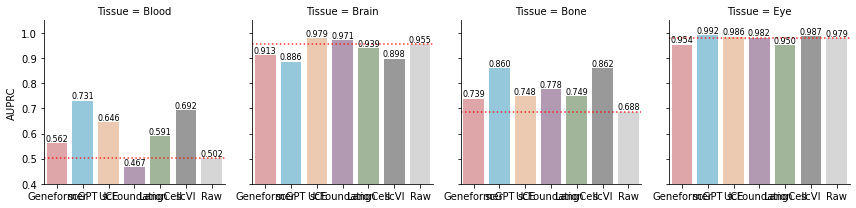

In [ ]:
grid = sns.FacetGrid(df_all, col="Tissue")

def barplot_with_text(data, **kwargs):
    order = model_order_wo_hvg + ["Raw"]
    sns.barplot(data=data, x="Model", y="AUPRC", hue="Model", palette=custom_palette, order=order)
    for index, model in enumerate(order):
        if model in data["Model"].values:
            value = data.set_index("Model").loc[model, "AUPRC"]
            plt.text(index, value, f'{value:.3f}', ha='center', va='bottom', fontsize=8)
    plt.axhline(y=data.set_index("Model").loc["Raw", "AUPRC"], color="red", linestyle=':', alpha=0.8)
grid.map_dataframe(barplot_with_text) # map_datafrmae：不需要传递data参数
grid.set_axis_labels('', "AUPRC")
# grid.set_xticklabels([])
plt.ylim(0.4,1.05)
# plt.legend(loc='upper left', bbox_to_anchor=(1, 0.8), ncol=1, title=None, frameon=False, fontsize=10)
plt.tight_layout()
# plt.savefig("../figures/cancer_finder/auprc_all_absolute.png", 
#             dpi=300, bbox_inches='tight')

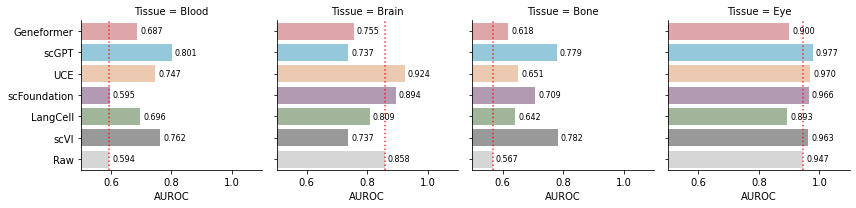

In [17]:
grid = sns.FacetGrid(df_all, col="Tissue")
# grid.map(sns.barplot, "Model", "AUPRC", data=df_all, hue="Model", 
#          palette=custom_palette, order=model_order_wo_hvg+["Raw"])

def barplot_with_text(data, **kwargs):
    order = model_order_wo_hvg + ["Raw"] 
    sns.barplot(data=data, x="AUROC", y="Model", hue="Model", palette=custom_palette, order=order, orient="h")
    for index, model in enumerate(order):
        if model in data["Model"].values:
            value = data.set_index("Model").loc[model, "AUROC"]
            plt.text(value+0.01, index, f'{value:.3f}', ha='left', va='center', fontsize=8)
    plt.axvline(x=data.set_index("Model").loc["Raw", "AUROC"], color="red", linestyle=':', alpha=0.8)
grid.map_dataframe(barplot_with_text) # map_datafrmae：不需要传递data参数
grid.set_axis_labels('AUROC', "")
# grid.set_xticklabels([])
plt.xlim(0.5,1.1)
plt.tight_layout()
plt.savefig("../figures/cancer_finder/auroc_all_absolute_orienth.png", 
            dpi=300, bbox_inches='tight')

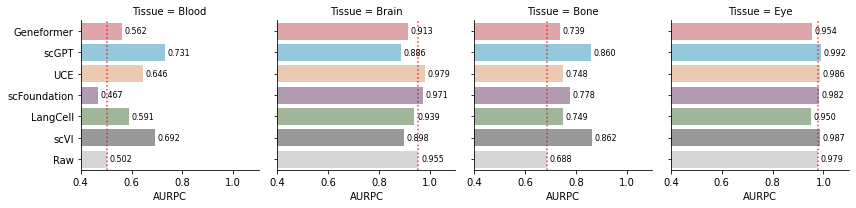

In [18]:
grid = sns.FacetGrid(df_all, col="Tissue")
# grid.map(sns.barplot, "Model", "AUPRC", data=df_all, hue="Model", 
#          palette=custom_palette, order=model_order_wo_hvg+["Raw"])

def barplot_with_text(data, **kwargs):
    order = model_order_wo_hvg + ["Raw"] 
    sns.barplot(data=data, x="AUPRC", y="Model", hue="Model", palette=custom_palette, order=order, orient="h")
    for index, model in enumerate(order):
        if model in data["Model"].values:
            value = data.set_index("Model").loc[model, "AUPRC"]
            plt.text(value+0.01, index, f'{value:.3f}', ha='left', va='center', fontsize=8)
    plt.axvline(x=data.set_index("Model").loc["Raw", "AUPRC"], color="red", linestyle=':', alpha=0.8)
grid.map_dataframe(barplot_with_text) # map_datafrmae：不需要传递data参数
grid.set_axis_labels('AURPC', "")
# grid.set_xticklabels([])
plt.xlim(0.4,1.1)
plt.tight_layout()
plt.savefig("../figures/cancer_finder/auprc_all_absolute_orienth.png", 
            dpi=300, bbox_inches='tight')

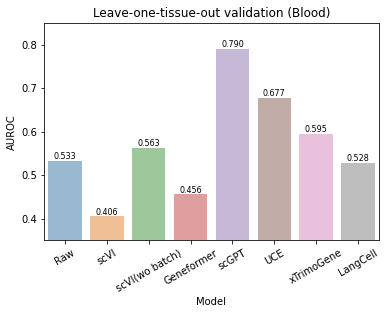

In [90]:
sns.barplot(data=df, x="Model", y="AUROC", hue="Model", alpha=0.5)
for index, value in enumerate(df["AUROC"].values):
    plt.text(index, value, f'{value:.3f}', ha='center', va='bottom', fontsize=8)
plt.title(f"Leave-one-tissue-out validation ({tissue})")
plt.ylim(0.35, 0.85)
plt.xticks(ticks=np.arange(len(model_list)),
           labels=["Raw", "scVI", "scVI(wo batch)", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell"], 
           rotation=30)
plt.xlabel("")
plt.tight_layout()
plt.savefig(f"../figures/cancer_finder/{tissue}_auroc.png", dpi=300)

### Average performance

In [51]:
# load optimized results
result_dir = "../SequencingCancerFinder/optuna_results"
result = pd.DataFrame()
model_list = ["X", "scVI_integrated_tissue", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell"]
for tissue in tissue_list:
    df = pd.DataFrame()
    auroc_ls, auprc_ls = [], []
    model_ls = []
    for model in model_list:
        optuna_results = pd.read_csv(os.path.join(result_dir, model, "optuna_all_trials.csv"))
        bs, dropout, lr, decay = optuna_results.loc[optuna_results["value"].idxmax(), :][1:]
        with open(os.path.join(result_dir, model, f"bs_{int(bs)}_lr_{lr}_drop_{dropout:.2f}_decay_{decay}", tissue, "train_log_val.txt")) as f:
            res = f.readlines()[-2:]
            auroc, auprc = res[0].strip().split(": ")[1], res[1].strip().split(": ")[1]
            auroc_ls.append(float(auroc))
            auprc_ls.append(float(auprc))
            model_ls.append(model_map_dict.get(model, model))
    df["Model"] = model_ls
    df["AUROC"] = auroc_ls
    df["AUPRC"] = auprc_ls
    df["Tissue"] = tissue
    result = pd.concat([result, df], axis=0)
result

,Model,AUROC,AUPRC,Tissue
0,Raw,0.5942,0.5019,Blood
1,scVI,0.7623,0.6918,Blood
2,Geneformer,0.6867,0.5618,Blood
3,scGPT,0.8011,0.7309,Blood
4,UCE,0.7467,0.6463,Blood
5,scFoundation,0.5953,0.4667,Blood
6,LangCell,0.6963,0.5911,Blood
0,Raw,0.8579,0.9546,Brain
1,scVI,0.7370,0.8981,Brain
2,Geneformer,0.7552,0.9130,Brain


In [120]:
mean_df = result.set_index("Tissue").groupby(["Model"]).agg("mean").reset_index()
std_df = result.set_index("Tissue").groupby(["Model"]).agg("std").reset_index()

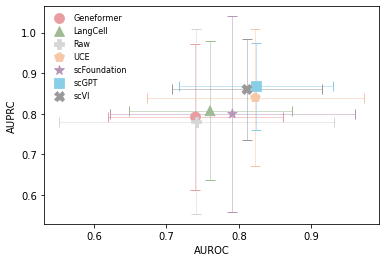

In [122]:
# plot auroc and auprc in a single figure
ax = sns.scatterplot(mean_df, x="AUROC", y="AUPRC", hue="Model", style="Model",
                    palette=custom_palette, markers=custom_shape, s=100, edgecolor=None,
                    zorder=2)
for model in std_df['Model'].unique():
    idx = std_df[std_df['Model'] == model].index[0]
    plt.errorbar(mean_df.loc[idx, 'AUROC'], mean_df.loc[idx, 'AUPRC'], 
                yerr=std_df.loc[idx, 'AUPRC'], 
                xerr=std_df.loc[idx, 'AUROC'], 
                fmt='none', ecolor=custom_palette[model], capsize=5, elinewidth=0.5,
                zorder=1)
sns.move_legend(ax, "upper left", bbox_to_anchor=(0, 1), 
                title=None, frameon=False, fontsize=8) # title_fontsize
plt.savefig("figures/cancer_finder/auroc_auprc.png", dpi=300, bbox_inches='tight')

In [123]:
keys = mean_df["Model"]
values = mean_df.loc[:, ["AUROC", "AUPRC"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.74015 , 0.791875]), 'LangCell': array([0.76025 , 0.807225]), 'Raw': array([0.741525, 0.78065 ]), 'UCE': array([0.822875, 0.839675]), 'scFoundation': array([0.791075, 0.799525]), 'scGPT': array([0.823825, 0.867175]), 'scVI': array([0.811225, 0.85975 ])}
Front 1: ['scGPT']
Front 2: ['UCE', 'scVI']
Front 3: ['LangCell', 'scFoundation']
Front 4: ['Geneformer', 'Raw']


In [132]:
for tissue in result["Tissue"].unique():
    df = result[result["Tissue"]==tissue]
    keys = df["Model"]
    values = df.loc[:, ["AUROC", "AUPRC"]].values
    population = {k:v for k,v in zip(keys, values)}
    print(f"========== {tissue} ==========")
    fronts = non_dominated_sort(population)
    for i, front in enumerate(fronts):
        print(f"Front {i + 1}: {front}")

========== Blood ==========
Front 1: ['scGPT']
Front 2: ['scVI']
Front 3: ['UCE']
Front 4: ['LangCell']
Front 5: ['Geneformer']
Front 6: ['Raw', 'scFoundation']
========== Brain ==========
Front 1: ['UCE']
Front 2: ['scFoundation']
Front 3: ['Raw']
Front 4: ['LangCell']
Front 5: ['Geneformer']
Front 6: ['scVI', 'scGPT']
========== Bone ==========
Front 1: ['scVI']
Front 2: ['scGPT']
Front 3: ['scFoundation']
Front 4: ['UCE', 'LangCell']
Front 5: ['Geneformer']
Front 6: ['Raw']
========== Eye ==========
Front 1: ['scGPT']
Front 2: ['scVI', 'UCE']
Front 3: ['scFoundation']
Front 4: ['Raw']
Front 5: ['Geneformer']
Front 6: ['LangCell']


## Roughness index (lower is better)

In [ ]:
model_list = ["X", "scVI_integrated_tissue", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell"]
tissue_list = ['Blood', 'Brain', 'Bone', 'Eye']
rogi_df = pd.DataFrame()
rogi_df["model"] = model_list
for tissue in tissue_list:
    print(f"Calculating ROGI for the adata from tissue: {tissue}")
    rogi_ls = []
    adata = sc.read_h5ad(f"{output_folder}/TISCH/{tissue}.h5ad")
    np.random.seed(42)
    sample_pos = np.random.choice(adata.obs[adata.obs["label"]==1].index, 5000, replace=False)
    sample_neg = np.random.choice(adata.obs[adata.obs["label"]==0].index, 5000, replace=False)
    adata_subset = adata[adata.obs.index.isin(np.concatenate([sample_neg, sample_pos]))]
    for model in model_list:
        if model == "X":
            ri = RoughnessIndex(X=adata_subset.X.toarray(), Y=adata_subset.obs['label'], metric='euclidean', verbose=False)        
        else:
            ri = RoughnessIndex(X=adata_subset.obsm[model], Y=adata_subset.obs['label'], metric='euclidean', verbose=False)        
        rogi = ri.compute_index(min_dt=0.01)
        rogi_ls.append(rogi)
    rogi_df[tissue] = rogi_ls

Calculating ROGI for the adata from tissue: Blood


In [ ]:
model_list = ["X", "scVI_integrated_tissue", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell"]
tissue_list = ['Blood', 'Brain', 'Bone', 'Eye']
rogi_df = pd.DataFrame()
rogi_df["model"] = model_list
for (tissue1, tissue2) in list(itertools.combinations(tissue_list, 2)):
    print(f"Calculating ROGI for the combination of: {tissue1} + {tissue2}")
    rogi_ls = []
    adata = sc.read_h5ad(f"{output_folder}/TISCH/{tissue1}.h5ad")
    np.random.seed(42)
    sample_pos = np.random.choice(adata.obs[adata.obs["label"]==1].index, 1000, replace=False)
    sample_neg = np.random.choice(adata.obs[adata.obs["label"]==0].index, 1000, replace=False)
    adata_subset = adata[adata.obs.index.isin(np.concatenate([sample_neg, sample_pos]))]

    adata = sc.read_h5ad(f"{output_folder}/TISCH/{tissue2}.h5ad")
    sample_pos = np.random.choice(adata.obs[adata.obs["label"]==1].index, 1000, replace=False)
    sample_neg = np.random.choice(adata.obs[adata.obs["label"]==0].index, 1000, replace=False)
    adata_subset = adata_subset.concatenate(adata[adata.obs.index.isin(np.concatenate([sample_neg, sample_pos]))])
    print(adata_subset.X.shape)

    for model in model_list:
        if model == "X":
            ri = RoughnessIndex(X=adata_subset.X.toarray(), Y=adata_subset.obs['label'], metric='euclidean', verbose=False)        
        else:
            ri = RoughnessIndex(X=adata_subset.obsm[model], Y=adata_subset.obs['label'], metric='euclidean', verbose=False)        
        rogi = ri.compute_index(min_dt=0.01)
        rogi_ls.append(rogi)
    rogi_df[f"{tissue1}_{tissue2}"] = rogi_ls

Calculating ROGI for the combination of: Blood + Brain


/data2/zhuyiheng/.conda/envs/singlecell/lib/python3.8/site-packages/anndata/_core/anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html


(4000, 10112)
Calculating ROGI for the combination of: Blood + Bone


/data2/zhuyiheng/.conda/envs/singlecell/lib/python3.8/site-packages/anndata/_core/anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html


(4000, 11556)
Calculating ROGI for the combination of: Blood + Eye


/data2/zhuyiheng/.conda/envs/singlecell/lib/python3.8/site-packages/anndata/_core/anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html


(4000, 11986)
Calculating ROGI for the combination of: Brain + Bone


/data2/zhuyiheng/.conda/envs/singlecell/lib/python3.8/site-packages/anndata/_core/anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html


(4000, 11151)
Calculating ROGI for the combination of: Brain + Eye


/data2/zhuyiheng/.conda/envs/singlecell/lib/python3.8/site-packages/anndata/_core/anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html


(4000, 12132)
Calculating ROGI for the combination of: Bone + Eye


/data2/zhuyiheng/.conda/envs/singlecell/lib/python3.8/site-packages/anndata/_core/anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html


(4000, 16568)


In [40]:
for tissue in tissue_list:
    rogi_df[tissue] = rogi_df.loc[:, [col for col in rogi_df.columns if tissue in col]].mean(1)
rogi_df

,model,Blood_Brain,Blood_Bone,Blood_Eye,Brain_Bone,Brain_Eye,Bone_Eye,Blood,Brain,Bone,Eye
0,X,0.763469,0.789371,0.737472,0.780748,0.756271,0.788011,0.763437,0.766829,0.786043,0.760585
1,scVI_integrated_tissue,0.726005,0.740819,0.704324,0.726927,0.706549,0.724912,0.723716,0.719827,0.730886,0.711929
2,Geneformer,0.803406,0.805553,0.748929,0.792617,0.769704,0.773619,0.785963,0.788576,0.790596,0.764084
3,scGPT,0.712971,0.688925,0.653224,0.747748,0.711612,0.687924,0.685040,0.724110,0.708199,0.684253
4,UCE,0.767616,0.727067,0.755577,0.777678,0.744389,0.615146,0.750087,0.763228,0.706630,0.705038
5,xTrimoGene,0.672733,0.776516,0.740643,0.763510,0.727323,0.737391,0.729964,0.721188,0.759139,0.735119
6,LangCell,0.757820,0.781528,0.752251,0.769848,0.742994,0.774253,0.763866,0.756887,0.775209,0.756499


In [131]:
# rogi_df.to_csv("../figures/cancer_finder/cancer_finder_rogi_pairwise.csv", index=False)
rogi_df = pd.read_csv("../figures/cancer_finder/cancer_finder_rogi_pairwise.csv", usecols=["model"]+tissue_list)
rogi_df["model"] = rogi_df["model"].apply(lambda x: model_map_dict.get(x, x))
rogi_df = rogi_df.set_index("model")
rogi_df

,Blood,Brain,Bone,Eye
model,,,,
Raw,0.7634,0.7668,0.7860,0.7606
scVI,0.7237,0.7198,0.7309,0.7119
Geneformer,0.7860,0.7886,0.7906,0.7641
scGPT,0.6850,0.7241,0.7082,0.6843
UCE,0.7501,0.7632,0.7066,0.7050
scFoundation,0.7300,0.7212,0.7591,0.7351
LangCell,0.7639,0.7569,0.7752,0.7565


0.7634373276645124 0.5 1.5
0.7668294331922909 1.5 2.5
0.7860434476927264 2.5 3.5
0.7605848927643697 3.5 4.5


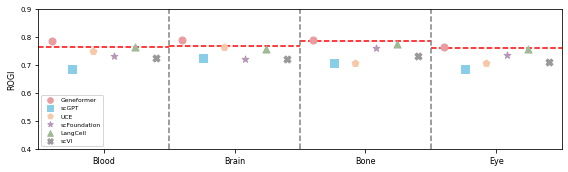

In [136]:
plt.figure(figsize=(8,2.5))
x = np.arange(1,5)
x_line = [0.5, 1.5, 2.5, 3.5, 4.5]
plt.xlim(0.5, 4.5)
plt.ylim(0.4, 0.9)
width = 0.16
for i, model_name in enumerate(model_order_wo_hvg + ["Raw"]):
    x_pos = x + i * width - 2.5 * width  # Adjust x position for each dataset
    y = rogi_df.loc[model_name, :]
    # print(x_pos)
    if model_name == "Raw":
        x_min = x_line[:-1]
        x_max = x_line[1:]
        xlim = plt.gca().get_xlim()
        for y_, x_min_, x_max_ in zip(y, x_min, x_max):
            print(y_, x_min_, x_max_)
            x_min_ = (x_min_ - xlim[0]) / (xlim[1] - xlim[0])
            x_max_ = (x_max_ - xlim[0]) / (xlim[1] - xlim[0])
            plt.axhline(y=y_, xmin=x_min_, xmax=x_max_, ls="--", color="red",zorder=1)
    else:
        plt.scatter(x_pos, y, s=50, color=custom_palette[model_name], alpha=1, label=model_name, zorder=2,
            marker=custom_shape[model_name])
plt.legend(fontsize=6, markerscale=0.8)
for x in x_line[1:-1]:
    plt.axvline(x=x, ls="--", color="grey")   
plt.ylabel("ROGI", fontsize=8)
plt.yticks(fontsize=7)
plt.xticks(ticks=[1,2,3,4], labels=['Blood', 'Brain', 'Bone', 'Eye'], fontsize=8)
plt.tight_layout()
plt.savefig("../figures/cancer_finder/tissue_rogi.png", dpi=300)

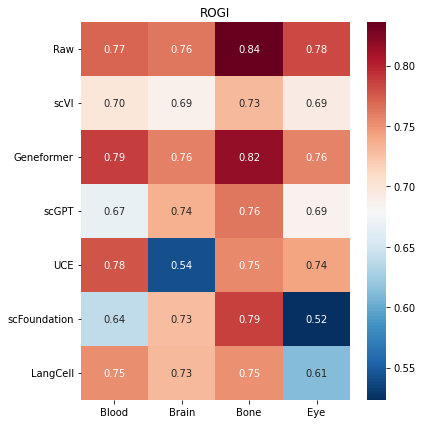

In [48]:
heatmap_df = rogi_df
plt.figure(figsize=(6,6))
ax = sns.heatmap(heatmap_df, annot=True, cmap="RdBu_r", fmt=".2f")
ax.set_ylabel("")
ax.set_xlabel("")
ax.set_title("ROGI")
plt.tight_layout()
# plt.savefig("figures/cancer_finder/tissue_rogi_heatmap.png", dpi=300, bbox_inches="tight")

### Correlation of ROGI and model performance

In [52]:
x = result.groupby("Model")[["AUROC", "AUPRC"]].agg("mean").reset_index()
x = x.set_index("Model")
x

,AUROC,AUPRC
Model,,
Geneformer,0.740150,0.791875
LangCell,0.760250,0.807225
Raw,0.741525,0.780650
UCE,0.822875,0.839675
scFoundation,0.791075,0.799525
scGPT,0.823825,0.867175
scVI,0.811225,0.859750


In [53]:
y = rogi_df.mean(1).to_frame("ROGI")
y

,ROGI
model,
Raw,0.769224
scVI,0.721589
Geneformer,0.782305
scGPT,0.700401
UCE,0.731246
scFoundation,0.736353
LangCell,0.763115


In [54]:
df = pd.merge(x, y, left_index=True, right_index=True)
df

,AUROC,AUPRC,ROGI
Geneformer,0.740150,0.791875,0.782305
LangCell,0.760250,0.807225,0.763115
Raw,0.741525,0.780650,0.769224
UCE,0.822875,0.839675,0.731246
scFoundation,0.791075,0.799525,0.736353
scGPT,0.823825,0.867175,0.700401
scVI,0.811225,0.859750,0.721589


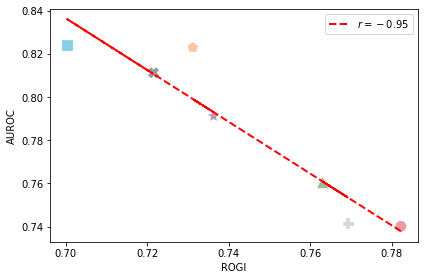

In [56]:
df_plot = df.copy()
df_plot["Model"] = df.index
r, p_value = pearsonr(df["AUROC"], df["ROGI"])
ax = sns.scatterplot(df_plot, x="ROGI", y="AUROC", hue="Model", style="Model", s=100,
                     markers=custom_shape, palette=custom_palette,
                     edgecolor=None, legend=None)
coef = np.polyfit(df["ROGI"], df["AUROC"], 1)
poly = np.poly1d(coef)
ax.plot(df["ROGI"], poly(df["ROGI"]), linestyle="--", color="red", linewidth=2, label=f"$r = {r:.2f}$")
plt.legend()
plt.tight_layout()
plt.savefig("../figures/cancer_finder/auroc_rogi_regplot.png", dpi=300, bbox_inches="tight")

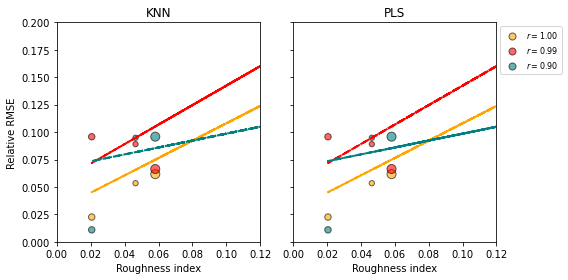

In [57]:
# 示例数据（替换为你的实际数据）
np.random.seed(42)
roughness_index = np.random.rand(30)
relative_rmse_1 = 0.8 * roughness_index + 0.05 * np.random.rand(30)
relative_rmse_2 = 0.9 * roughness_index + 0.1 * np.random.rand(30)
relative_rmse_3 = 0.3 * roughness_index + 0.15 * np.random.rand(30)

weights = np.random.rand(30) * 100  # 权重决定点大小

# 计算 Pearson 相关系数
r1, _ = pearsonr(roughness_index, relative_rmse_1)
r2, _ = pearsonr(roughness_index, relative_rmse_2)
r3, _ = pearsonr(roughness_index, relative_rmse_3)

# 配置绘图参数
fig, axes = plt.subplots(1, 2, figsize=(8, 4), sharey=True)
models = ["KNN", "PLS"]
colors = ["orange", "red", "teal"]
rmse_data = [relative_rmse_1, relative_rmse_2, relative_rmse_3]
r_values = [r1, r2, r3]

# 绘制每个模型的散点图
for ax, model in zip(axes, models):
    for rmse, color, r in zip(rmse_data, colors, r_values):
        ax.scatter(roughness_index, rmse, s=weights, color=color, alpha=0.6, edgecolor='k', label=f"$r = {r:.2f}$")
        # 添加拟合线
        coef = np.polyfit(roughness_index, rmse, 1)
        poly = np.poly1d(coef)
        ax.plot(roughness_index, poly(roughness_index), linestyle="--", color=color, linewidth=2)

    # 设置轴和标题
    ax.set_title(model, fontsize=12)
    ax.set_xlabel("Roughness index", fontsize=10)
    ax.set_xlim(0, 0.12)
    ax.set_ylim(0, 0.2)

# 设置左轴
axes[0].set_ylabel("Relative RMSE", fontsize=10)

# 调整布局和图例
plt.legend(fontsize=8, loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()


In [85]:
df.corr()

,AUROC,AUPRC,ROGI
AUROC,1.000000,0.890011,-0.731283
AUPRC,0.890011,1.000000,-0.508652
ROGI,-0.731283,-0.508652,1.000000


In [89]:
df.corr(method="spearman")

,AUROC,AUPRC,ROGI
AUROC,1.000000,0.892857,-0.464286
AUPRC,0.892857,1.000000,-0.428571
ROGI,-0.464286,-0.428571,1.000000


In [25]:
pearsonr(df["AUROC"], df["ROGI"])

PearsonRResult(statistic=-0.7312833603627763, pvalue=0.061819693896920894)

In [88]:
pearsonr(df["AUPRC"], df["ROGI"])

PearsonRResult(statistic=-0.508652305681315, pvalue=0.24371232556634914)

## UMAP visualization

In [1]:
tissue_list = ['Blood', 'Brain', 'Bone', 'Eye']
tissue_list

['Blood', 'Brain', 'Bone', 'Eye']

In [ ]:
adata_list = []
for i, tissue in enumerate(tissue_list):
    adata = sc.read_h5ad(f"{output_folder}/TISCH/{tissue}.h5ad")
    adata.obs["Tissue"] = tissue
    adata_list.append(adata)
adata_all = ad.concat(adata_list, join='outer')

In [173]:
adata_all.obs["Tissue"]

Cell
AML328-D113_ATTAAGCATTTC                 Blood
AML328-D113_GAAATGCCCCAT                 Blood
AML328-D113_GGGTGGCGAAAC                 Blood
AML328-D113_TAACTAAGCTAC                 Blood
AML328-D113_TCGTTAGTTATT                 Blood
                                         ...  
GSM4147100_UMM067L@TCGCGTTGTGTTAAGA-1      Eye
GSM4147100_UMM067L@TCTGGAACATTAACCG-1      Eye
GSM4147100_UMM067L@TGAGCATAGCGTGAAC-1      Eye
GSM4147100_UMM067L@TTAGGACCAAAGTCAA-1      Eye
GSM4147100_UMM067L@TTCCCAGAGTCAATAG-1      Eye
Name: Tissue, Length: 267390, dtype: object

In [ ]:
model = "scVI_integrated"
sc.pp.neighbors(adata_all, use_rep=model)
sc.tl.umap(adata_all)
fig = sc.pl.umap(adata_all, color=['Celltype (malignancy)', 'Tissue'], wspace=0.3, return_fig=True)
fig.savefig(f"../figures/cancer_finder/{model}_umap.png", dpi=300, bbox_inches='tight')

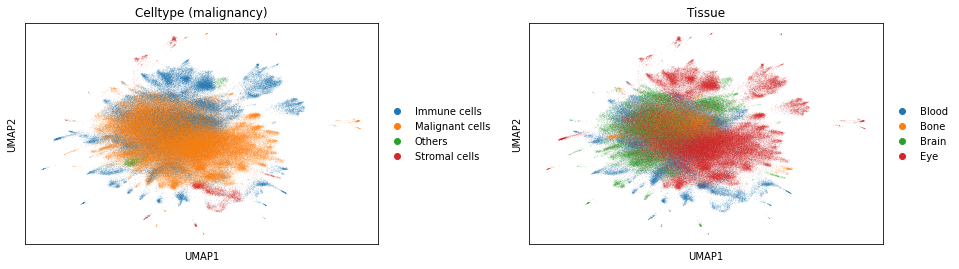

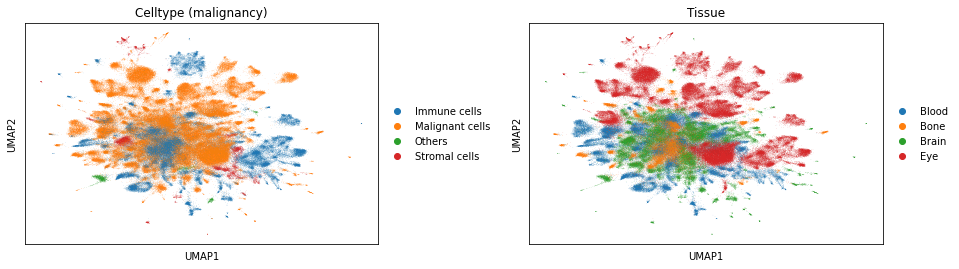

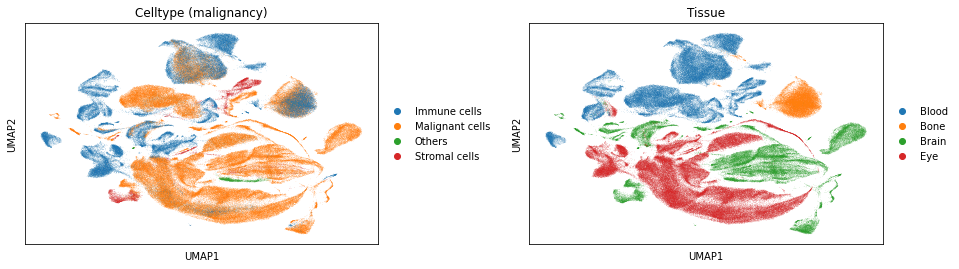

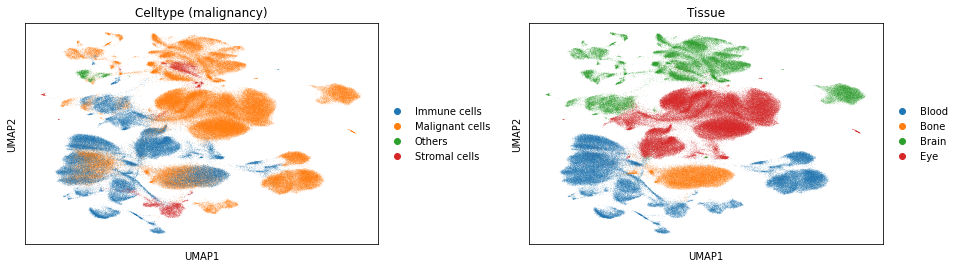

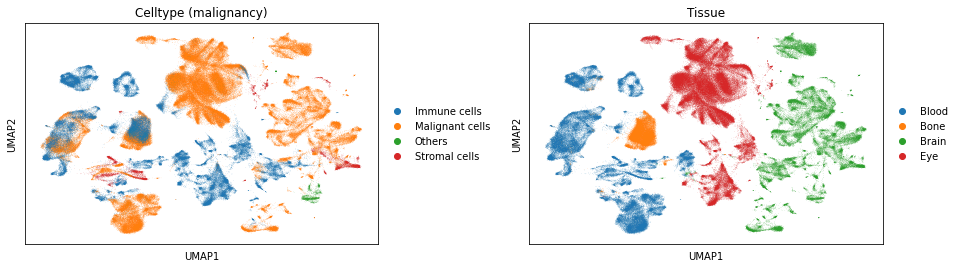

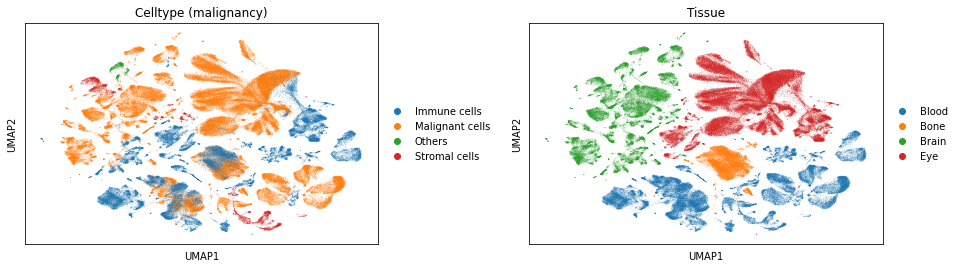

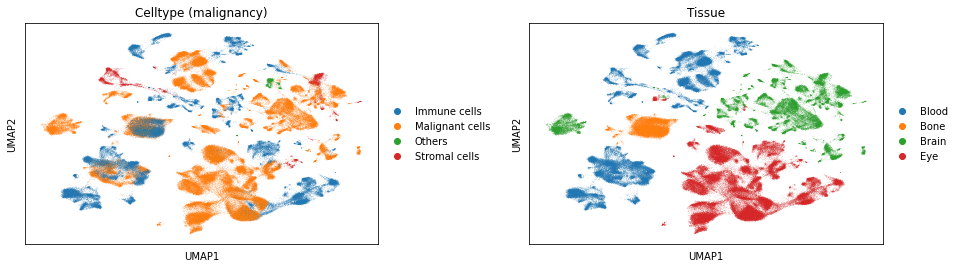

In [182]:
for model in model_list[1:]:
    sc.pp.neighbors(adata_all, use_rep=model)
    sc.tl.umap(adata_all)
    fig = sc.pl.umap(adata_all, color=['Celltype (malignancy)', 'Tissue'], wspace=0.3, return_fig=True)
    fig.savefig(f"../figures/cancer_finder/{model}_umap.png", dpi=300, bbox_inches='tight')

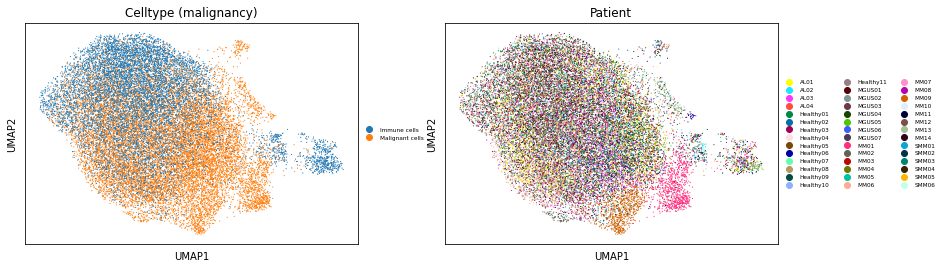

In [157]:
sc.pp.neighbors(adata, use_rep='scGPT')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['Celltype (malignancy)', 'Patient'],legend_fontsize ='xx-small',size=5,legend_fontweight='light')

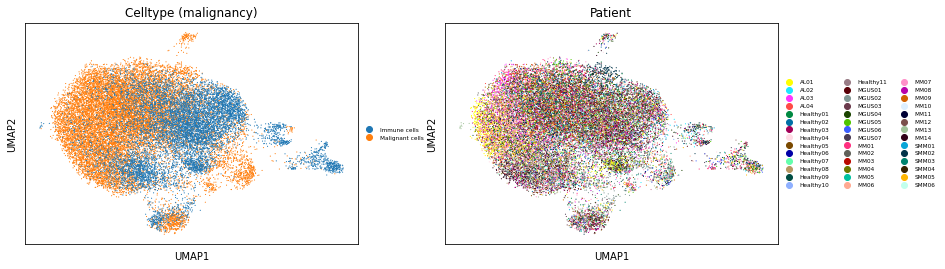

In [158]:
sc.pp.neighbors(adata, use_rep='scVI')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['Celltype (malignancy)', 'Patient'],legend_fontsize ='xx-small',size=5,legend_fontweight='light')

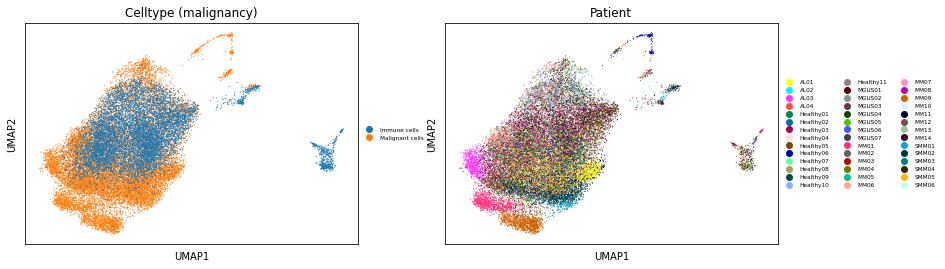

In [159]:
sc.pp.neighbors(adata, use_rep='UCE')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['Celltype (malignancy)', 'Patient'],legend_fontsize ='xx-small',size=5,legend_fontweight='light')

# Drug sensitivity

In [109]:
result = pd.read_csv("../figures/drug_sensitivity/drug_sensitivity.csv", delimiter="\t")
result.head()

,Drug,AUROC,AUPRC,Model
0,Sorafenib,0.8400,0.8400,scFoundation
1,NVP-TAE684,0.8400,0.8737,scFoundation
2,PLX4720_451Lu,0.6600,0.6755,scFoundation
3,Etoposide,0.6800,0.6227,scFoundation
4,Sorafenib,0.7819,0.7393,scGPT


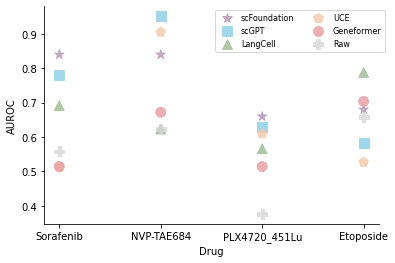

In [25]:
# sns.stripplot(result, x="Drug", y="AUROC", hue="Model", s=10, 
#               palette=custom_palette)
sns.scatterplot(result, x="Drug", y="AUROC", style="Model", hue="Model", s=100, 
                palette=custom_palette, markers=custom_shape, alpha=0.8, edgecolor=None)
sns.despine(top=True, right=True, left=False, bottom=False)
ax = plt.gca()
# ax.legend(loc="upper left", ncol=3, title="Model", frameon=True, bbox_to_anchor=(1, 0.8))
ax.legend(loc="upper left", ncol=2, fontsize=8, bbox_to_anchor=(0.5, 1))
plt.savefig("../figures/drug_sensitivity/drug_auroc_1105.png", dpi=300, bbox_inches='tight')

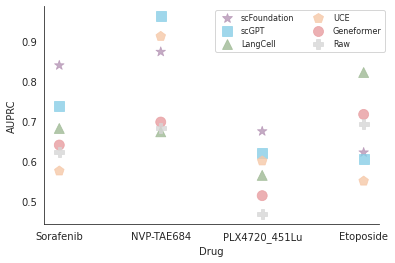

In [27]:
sns.set_style('white')
sns.scatterplot(result, x="Drug", y="AUPRC", style="Model", hue="Model", s=100, 
                palette=custom_palette, markers=custom_shape, alpha=0.8, edgecolor=None)
sns.despine(top=True, right=True, left=False, bottom=False)
ax = plt.gca()
# ax.legend(loc="upper left", ncol=1, title="Model", frameon=True, bbox_to_anchor=(1, 0.8))
ax.legend(loc="upper left", ncol=2, fontsize=8, bbox_to_anchor=(0.5, 1))
plt.savefig("../figures/drug_sensitivity/drug_auprc_1105.png", dpi=300, bbox_inches='tight')

## Roughness index (lower is better)

In [11]:
rogi_result = []
drug_ls = ["Sorafenib", "Etoposide", "NVP-TAE684", "PLX4720_451Lu"]
model_ls = ["geneformer", "scgpt", "uce", "xTrimoGene", "langcell", "Raw"]
for drug in drug_ls:
    for model in model_ls:
        folder = f"./xTrimoGene/SCAD/data_allen/{drug}/{model}/stratified_emb/before_training"
        for split_id in range(1,6):
            bulk_train_X = pd.read_csv(os.path.join(folder, "source_5_folds", f"split{split_id}", "X_train_source.tsv"), delimiter="\t", index_col=0)
            bulk_train_Y = pd.read_csv(os.path.join(folder, "source_5_folds", f"split{split_id}", "Y_train_source.tsv"), delimiter="\t", index_col=0)
            sc_train_X = pd.read_csv(os.path.join(folder, "target_5_folds", f"split{split_id}", "X_train_target.tsv"), delimiter="\t", index_col=0)
            sc_train_Y = pd.read_csv(os.path.join(folder, "target_5_folds", f"split{split_id}", "Y_train_target.tsv"), delimiter="\t", index_col=0)
            
            ri = RoughnessIndex(X=bulk_train_X, Y=bulk_train_Y, metric='euclidean', verbose=False)        
            rogi_bulk = ri.compute_index(min_dt=0.01)
            ri = RoughnessIndex(X=sc_train_X, Y=sc_train_Y, metric='euclidean', verbose=False)        
            rogi_sc = ri.compute_index(min_dt=0.01)            
            ri = RoughnessIndex(X=pd.concat([sc_train_X, bulk_train_X]) , Y=pd.concat([sc_train_Y, bulk_train_Y]), metric='euclidean', verbose=False)        
            rogi_all = ri.compute_index(min_dt=0.01)

            rogi_result.append(
                {"drug": drug,
                 "model": model_map_dict.get(model, model),
                 "split": split_id,
                 "ROGI(Bulk)": rogi_bulk,
                 "ROGI(Single-cell)": rogi_sc,
                 "ROGI(Combined)": rogi_all}
            )

In [137]:
# rogi_df = pd.DataFrame.from_dict(rogi_result)
# rogi_df.to_csv("../figures/drug_sensitivity/cancer_finder_rogi.csv", index=False)
rogi_df = pd.read_csv("../figures/drug_sensitivity/cancer_finder_rogi.csv")
rogi_df_grouped = rogi_df.groupby(["drug", "model"]).agg("mean").reset_index()
rogi_df_grouped

,drug,model,split,ROGI(Bulk),ROGI(Single-cell),ROGI(Combined)
0,Etoposide,Geneformer,3.0,0.3883,0.7491,0.6674
1,Etoposide,LangCell,3.0,0.3767,0.7316,0.6899
2,Etoposide,Raw,3.0,0.3869,0.8448,0.8417
3,Etoposide,UCE,3.0,0.3799,0.7579,0.7205
4,Etoposide,scFoundation,3.0,0.3823,0.7114,0.6605
5,Etoposide,scGPT,3.0,0.3776,0.7564,0.7153
6,NVP-TAE684,Geneformer,3.0,0.4595,0.7121,0.5473
7,NVP-TAE684,LangCell,3.0,0.4463,0.6398,0.5567
8,NVP-TAE684,Raw,3.0,0.4562,0.7251,0.6230
9,NVP-TAE684,UCE,3.0,0.4472,0.6514,0.5555


0.6898963007229952 0.5 1.5
0.5567450531616973 1.5 2.5
0.55248997753356 2.5 3.5
0.5384555114759948 3.5 4.5


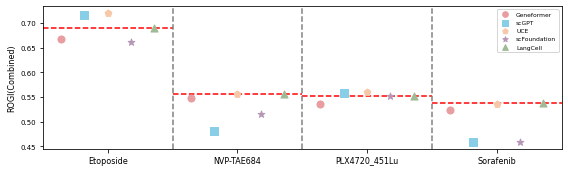

In [138]:
plt.figure(figsize=(8,2.5))
x = np.arange(1,5)
x_line = [0.5, 1.5, 2.5, 3.5, 4.5]
plt.xlim(0.5, 4.5)
width = 0.18
for i, model_name in enumerate(model_order_scFM+["Raw"]):
    if model_name == "Raw":
        x_min = x_line[:-1]
        x_max = x_line[1:]
        xlim = plt.gca().get_xlim()
        for y_, x_min_, x_max_ in zip(y, x_min, x_max):
            print(y_, x_min_, x_max_)
            x_min_ = (x_min_ - xlim[0]) / (xlim[1] - xlim[0])
            x_max_ = (x_max_ - xlim[0]) / (xlim[1] - xlim[0])
            plt.axhline(y=y_, xmin=x_min_, xmax=x_max_, ls="--", color="red",zorder=1)
    else:
        x_pos = x + i * width - 2 * width  # Adjust x position for each dataset
        y = rogi_df_grouped[rogi_df_grouped["model"]==model_name]["ROGI(Combined)"].tolist()
        # print(x_pos, y)
        plt.scatter(x_pos, y, s=50, color=custom_palette[model_name], alpha=1, label=model_name, zorder=2,
                    marker=custom_shape[model_name])

plt.legend(fontsize=6, markerscale=0.8)
for x in x_line[1:-1]:
    plt.axvline(x=x, ls="--", color="grey")   
plt.ylabel("ROGI(Combined)", fontsize=8)
plt.yticks(fontsize=7)
plt.xticks(ticks=[1,2,3,4], labels=rogi_df_grouped["drug"].unique(), fontsize=8)
plt.tight_layout()
plt.savefig("../figures/drug_sensitivity/drug_rogi.png", dpi=300)

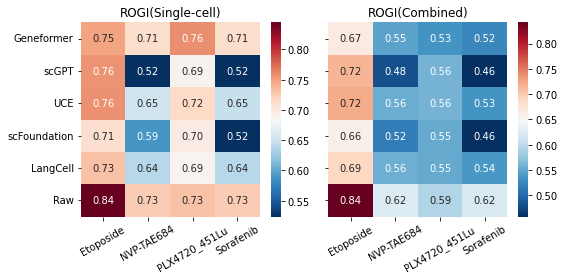

In [24]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=False)
for i, col in enumerate(["ROGI(Single-cell)", "ROGI(Combined)"]):
    heatmap_df = rogi_df_grouped.pivot(index="model", columns="drug", values=col)
    # heatmap_df.sort_index()
    # Map the sort order to a dictionary for use as a key
    sort_key = {value: idx for idx, value in enumerate(model_order_scFM+["Raw"])}
    # Sort the DataFrame
    sorted_df = heatmap_df.sort_index(key=lambda x: x.map(sort_key))
    sns.heatmap(sorted_df, annot=True, fmt=".2f", cmap="RdBu_r", ax=axes[i])
    axes[i].set_ylabel("")
    axes[i].set_xlabel("")
    axes[i].set_title(col)
    xticklabels = axes[i].get_xticklabels()
    axes[i].set_xticklabels(xticklabels, rotation=30)
    if i > 0:
        axes[i].set_yticklabels("")
plt.tight_layout()
# plt.savefig("figures/drug_sensitivity/drug_rogi_heatmap.png", dpi=300)

### Correlation of ROGI and model performance

In [82]:
x = result.groupby("Model")[["AUROC", "AUPRC"]].agg("mean").reset_index()
x = x.set_index("Model")
x

,AUROC,AUPRC
Model,,
Geneformer,0.601125,0.643050
LangCell,0.667350,0.686075
Raw,0.554175,0.617675
UCE,0.638600,0.660425
scFoundation,0.755000,0.752975
scGPT,0.736525,0.732425


In [83]:
y = rogi_df_grouped.groupby("model")[["ROGI(Combined)"]].agg("mean").reset_index()
y = y.set_index("model")
y

,ROGI(Combined)
model,
Geneformer,0.568500
LangCell,0.584397
Raw,0.668955
UCE,0.592523
scFoundation,0.546730
scGPT,0.553412


In [84]:
df = pd.merge(x, y, left_index=True, right_index=True)
df

,AUROC,AUPRC,ROGI(Combined)
Model,,,
Geneformer,0.601125,0.643050,0.568500
LangCell,0.667350,0.686075,0.584397
Raw,0.554175,0.617675,0.668955
UCE,0.638600,0.660425,0.592523
scFoundation,0.755000,0.752975,0.546730
scGPT,0.736525,0.732425,0.553412


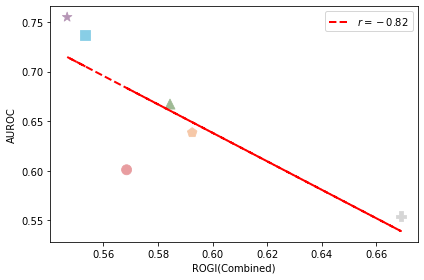

In [86]:
df_plot = df.copy()
df_plot["Model"] = df.index
r, p_value = pearsonr(df["AUROC"], df["ROGI(Combined)"])
ax = sns.scatterplot(df_plot, x="ROGI(Combined)", y="AUROC", hue="Model", style="Model", s=100,
                     markers=custom_shape, palette=custom_palette,
                     edgecolor=None, legend=None)
coef = np.polyfit(df["ROGI(Combined)"], df["AUROC"], 1)
poly = np.poly1d(coef)
ax.plot(df["ROGI(Combined)"], poly(df["ROGI(Combined)"]), linestyle="--", color="red", linewidth=2, label=f"$r = {r:.2f}$")
plt.legend()
plt.tight_layout()
plt.savefig("../figures/drug_sensitivity/auroc_rogi_regplot.png", dpi=300, bbox_inches="tight")

In [73]:
# w/o pvalue
df.corr()

,AUROC,AUPRC,ROGI(Combined)
AUROC,1.000000,0.994668,-0.821632
AUPRC,0.994668,1.000000,-0.794775
ROGI(Combined),-0.821632,-0.794775,1.000000


In [29]:
pearsonr(df["AUROC"], df["ROGI(Combined)"])

PearsonRResult(statistic=-0.8216319009808691, pvalue=0.04488536164495736)

In [30]:
spearmanr(df["AUROC"], df["ROGI(Combined)"])

SignificanceResult(statistic=-0.8285714285714287, pvalue=0.04156268221574334)

In [31]:
pearsonr(df["AUPRC"], df["ROGI(Combined)"])

PearsonRResult(statistic=-0.7947749112472168, pvalue=0.05885423846295497)

In [32]:
spearmanr(df["AUPRC"], df["ROGI(Combined)"])

SignificanceResult(statistic=-0.8285714285714287, pvalue=0.04156268221574334)

In [31]:
for drug in drug_ls:
    x = result[result["Drug"]==drug].sort_values(by="Model", key=lambda x: x.map(sort_key))["AUROC"]
    y = rogi_df_grouped[rogi_df_grouped["drug"]==drug].sort_values(by="model", key=lambda x: x.map(sort_key))["ROGI(Combined)"]
    print(x, y)
    pearsonr_coeff = pearsonr(x, y)
    spearmanr_coeff = spearmanr(x, y)
    print(pearsonr_coeff, spearmanr_coeff)

16    0.5142
4     0.7819
12    0.5125
0     0.8400
8     0.6917
20    0.5583
Name: AUROC, dtype: float64 18    0.524464
23    0.458141
21    0.534873
22    0.458141
19    0.538456
20    0.619015
Name: ROGI(Combined), dtype: float64
PearsonRResult(statistic=-0.7238391705811674, pvalue=0.10386652983458669) SignificanceResult(statistic=-0.5217939320872036, pvalue=0.28834323380039373)
19    0.7039
7     0.5842
15    0.5270
3     0.6800
11    0.7880
23    0.6587
Name: AUROC, dtype: float64 0    0.667449
5    0.715260
3    0.720495
4    0.660534
1    0.689896
2    0.841656
Name: ROGI(Combined), dtype: float64
PearsonRResult(statistic=-0.23994521706554378, pvalue=0.6469894422364861) SignificanceResult(statistic=-0.6, pvalue=0.20799999999999982)
17    0.6722
5     0.9514
13    0.9056
1     0.8400
9     0.6236
21    0.6236
Name: AUROC, dtype: float64 6     0.547262
11    0.481668
9     0.555489
10    0.515925
7     0.556745
8     0.622989
Name: ROGI(Combined), dtype: float64
PearsonRResult(sta

## Average performance

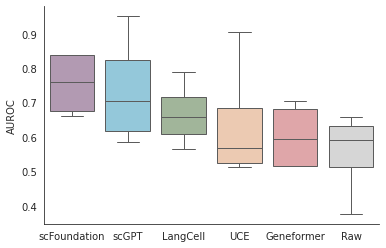

In [178]:
sns.boxplot(result, x="Model", y="AUROC", hue="Model", palette=custom_palette, width=0.8)
sns.despine(top=True, right=True, left=False, bottom=False)
plt.xlabel("")
plt.savefig("figures/drug_sensitivity/average_auroc.png", dpi=300, bbox_inches='tight')

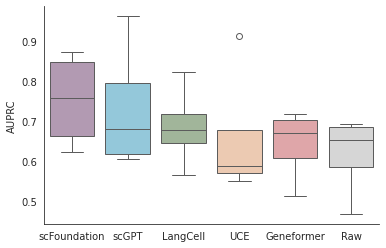

In [179]:
sns.boxplot(result, x="Model", y="AUPRC", hue="Model", palette=custom_palette, width=0.8)
sns.despine(top=True, right=True, left=False, bottom=False)
plt.xlabel("")
plt.savefig("figures/drug_sensitivity/average_auprc.png", dpi=300, bbox_inches='tight')

In [302]:
mean_df = result.set_index("Drug").groupby(["Model"]).agg("mean").reset_index()
std_df = result.set_index("Drug").groupby(["Model"]).agg("std").reset_index()

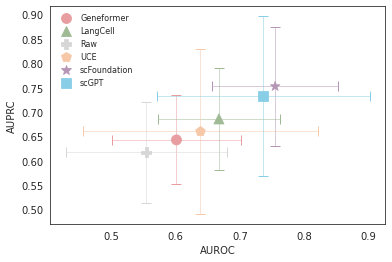

In [225]:
# plot auroc and auprc in a single figure
ax = sns.scatterplot(mean_df, x="AUROC", y="AUPRC", hue="Model", style="Model",
                    palette=custom_palette, markers=custom_shape, s=100, edgecolor=None,
                    zorder=2)
for model in std_df['Model'].unique():
    idx = std_df[std_df['Model'] == model].index[0]
    plt.errorbar(mean_df.loc[idx, 'AUROC'], mean_df.loc[idx, 'AUPRC'], 
                yerr=std_df.loc[idx, 'AUPRC'], 
                xerr=std_df.loc[idx, 'AUROC'], 
                fmt='none', ecolor=custom_palette[model], capsize=5, elinewidth=0.5,
                zorder=1)
sns.move_legend(ax, "upper left", bbox_to_anchor=(0, 1), 
                title=None, frameon=False, fontsize=8) # title_fontsize
plt.savefig("figures/drug_sensitivity/auroc_auprc.png", dpi=300, bbox_inches='tight')

In [304]:
keys = mean_df["Model"]
values = mean_df.loc[:, ["AUROC", "AUPRC"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.601125, 0.64305 ]), 'LangCell': array([0.66735 , 0.686075]), 'Raw': array([0.554175, 0.617675]), 'UCE': array([0.6386  , 0.660425]), 'scFoundation': array([0.755   , 0.752975]), 'scGPT': array([0.736525, 0.732425])}
Front 1: ['scFoundation']
Front 2: ['scGPT']
Front 3: ['LangCell']
Front 4: ['UCE']
Front 5: ['Geneformer']
Front 6: ['Raw']


In [307]:
for drug in result["Drug"].unique():
    df = result[result["Drug"]==drug]
    keys = df["Model"]
    values = df.loc[:, ["AUROC", "AUPRC"]].values
    population = {k:v for k,v in zip(keys, values)}
    print(f"========== {drug} ==========")
    fronts = non_dominated_sort(population)
    for i, front in enumerate(fronts):
        print(f"Front {i + 1}: {front}")

========== Sorafenib ==========
Front 1: ['scFoundation']
Front 2: ['scGPT']
Front 3: ['LangCell']
Front 4: ['Geneformer', 'Raw']
Front 5: ['UCE']
========== NVP-TAE684 ==========
Front 1: ['scGPT']
Front 2: ['UCE']
Front 3: ['scFoundation']
Front 4: ['Geneformer']
Front 5: ['Raw']
Front 6: ['LangCell']
========== PLX4720_451Lu ==========
Front 1: ['scFoundation']
Front 2: ['scGPT']
Front 3: ['UCE']
Front 4: ['LangCell']
Front 5: ['Geneformer']
Front 6: ['Raw']
========== Etoposide ==========
Front 1: ['LangCell']
Front 2: ['Geneformer']
Front 3: ['scFoundation', 'Raw']
Front 4: ['scGPT']
Front 5: ['UCE']


# General figures

## Task correlation

In [11]:
file = "../figures/overall_ranking/funkyheatmap_summary_overall.xlsx"
data = pd.read_excel(file, sheet_name="data").set_index("id")
data

,Overall ranking,Overall ranking_scIB,Overall ranking_scGraph,Overall ranking_annotation,Overall ranking_cancer,Overall ranking_sensitivity
id,,,,,,
Raw,NaN,NaN,NaN,NaN,5.0,5.0
HVG,NaN,1.0,1.0,NaN,NaN,NaN
scVI,NaN,1.0,4.0,3.0,3.0,NaN
scFoundation,1.0,4.0,2.0,2.0,1.0,1.0
UCE,2.0,3.0,1.0,1.0,2.0,4.0
scGPT,3.0,2.0,2.0,5.0,2.0,2.0
LangCell,4.0,5.0,3.0,4.0,4.0,3.0
Geneformer,5.0,6.0,5.0,5.0,6.0,4.0


In [ ]:
task_corr = data.iloc[:, 1:].corr(method="spearman")
task_corr

,Overall ranking_scIB,Overall ranking_scGraph,Overall ranking_annotation,Overall ranking_cancer,Overall ranking_sensitivity
Overall ranking_scIB,1.000000,0.449560,0.260897,0.463817,0.359092
Overall ranking_scGraph,0.449560,1.000000,0.602941,0.808824,0.157895
Overall ranking_annotation,0.260897,0.602941,1.000000,0.573529,-0.026316
Overall ranking_cancer,0.463817,0.808824,0.573529,1.000000,0.750000
Overall ranking_sensitivity,0.359092,0.157895,-0.026316,0.750000,1.000000


<AxesSubplot: >

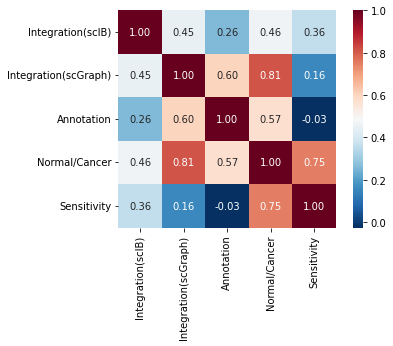

In [26]:
mask = np.triu(np.ones_like(task_corr, dtype=bool))
ticks = ["Integration(scIB)", "Integration(scGraph)", "Annotation", "Normal/Cancer", "Sensitivity"]
sns.heatmap(task_corr, annot=True, cmap="RdBu_r", fmt='.2f', xticklabels=ticks, yticklabels=ticks, square=True)  
# plt.savefig("figures/overall_ranking/task_spearman_corr.png", dpi=300, bbox_inches="tight")

## Overall ranking

In [48]:
# python >= 3.10
import funkyheatmappy
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from funkyheatmappy.funkyheatmappy import position_arguments

In [138]:
file = "../figures/overall_ranking/funkyheatmap_summary_copy.xlsx"
data = pd.read_excel(file, sheet_name="data")
column_info = pd.read_excel(file, sheet_name="column_info")
column_group = pd.read_excel(file, sheet_name="column_group")
palettes = pd.read_excel(file, sheet_name="palettes")

In [139]:
# data.loc[:, column_info[column_info["geom"]=="circle"].id]
for col in column_info[column_info["geom"]=="circle"].id:
    max_rank = data.loc[:, col].max()
    data[col] = data[col].apply(lambda x : max_rank+1-x)

In [140]:
data = data.fillna(0)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8 entries, 0 to 7
Data columns (total 27 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   id                            8 non-null      object 
 1   Overall ranking               8 non-null      float64
 2   Overall ranking_scIB          8 non-null      float64
 3   Overall ranking_scGraph       8 non-null      float64
 4   Overall ranking_annotation    8 non-null      float64
 5   Overall ranking_cancer        8 non-null      float64
 6   Overall ranking_sensitivity   8 non-null      float64
 7   Pancreas_scIB                 8 non-null      float64
 8   Immune_scIB                   8 non-null      float64
 9   HLCA_scIB                     8 non-null      float64
 10  Tabula Sapiens_scIB           8 non-null      float64
 11  HLCA_scGraph                  8 non-null      float64
 12  Tabula Sapiens_scGraph        8 non-null      float64
 13  HLCA_seen

In [141]:
column_group = column_group.fillna("")
column_group

,level1,level2,group,palette
0,Summary,Aggregated rankings,overall,overall
1,Cell clustering,scIB,scIB,palette1
2,Cell clustering,scGraph,scGraph,palette1
3,Cell type annotation,Seen,seen(intra-dataset),palette2
4,Cell type annotation,Seen\n(transfer),seen(cross-dataset),palette2
5,Cell type annotation,Unseen,unseen,palette2
6,Cancer cell,Per tissue evaluation,cancer,palette3
7,Drug sensitivity,Per drug evaluation,sensitivity,palette4


/data2/zhuyiheng/.conda/envs/immunity/lib/python3.10/site-packages/funkyheatmappy/verify_palettes.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  palettes = {row[0]: row[1] for _, row in palettes.iterrows()}
/data2/zhuyiheng/.conda/envs/immunity/lib/python3.10/site-packages/funkyheatmappy/calculate_positions.py:267: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  rect_data = pd.concat(
/data2/zhuyiheng/.conda/envs/immunity/lib/python3.10/site-packages/funkyheatmappy/calculate_positions.py:339: FutureWarning: The behavior of DataFrame concatenation with 

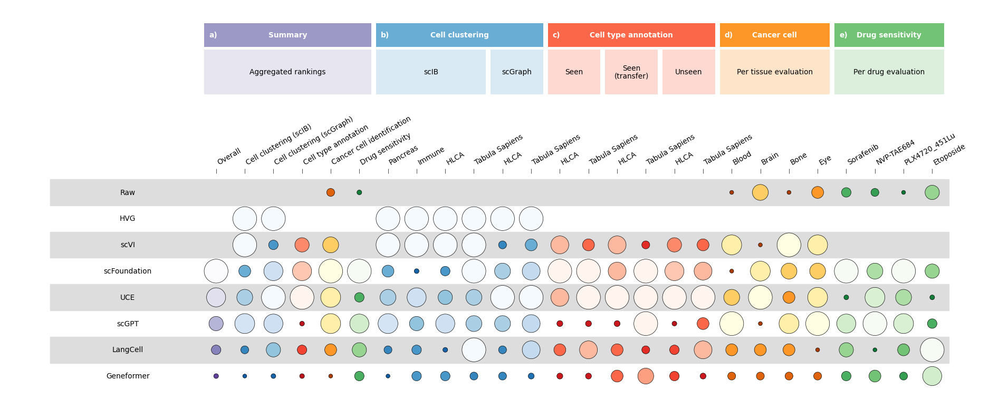

In [142]:
funkyheatmappy.funky_heatmap(data, column_info=column_info, column_groups=column_group, 
                             position_args=position_arguments(col_bigspace=0.2,col_space=0.2),
                             palettes=palettes)
plt.savefig("../figures/overall_ranking/funkyheatmap_all.png", dpi=300, bbox_inches="tight")

In [3]:
df = pd.read_csv("../figures/model_data_size.txt",sep="\t")
df.head()

,Model,Model parameters (M),Training data (M)
0,scGPT,50,33.0
1,Geneformer,40,30.0
2,UCE,650,36.0
3,xTrimoGene,100,50.0
4,LangCell,40,27.5


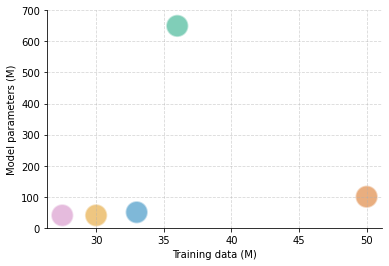

In [32]:
fig, ax = plt.subplots()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
sns.scatterplot(df, x="Training data (M)", y="Model parameters (M)", s=500, hue="Model", 
                ax=ax, palette="colorblind", alpha=0.5, legend=False)
# ax.tick_params(top=False, labeltop=False, bottom=True, labelbottom=True)
plt.grid(ls="--",alpha=0.5)
plt.ylim(0,700)
plt.savefig("../figures/model_info/model_data_size.png", dpi=300)

## Computational resource

In [40]:
df = pd.read_csv("../figures/computation_cost.txt",sep="\t")
df.head()

,Model,Total GPU memory (MB),GPU memory (MB),GPU memory (GB),Batch size
0,scVI,NaN,NaN,NaN,1
1,Geneformer,1306.0,982.0,1.0,1
2,scGPT,3680.0,3356.0,3.3,1
3,LangCell,1724.0,1400.0,1.4,1
4,UCE,6760.0,6436.0,6.3,1


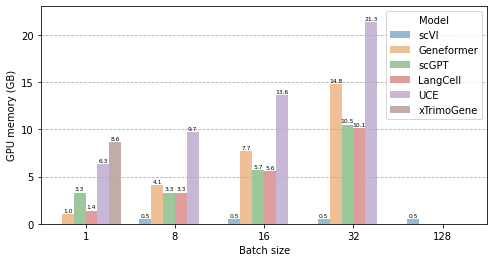

In [44]:
plt.figure(figsize=(8,4))
ax = sns.barplot(df, x="Batch size", y="GPU memory (GB)", hue="Model", alpha=0.5, width=0.8)
plt.grid(axis="y", ls="--")
for p in ax.patches:
    if p.get_height() > 0:
        ax.text(p.get_x() + p.get_width() / 2, p.get_height()+0.1, 
                f'{p.get_height():.1f}', 
                ha='center', va='bottom', fontdict={"fontsize":6})
ax.set_ylim(0, 23)
plt.savefig("../figures/gpu_memory.png",dpi=300)

In [46]:
df = pd.read_csv("../figures/computation_time.txt",sep="\t")
df

,Model,Time (s),Batch size
0,scVI,625.6,128
1,Geneformer,556.1,32
2,scGPT,91.7,32
3,LangCell,487.5,32
4,UCE,1889.7,32
5,xTrimoGene,4247.1,1


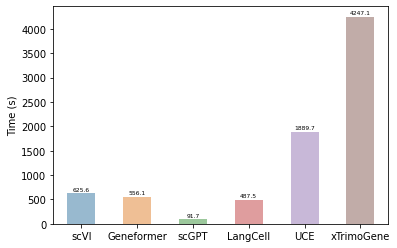

In [55]:
# plt.figure(figsize=(8,4))
ax = sns.barplot(df, x="Model", y="Time (s)", hue="Model", alpha=0.5, width=0.5, zorder=1)
# plt.grid(axis="x", ls="--", zorder=0)
for p in ax.patches:
    if p.get_height() > 0:
        ax.text(p.get_x() + p.get_width() / 2, p.get_height()+30, 
                f'{p.get_height():.1f}', 
                ha='center', va='bottom', fontdict={"fontsize":6})
ax.set_xlabel("")
plt.savefig("../figures/pancreas_extract_emb_time.png",dpi=300)